<a href="https://colab.research.google.com/github/Khaled-Abdelhamid/Vanilla-GANs-generator-loass-function-comaprison/blob/master/GAN_a.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%tensorboard --logdir ./content --bind_all

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2020-06-03 13:42:20.699549: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Traceback (most recent call last):
  File "/usr/local/bin/tensorboard", line 8, in <module>
    sys.exit(run_main())
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/main.py", line 75, in run_main
    app.run(tensorboard.main, flags_parser=tensorboard.configure)
  File "/usr/local/lib/python3.6/dist-packages/absl/app.py", line 299, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.6/dist-packages/absl/app.py", line 250, in _run_main
    sys.exit(main(argv))
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/program.py", line 290, in main
    return runner(self.flags) or 0
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/program.py", line 306, in _run_serve_subcommand
    server = self._make_server()
  File "/usr/local/lib/python3

In [0]:
!pip3 install tensorboardX

In [0]:
import torch
from torch import nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd.variable import Variable
from torchvision import transforms
from torchvision.datasets import MNIST
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib inline
import warnings
import numpy as np
from utils import Logger


In [0]:
 from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [0]:
device = torch.device("cuda:0")
is_cuda = torch.cuda.is_available()
print (torch.cuda.get_device_name(0))

Tesla K80


In [0]:
def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((.5,),(.5,))
        ])
    out_dir = './data'
    return MNIST(root=out_dir, train=True, transform=compose, download=True)

In [0]:
# Load data
data = mnist_data()
# Create loader with data, so that we can iterate over it
batch_size=100
data_loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True)
# Num batches
num_batches = len(data_loader)

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


In [0]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x


In [0]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

In [0]:
# instantiate discriminator and generator
discriminator = DiscriminatorNet()
generator = GeneratorNet()
# check that they are as you expect
print(discriminator)
print()
print(generator)

DiscriminatorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=256, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

GeneratorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=100, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=1024, bias=True)
    

In [0]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
loss = nn.BCELoss()


In [0]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [0]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [0]:
def noise(size,input_features=100):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, input_features))
    return n

In [0]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [0]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, zeros_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, ones_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    # Return error
    return error_real + error_fake

In [0]:
num_test_samples = 16
test_noise = noise(num_test_samples)

In [0]:
# Create logger instance
logger = Logger(model_name='GAN_a', data_name='MNIST')

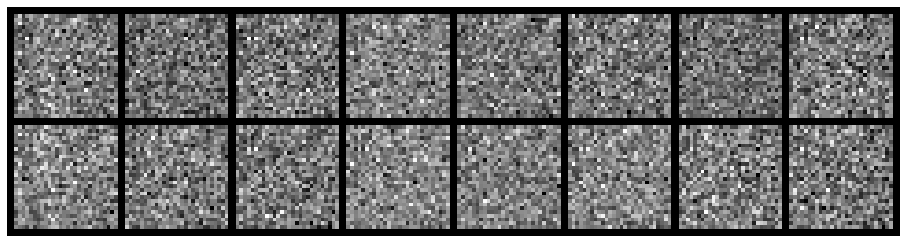

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3907, Generator Loss: 1.5594
D(x): 0.5009, D(G(z)): 0.5028
gen_epochs:1 ,dis_epochs:1


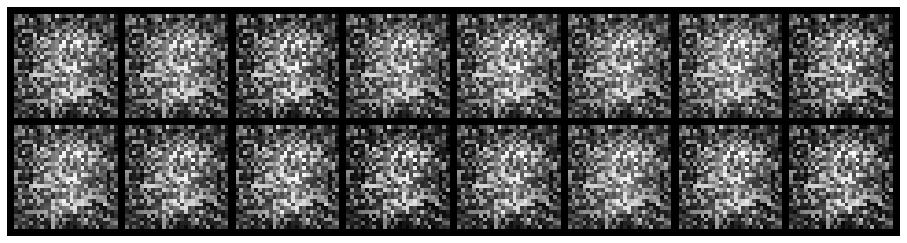

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 2.1496, Generator Loss: 2.2407
D(x): 0.8157, D(G(z)): 0.8387
gen_epochs:1 ,dis_epochs:1


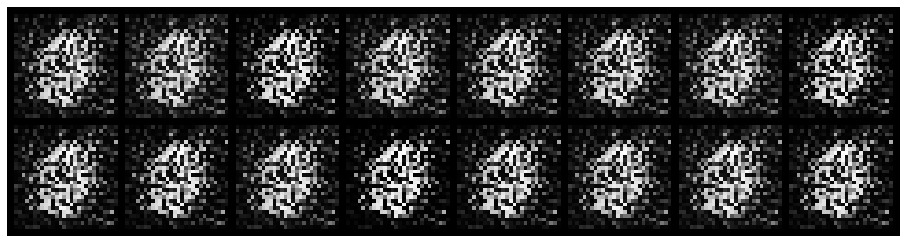

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.3158, Generator Loss: 6.1691
D(x): 0.8800, D(G(z)): 0.1520
gen_epochs:1 ,dis_epochs:1


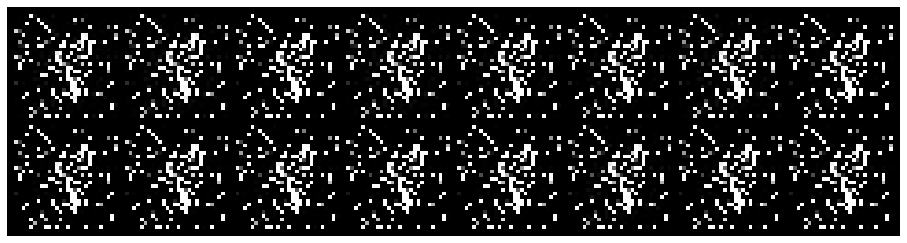

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0188, Generator Loss: 12.3596
D(x): 0.9962, D(G(z)): 0.0137
gen_epochs:1 ,dis_epochs:1


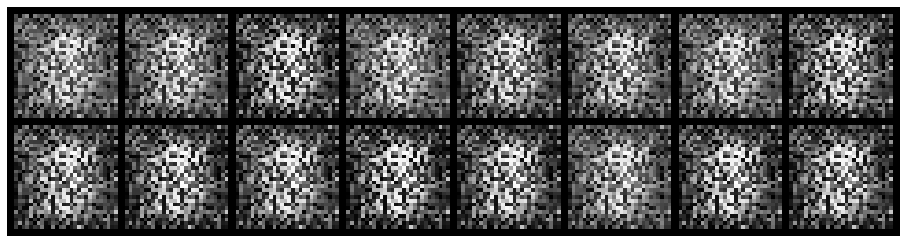

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.6554, Generator Loss: 8.0040
D(x): 0.8749, D(G(z)): 0.3021
gen_epochs:1 ,dis_epochs:1


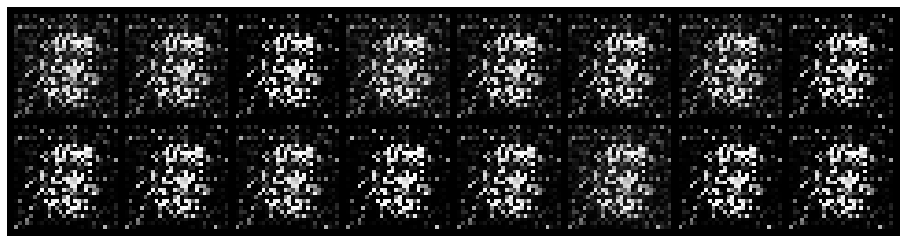

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.1639, Generator Loss: 11.4123
D(x): 0.9373, D(G(z)): 0.0493
gen_epochs:1 ,dis_epochs:1


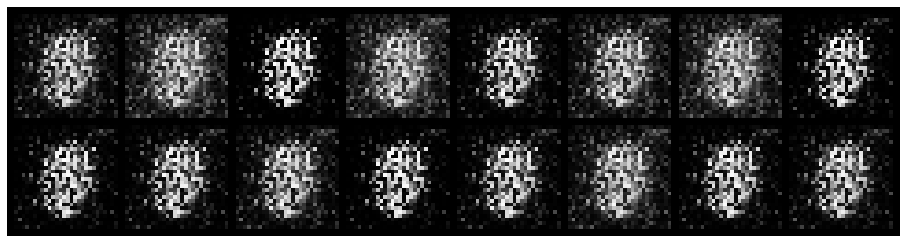

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.5093, Generator Loss: 9.4581
D(x): 0.8828, D(G(z)): 0.2235
gen_epochs:1 ,dis_epochs:1


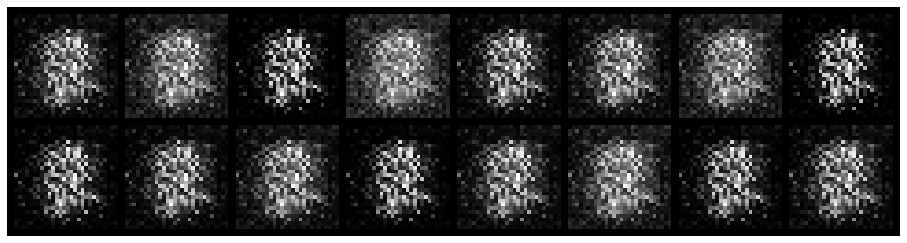

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.8178, Generator Loss: 6.1983
D(x): 0.8411, D(G(z)): 0.3279
gen_epochs:1 ,dis_epochs:1


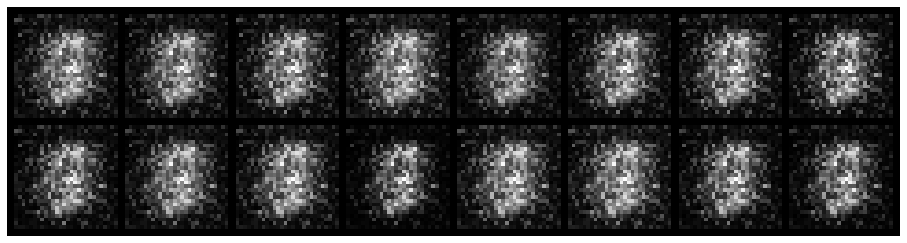

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 1.0712, Generator Loss: 3.7928
D(x): 0.6688, D(G(z)): 0.3799
gen_epochs:1 ,dis_epochs:1


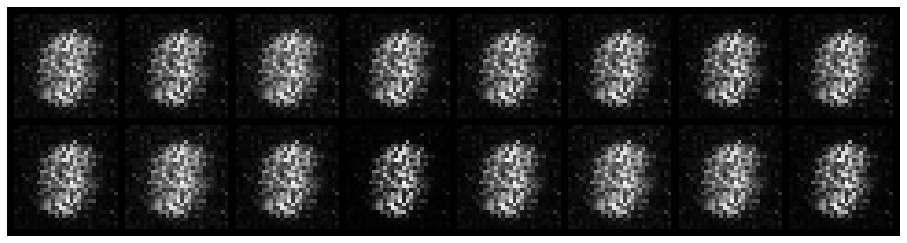

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.4251, Generator Loss: 4.6207
D(x): 0.8284, D(G(z)): 0.1673
gen_epochs:1 ,dis_epochs:1


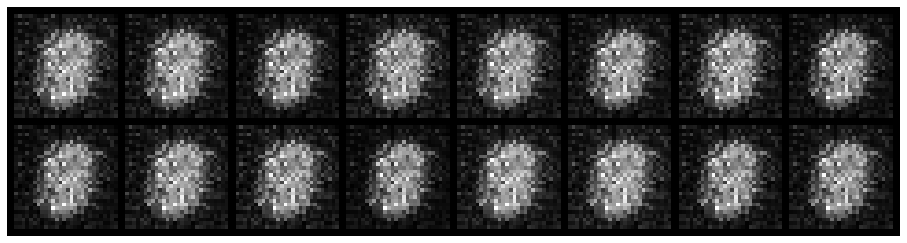

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.7702, Generator Loss: 4.9267
D(x): 0.7967, D(G(z)): 0.2560
gen_epochs:1 ,dis_epochs:1


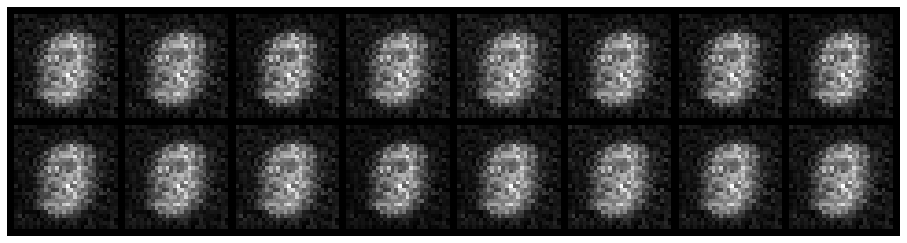

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.6135, Generator Loss: 1.9875
D(x): 0.6382, D(G(z)): 0.6213
gen_epochs:1 ,dis_epochs:1


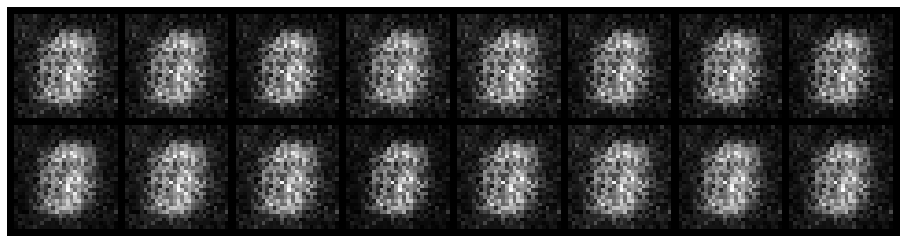

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.0076, Generator Loss: 3.3079
D(x): 0.7472, D(G(z)): 0.4241
gen_epochs:1 ,dis_epochs:1


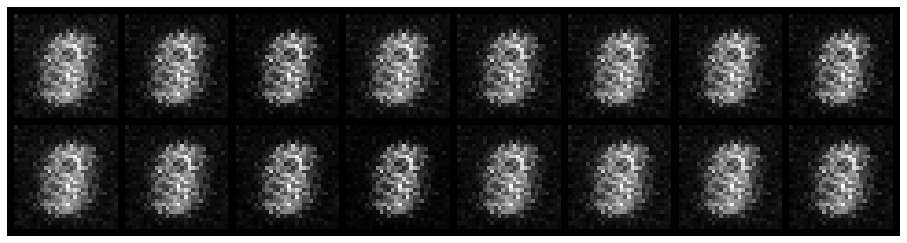

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.4261, Generator Loss: 3.6246
D(x): 0.6808, D(G(z)): 0.4315
gen_epochs:1 ,dis_epochs:1


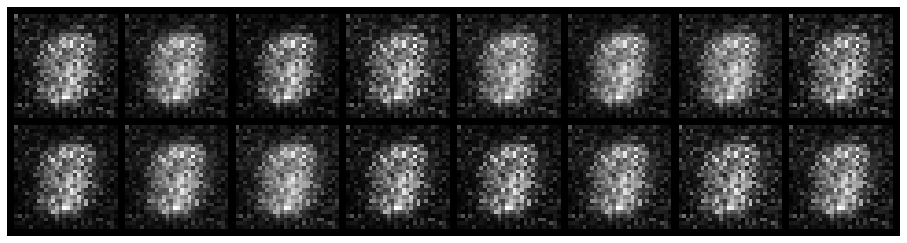

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.9004, Generator Loss: 4.3739
D(x): 0.8211, D(G(z)): 0.3813
gen_epochs:1 ,dis_epochs:1


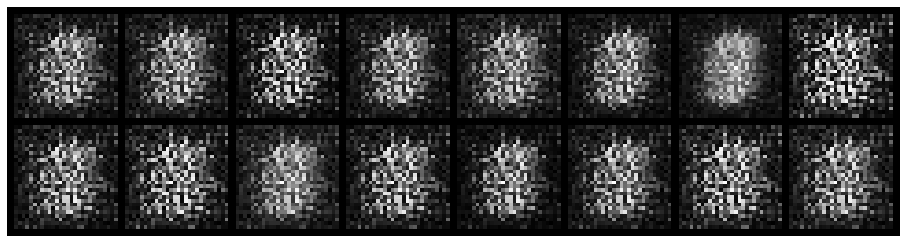

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.8445, Generator Loss: 6.5579
D(x): 0.8485, D(G(z)): 0.3255
gen_epochs:1 ,dis_epochs:1


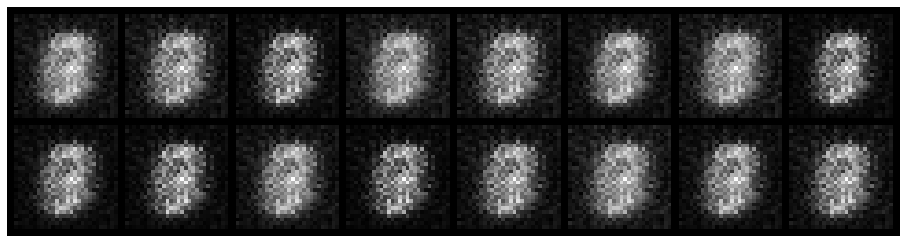

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.8392, Generator Loss: 3.4525
D(x): 0.7536, D(G(z)): 0.3476
gen_epochs:1 ,dis_epochs:1


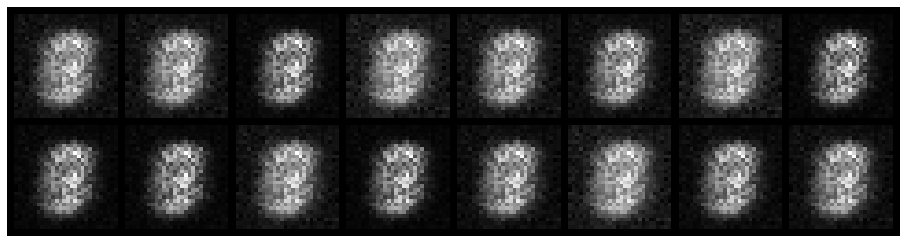

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.4809, Generator Loss: 4.3748
D(x): 0.7671, D(G(z)): 0.1512
gen_epochs:1 ,dis_epochs:1


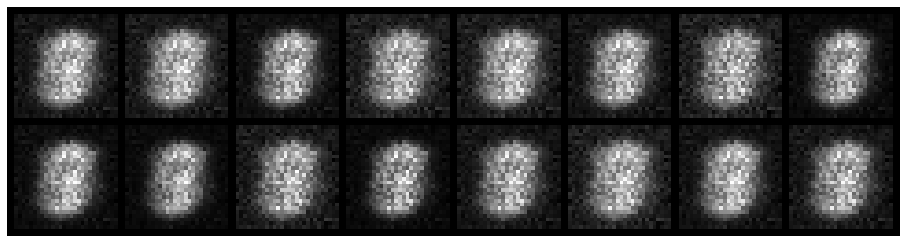

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.8712, Generator Loss: 3.1739
D(x): 0.6710, D(G(z)): 0.2773
gen_epochs:1 ,dis_epochs:1


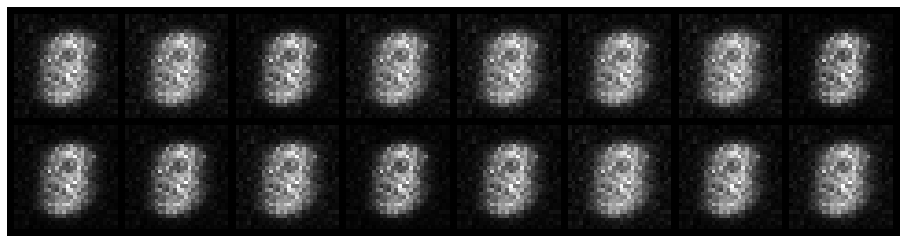

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.2073, Generator Loss: 7.7536
D(x): 0.9188, D(G(z)): 0.0796
gen_epochs:1 ,dis_epochs:1


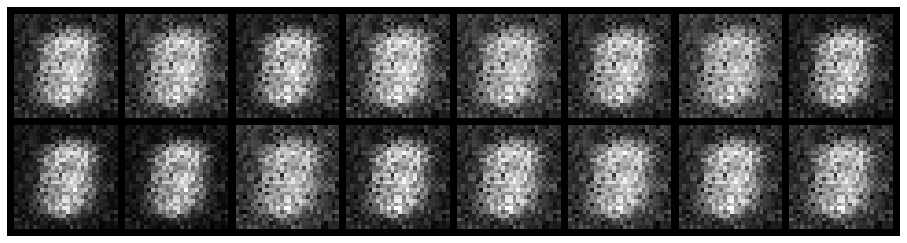

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.1840, Generator Loss: 7.8333
D(x): 0.9625, D(G(z)): 0.1195
gen_epochs:1 ,dis_epochs:1


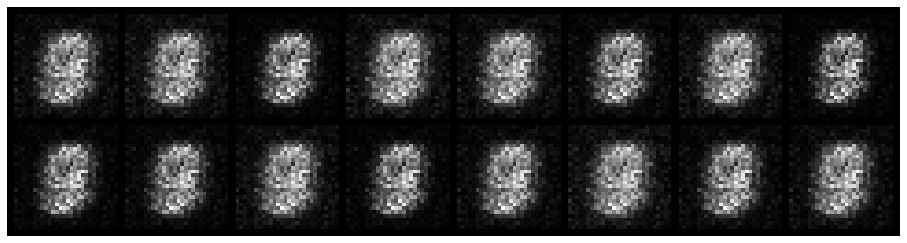

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.3160, Generator Loss: 7.8139
D(x): 0.9211, D(G(z)): 0.1627
gen_epochs:1 ,dis_epochs:1


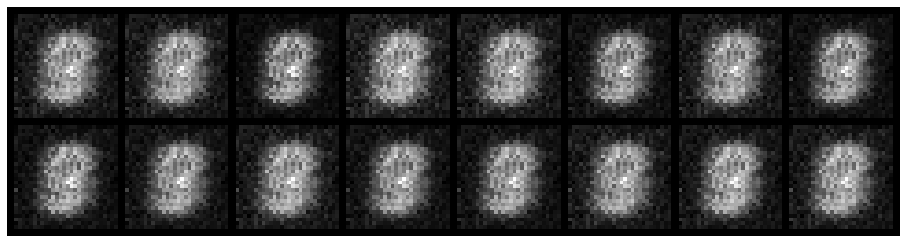

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 1.0553, Generator Loss: 5.5559
D(x): 0.6985, D(G(z)): 0.2192
gen_epochs:1 ,dis_epochs:1


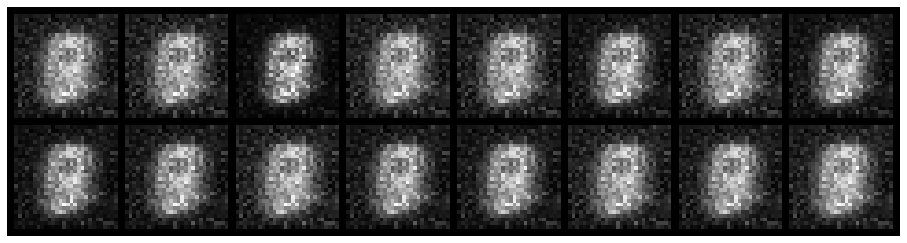

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.3547, Generator Loss: 9.8519
D(x): 0.8840, D(G(z)): 0.0934
gen_epochs:1 ,dis_epochs:1


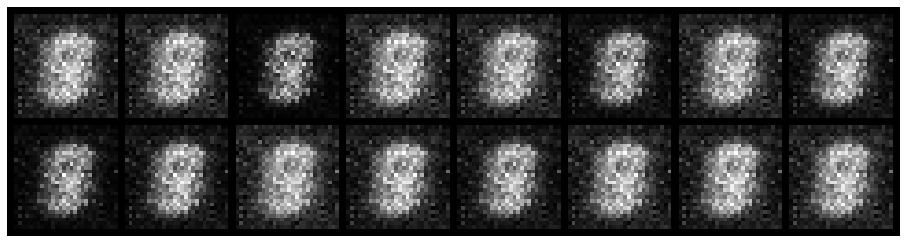

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.6168, Generator Loss: 7.6509
D(x): 0.8640, D(G(z)): 0.2347
gen_epochs:1 ,dis_epochs:1


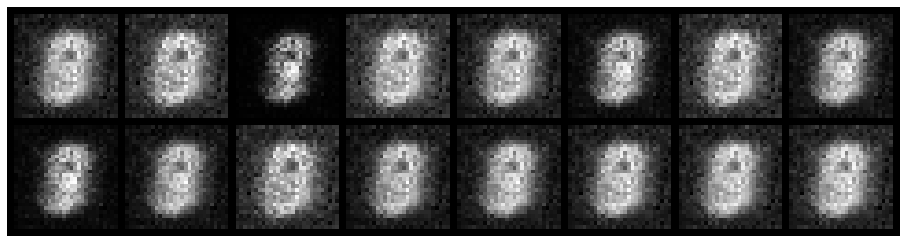

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.2155, Generator Loss: 9.2434
D(x): 0.9550, D(G(z)): 0.1037
gen_epochs:1 ,dis_epochs:1


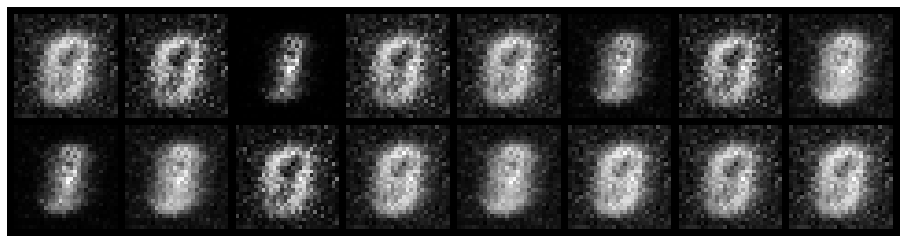

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.4120, Generator Loss: 9.7426
D(x): 0.9106, D(G(z)): 0.1885
gen_epochs:1 ,dis_epochs:1


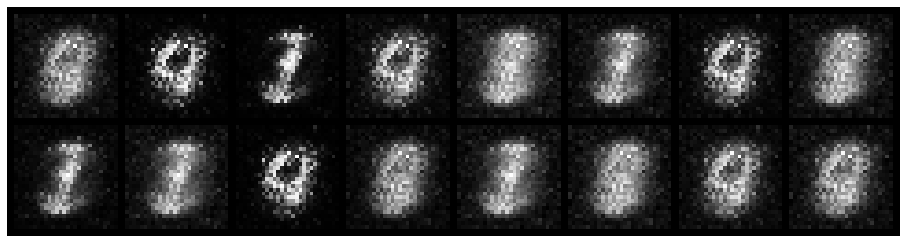

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.6179, Generator Loss: 7.8359
D(x): 0.8360, D(G(z)): 0.2164
gen_epochs:1 ,dis_epochs:1


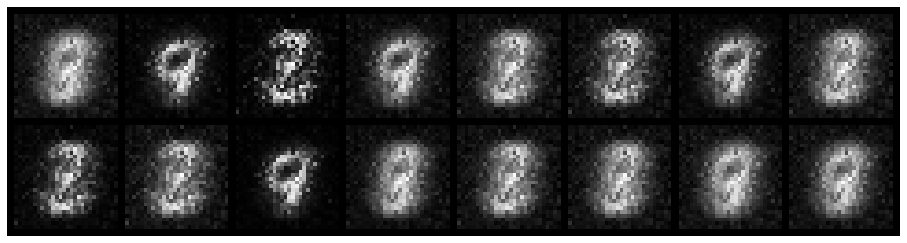

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.4323, Generator Loss: 9.1992
D(x): 0.8724, D(G(z)): 0.1299
gen_epochs:1 ,dis_epochs:1


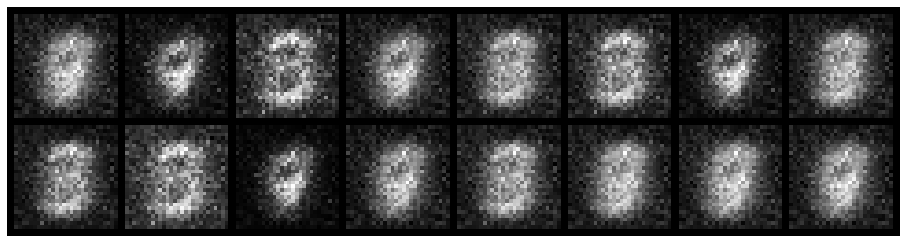

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.3510, Generator Loss: 14.9686
D(x): 0.8818, D(G(z)): 0.0698
gen_epochs:1 ,dis_epochs:1


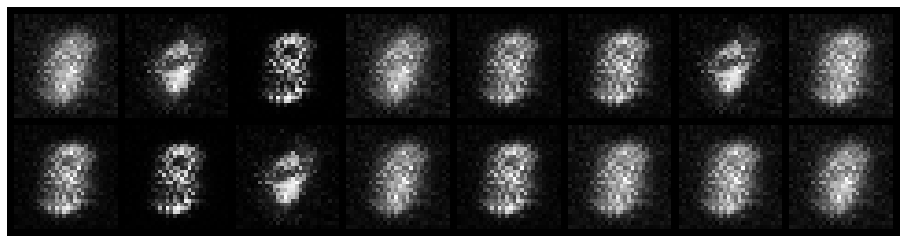

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.4309, Generator Loss: 13.1817
D(x): 0.8751, D(G(z)): 0.0637
gen_epochs:1 ,dis_epochs:1


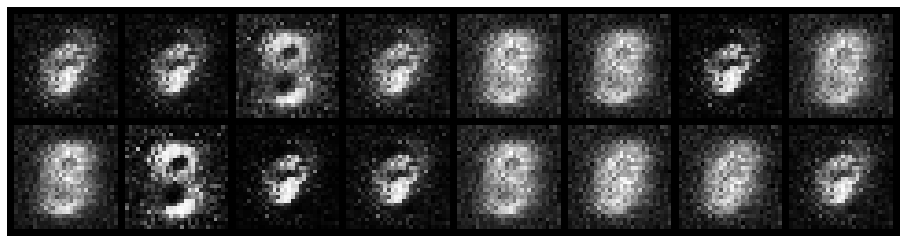

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.4820, Generator Loss: 14.3117
D(x): 0.8775, D(G(z)): 0.1763
gen_epochs:1 ,dis_epochs:1


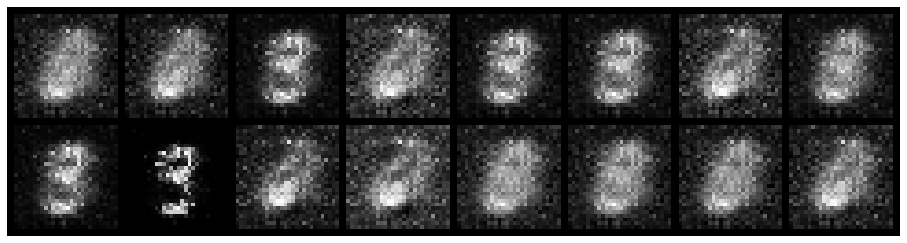

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.2296, Generator Loss: 15.2230
D(x): 0.9643, D(G(z)): 0.0935
gen_epochs:1 ,dis_epochs:1


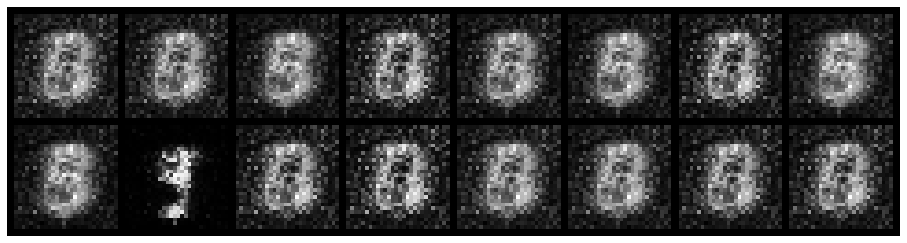

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.1687, Generator Loss: 14.8515
D(x): 0.9740, D(G(z)): 0.1099
gen_epochs:1 ,dis_epochs:1


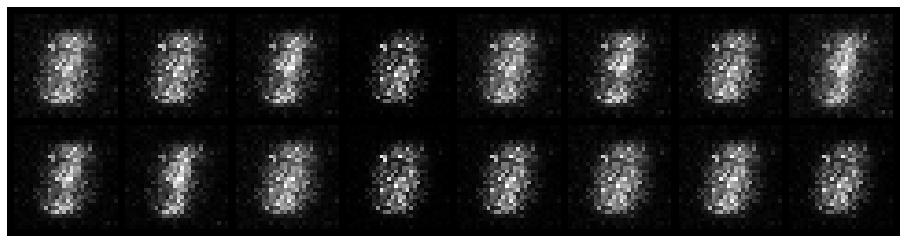

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.3672, Generator Loss: 16.1590
D(x): 0.9062, D(G(z)): 0.1165
gen_epochs:1 ,dis_epochs:1


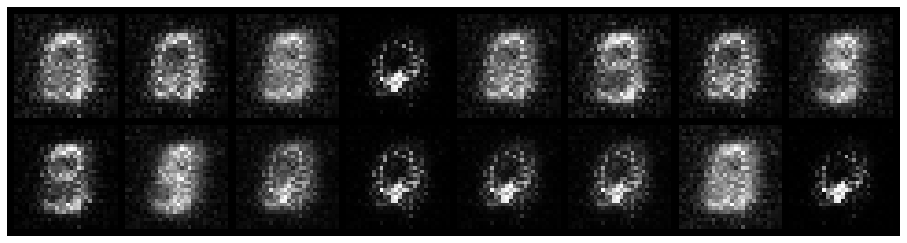

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.1701, Generator Loss: 21.7770
D(x): 0.9488, D(G(z)): 0.0524
gen_epochs:1 ,dis_epochs:1


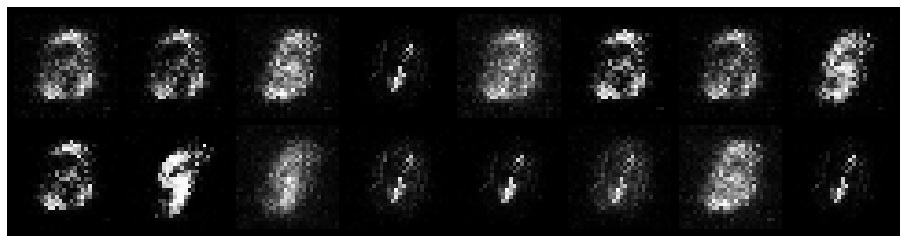

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.4834, Generator Loss: 9.8973
D(x): 0.8634, D(G(z)): 0.0483
gen_epochs:1 ,dis_epochs:1


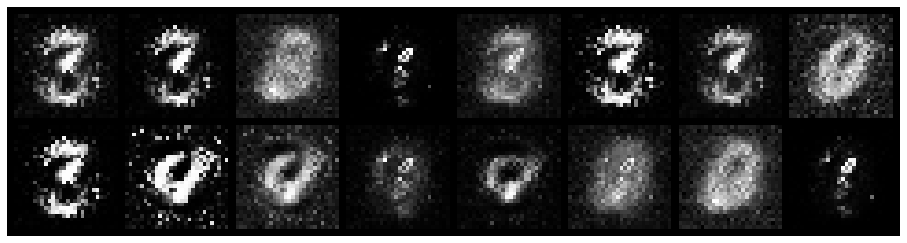

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.4069, Generator Loss: 7.1830
D(x): 0.8717, D(G(z)): 0.1625
gen_epochs:1 ,dis_epochs:1


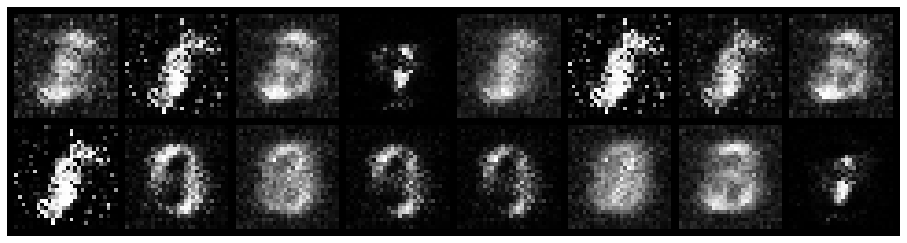

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.5654, Generator Loss: 5.8837
D(x): 0.8395, D(G(z)): 0.2310
gen_epochs:1 ,dis_epochs:1


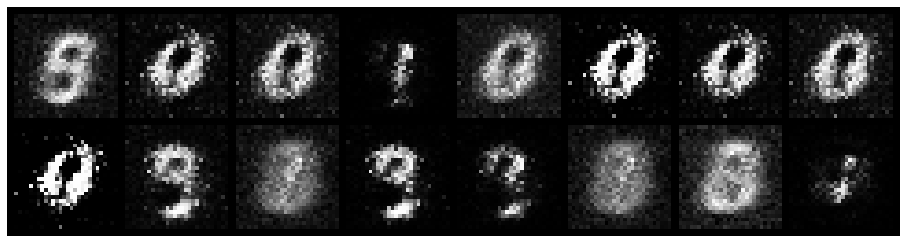

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.2606, Generator Loss: 9.0114
D(x): 0.9017, D(G(z)): 0.0797
gen_epochs:1 ,dis_epochs:1


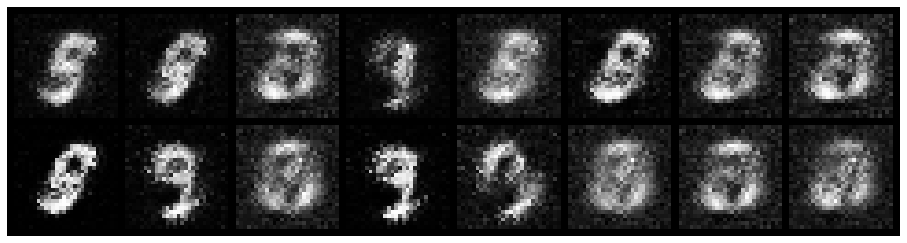

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.3896, Generator Loss: 10.5553
D(x): 0.9259, D(G(z)): 0.1749
gen_epochs:1 ,dis_epochs:1


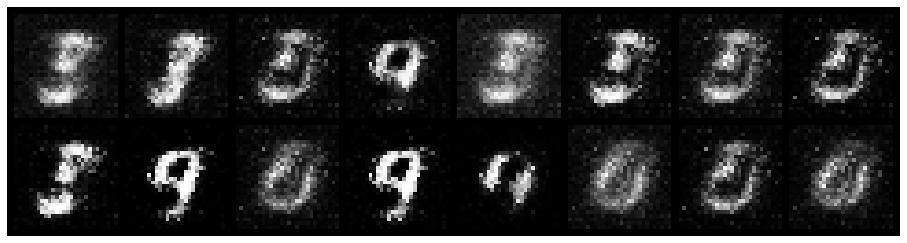

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.7151, Generator Loss: 7.8120
D(x): 0.8568, D(G(z)): 0.2333
gen_epochs:1 ,dis_epochs:1


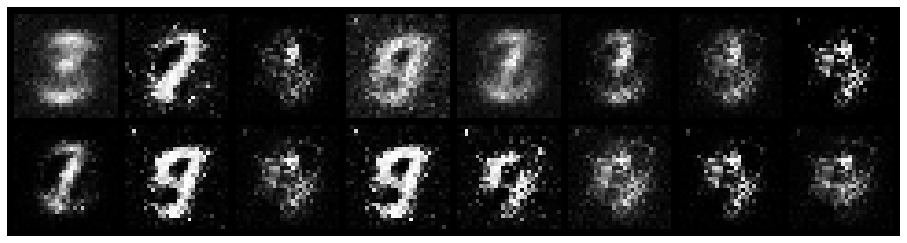

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.7135, Generator Loss: 6.2783
D(x): 0.7567, D(G(z)): 0.1339
gen_epochs:1 ,dis_epochs:1


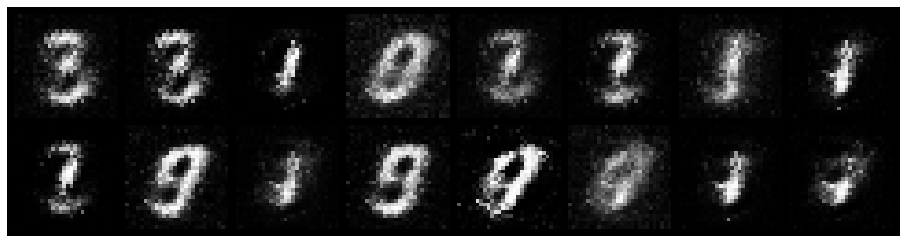

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.4413, Generator Loss: 8.3379
D(x): 0.8886, D(G(z)): 0.1499
gen_epochs:1 ,dis_epochs:1


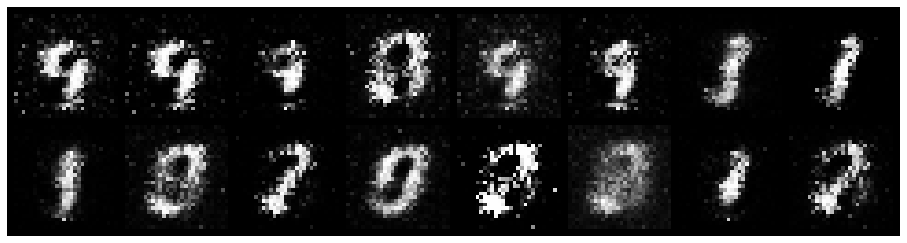

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.7283, Generator Loss: 5.3317
D(x): 0.7551, D(G(z)): 0.1846
gen_epochs:1 ,dis_epochs:1


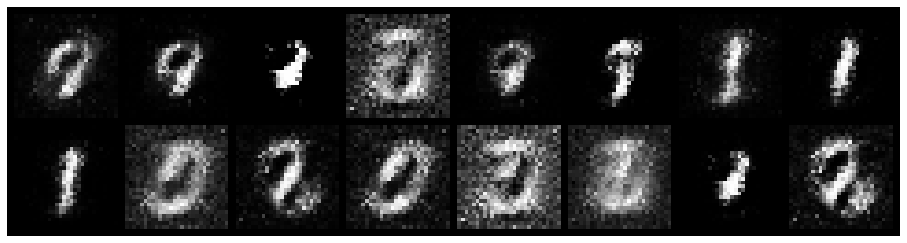

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.6045, Generator Loss: 6.5470
D(x): 0.8194, D(G(z)): 0.1530
gen_epochs:1 ,dis_epochs:1


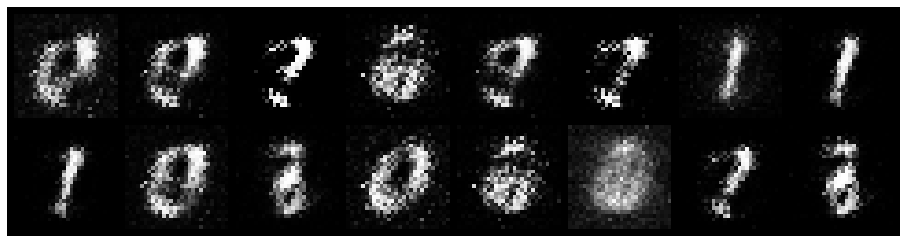

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.4421, Generator Loss: 9.0647
D(x): 0.9080, D(G(z)): 0.1966
gen_epochs:1 ,dis_epochs:1


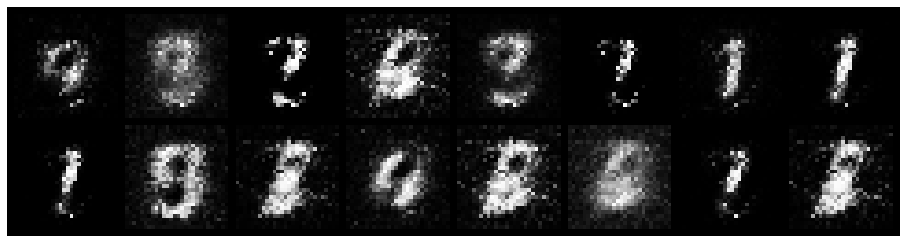

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.3564, Generator Loss: 7.4038
D(x): 0.8696, D(G(z)): 0.1154
gen_epochs:1 ,dis_epochs:1


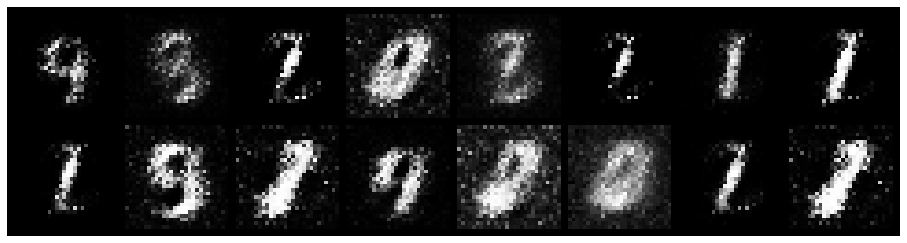

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.3979, Generator Loss: 8.7480
D(x): 0.8927, D(G(z)): 0.1462
gen_epochs:1 ,dis_epochs:1


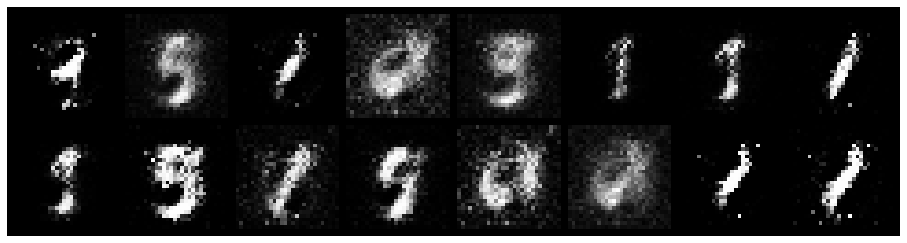

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.4996, Generator Loss: 9.2668
D(x): 0.8665, D(G(z)): 0.1647
gen_epochs:1 ,dis_epochs:1


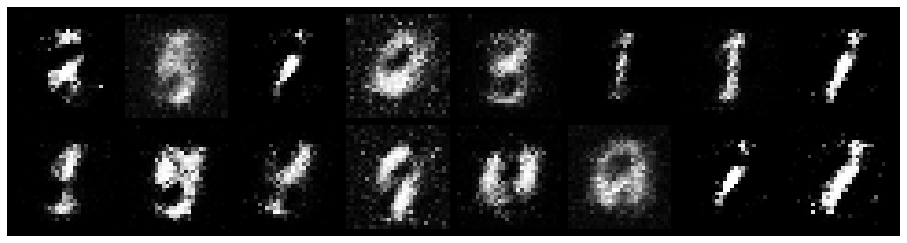

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.3543, Generator Loss: 7.3239
D(x): 0.9074, D(G(z)): 0.1630
gen_epochs:1 ,dis_epochs:1


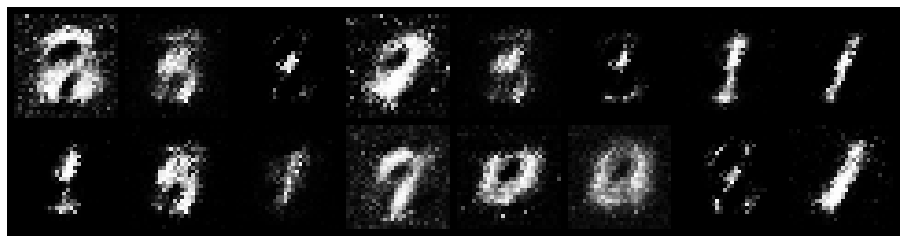

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.5205, Generator Loss: 6.5695
D(x): 0.8074, D(G(z)): 0.1506
gen_epochs:1 ,dis_epochs:1


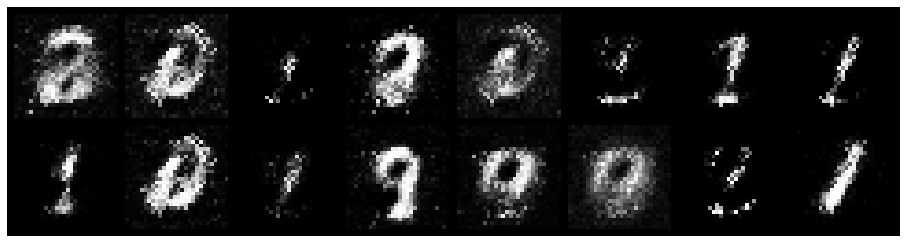

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.5810, Generator Loss: 6.2115
D(x): 0.7929, D(G(z)): 0.1396
gen_epochs:1 ,dis_epochs:1


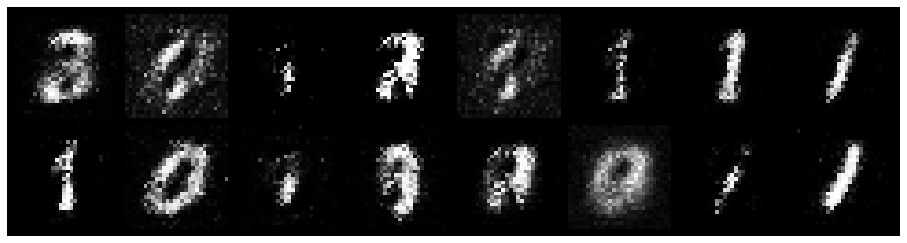

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.4044, Generator Loss: 8.7258
D(x): 0.8556, D(G(z)): 0.0937
gen_epochs:1 ,dis_epochs:1


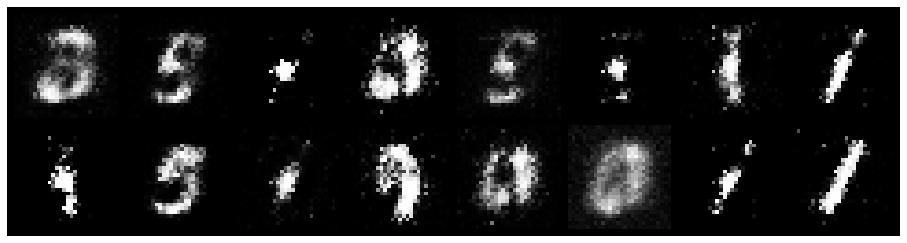

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.5114, Generator Loss: 5.2574
D(x): 0.8020, D(G(z)): 0.1684
gen_epochs:1 ,dis_epochs:1


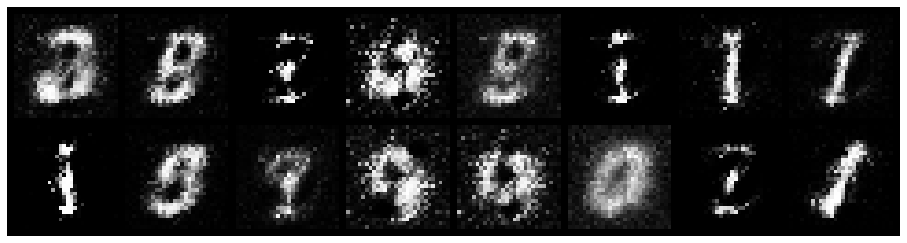

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.5691, Generator Loss: 5.7174
D(x): 0.8369, D(G(z)): 0.2021
gen_epochs:1 ,dis_epochs:1


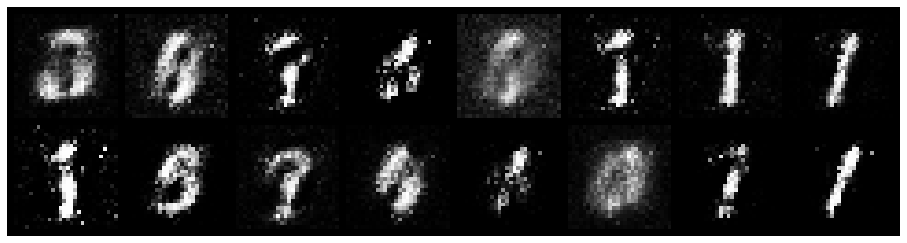

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.6014, Generator Loss: 6.6643
D(x): 0.7491, D(G(z)): 0.0716
gen_epochs:1 ,dis_epochs:1


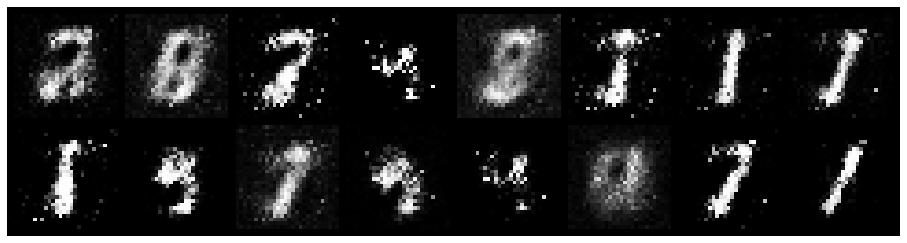

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.7131, Generator Loss: 6.4835
D(x): 0.7667, D(G(z)): 0.1718
gen_epochs:1 ,dis_epochs:1


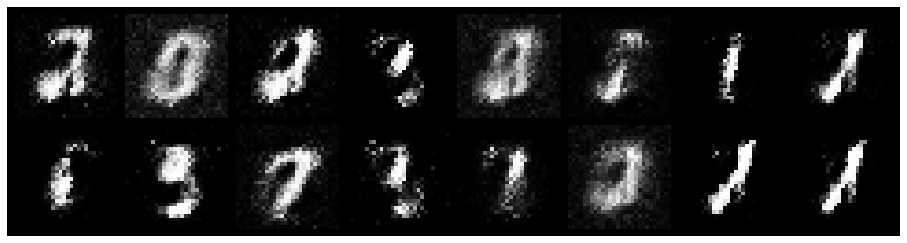

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.5397, Generator Loss: 7.0542
D(x): 0.8240, D(G(z)): 0.1881
gen_epochs:1 ,dis_epochs:1


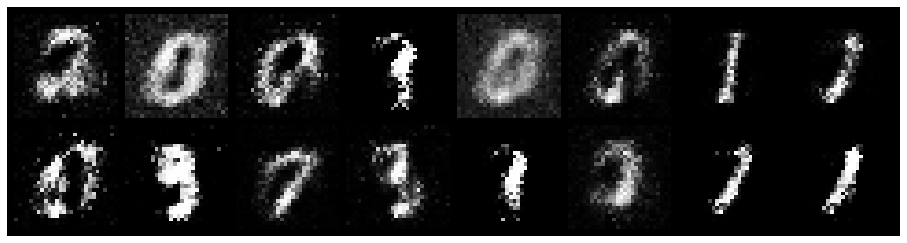

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.6361, Generator Loss: 6.8709
D(x): 0.7782, D(G(z)): 0.1244
gen_epochs:1 ,dis_epochs:1


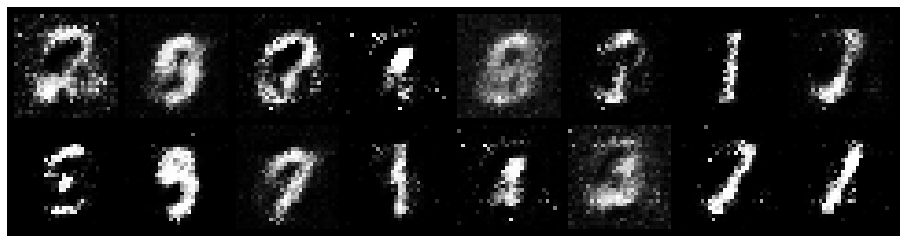

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.6360, Generator Loss: 6.0476
D(x): 0.7924, D(G(z)): 0.2190
gen_epochs:1 ,dis_epochs:1


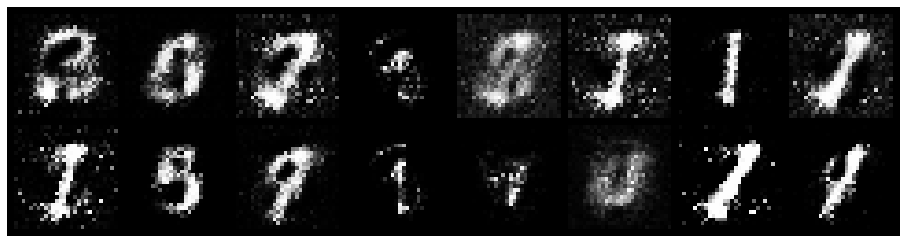

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.6419, Generator Loss: 5.6214
D(x): 0.8054, D(G(z)): 0.2602
gen_epochs:1 ,dis_epochs:1


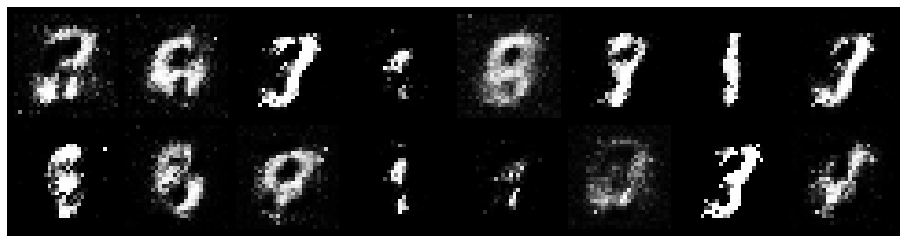

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.8190, Generator Loss: 6.2959
D(x): 0.7275, D(G(z)): 0.1046
gen_epochs:1 ,dis_epochs:1


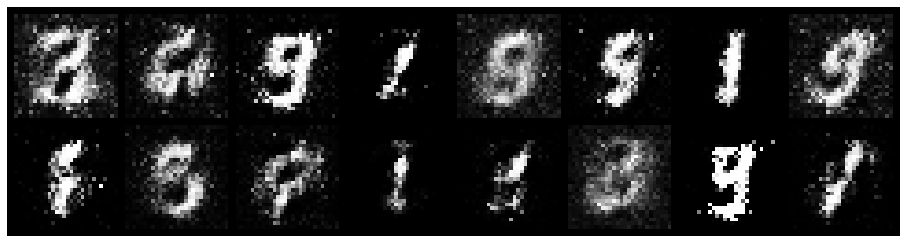

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.4945, Generator Loss: 7.2105
D(x): 0.8183, D(G(z)): 0.1457
gen_epochs:1 ,dis_epochs:1


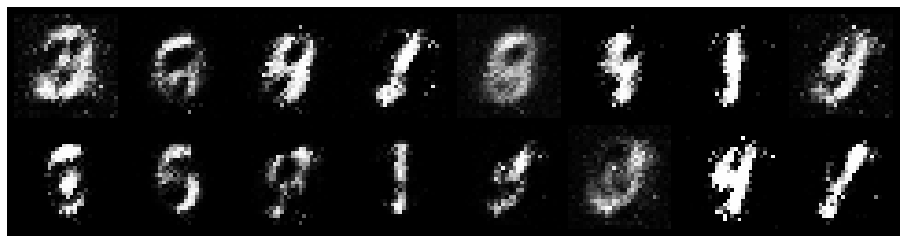

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.6516, Generator Loss: 6.2904
D(x): 0.8038, D(G(z)): 0.2254
gen_epochs:1 ,dis_epochs:1


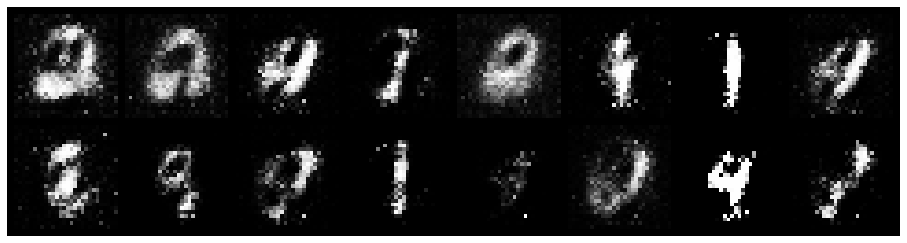

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.9301, Generator Loss: 5.2781
D(x): 0.6480, D(G(z)): 0.1656
gen_epochs:1 ,dis_epochs:1


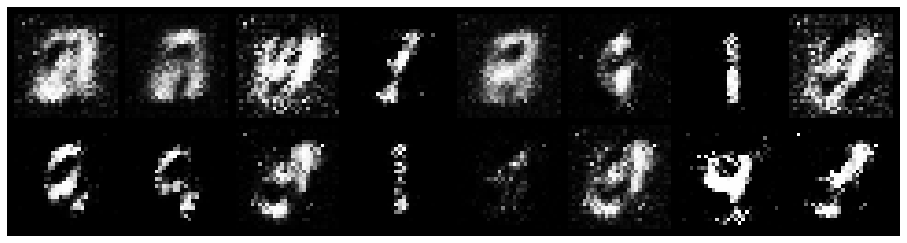

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.7264, Generator Loss: 10.4653
D(x): 0.8054, D(G(z)): 0.2192
gen_epochs:1 ,dis_epochs:1


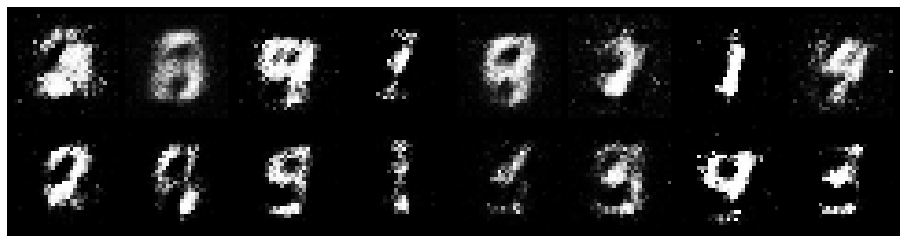

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.5320, Generator Loss: 8.6743
D(x): 0.7984, D(G(z)): 0.1110
gen_epochs:1 ,dis_epochs:1


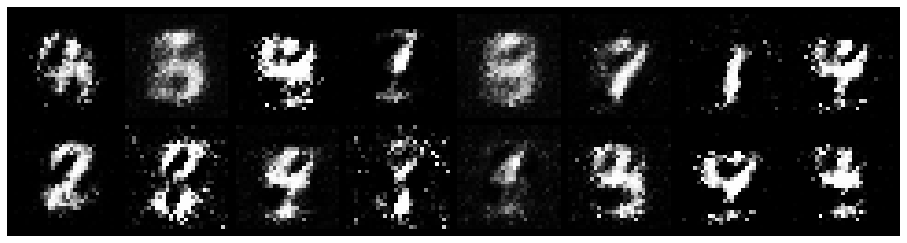

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.9339, Generator Loss: 4.4496
D(x): 0.7015, D(G(z)): 0.2335
gen_epochs:1 ,dis_epochs:1


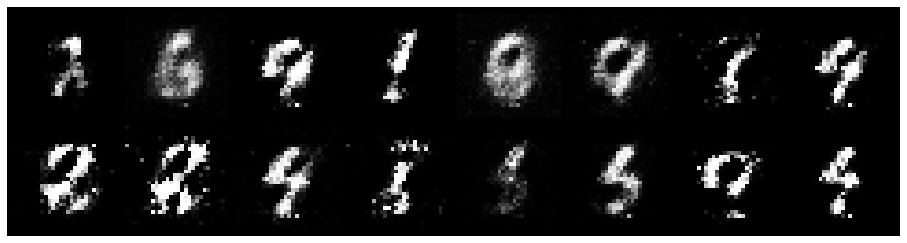

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.8431, Generator Loss: 6.5132
D(x): 0.7836, D(G(z)): 0.2279
gen_epochs:1 ,dis_epochs:1


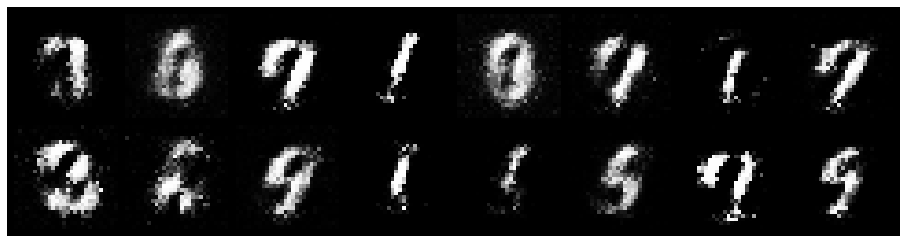

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.7684, Generator Loss: 5.0423
D(x): 0.7877, D(G(z)): 0.2454
gen_epochs:1 ,dis_epochs:1


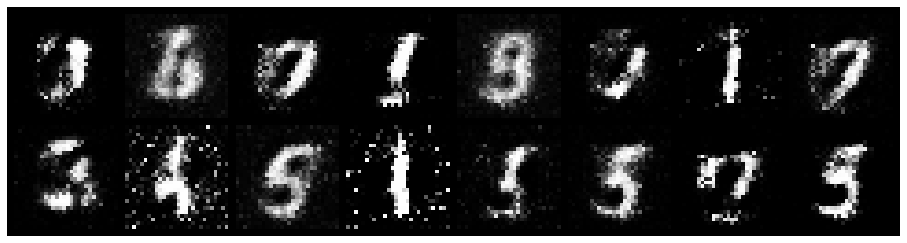

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.6685, Generator Loss: 5.1343
D(x): 0.7796, D(G(z)): 0.2334
gen_epochs:1 ,dis_epochs:1


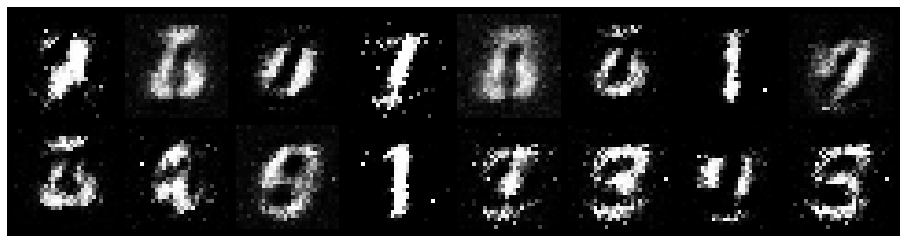

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.6827, Generator Loss: 5.1364
D(x): 0.7623, D(G(z)): 0.2022
gen_epochs:1 ,dis_epochs:1


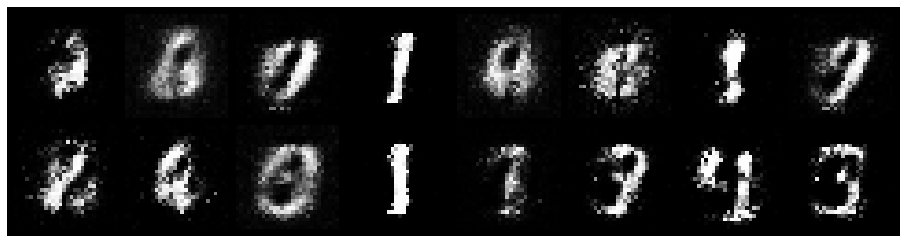

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.6350, Generator Loss: 5.6888
D(x): 0.8146, D(G(z)): 0.2134
gen_epochs:1 ,dis_epochs:1


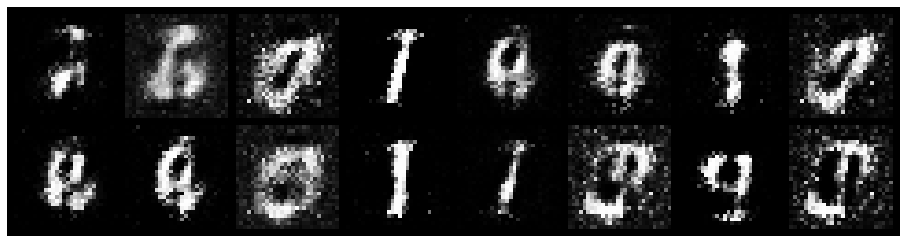

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.5970, Generator Loss: 7.2507
D(x): 0.8548, D(G(z)): 0.2032
gen_epochs:1 ,dis_epochs:1


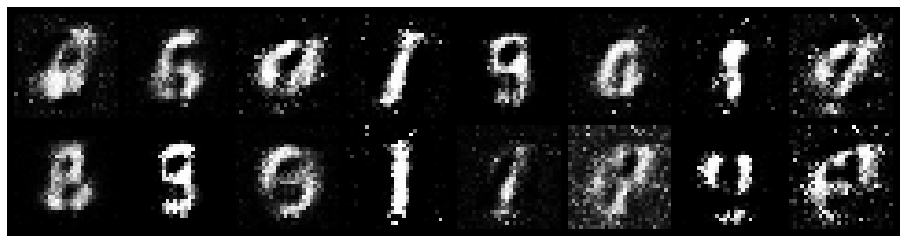

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.4839, Generator Loss: 6.0656
D(x): 0.8419, D(G(z)): 0.1865
gen_epochs:1 ,dis_epochs:1


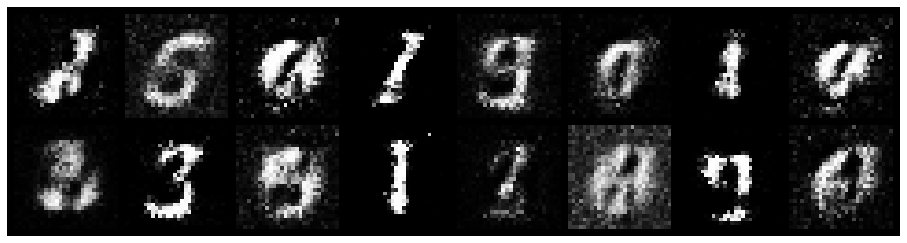

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.7815, Generator Loss: 4.8272
D(x): 0.7545, D(G(z)): 0.2442
gen_epochs:1 ,dis_epochs:1


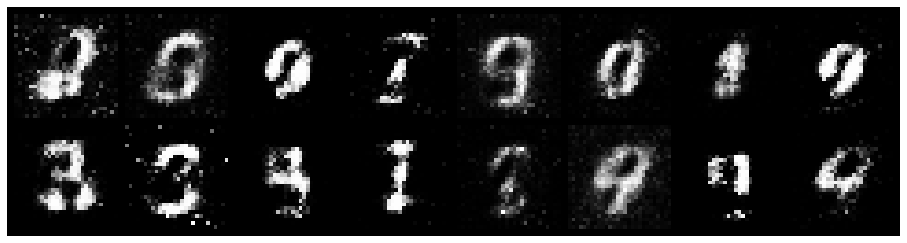

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.5987, Generator Loss: 5.4697
D(x): 0.8551, D(G(z)): 0.2401
gen_epochs:1 ,dis_epochs:1


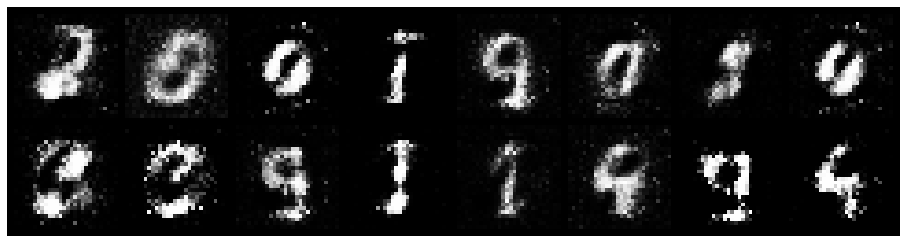

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.5598, Generator Loss: 5.6284
D(x): 0.8132, D(G(z)): 0.1814
gen_epochs:1 ,dis_epochs:1


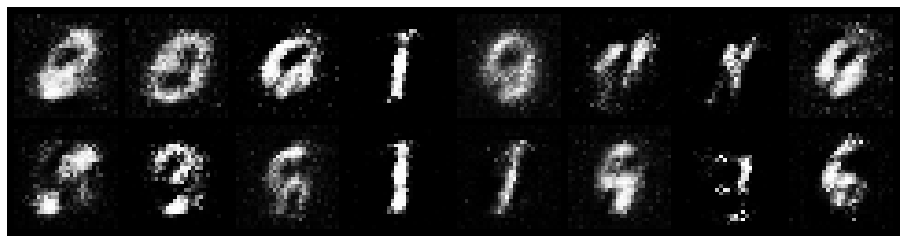

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.8123, Generator Loss: 4.8462
D(x): 0.7075, D(G(z)): 0.1796
gen_epochs:1 ,dis_epochs:1


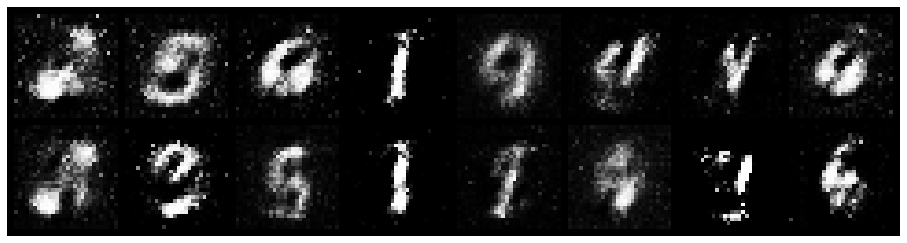

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.7509, Generator Loss: 4.1322
D(x): 0.7175, D(G(z)): 0.2395
gen_epochs:1 ,dis_epochs:1


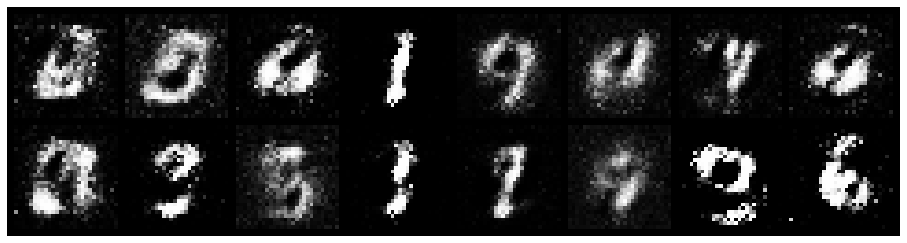

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.9452, Generator Loss: 3.4132
D(x): 0.7677, D(G(z)): 0.3710
gen_epochs:1 ,dis_epochs:1


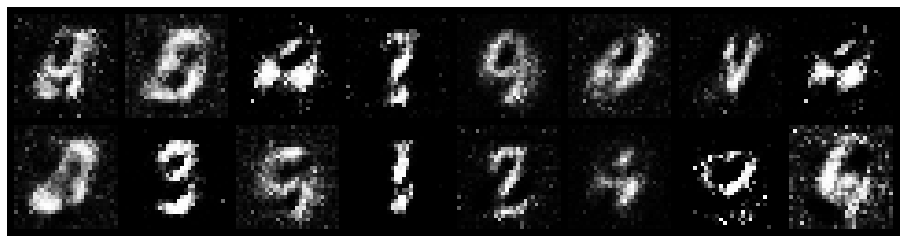

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.6964, Generator Loss: 4.9491
D(x): 0.7536, D(G(z)): 0.2054
gen_epochs:1 ,dis_epochs:1


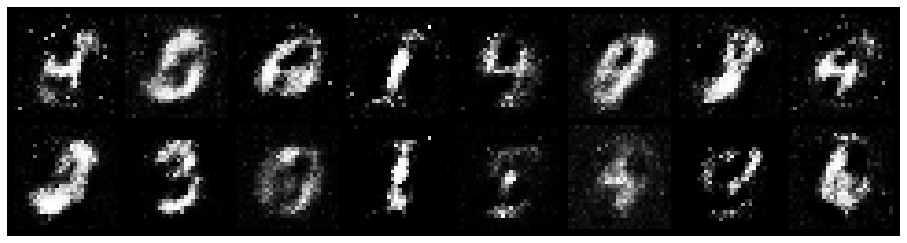

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.8216, Generator Loss: 3.5936
D(x): 0.7612, D(G(z)): 0.3358
gen_epochs:1 ,dis_epochs:1


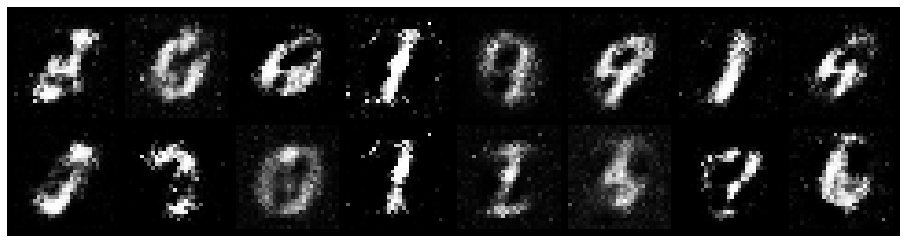

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.9100, Generator Loss: 5.1853
D(x): 0.6835, D(G(z)): 0.1940
gen_epochs:1 ,dis_epochs:1


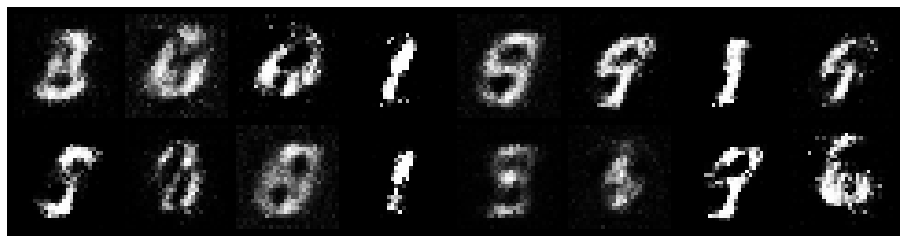

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.6566, Generator Loss: 5.7722
D(x): 0.7673, D(G(z)): 0.1753
gen_epochs:1 ,dis_epochs:1


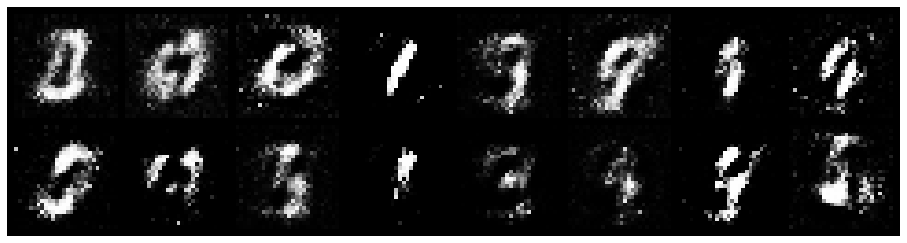

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.5876, Generator Loss: 5.2706
D(x): 0.7647, D(G(z)): 0.1739
gen_epochs:1 ,dis_epochs:1


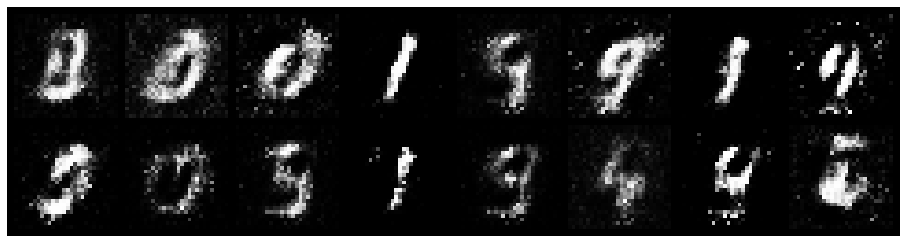

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.7230, Generator Loss: 4.5834
D(x): 0.7056, D(G(z)): 0.1815
gen_epochs:1 ,dis_epochs:1


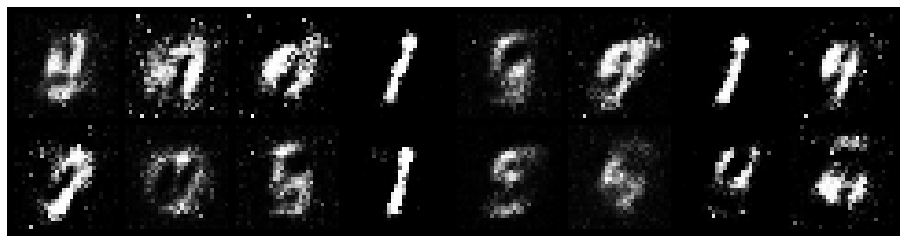

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.9470, Generator Loss: 3.6771
D(x): 0.7077, D(G(z)): 0.3154
gen_epochs:1 ,dis_epochs:1


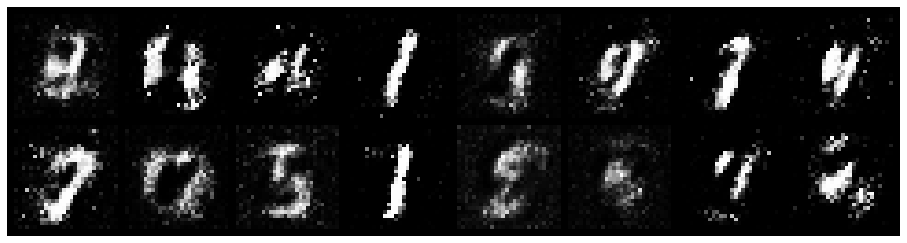

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.7226, Generator Loss: 4.1504
D(x): 0.6922, D(G(z)): 0.2031
gen_epochs:1 ,dis_epochs:1


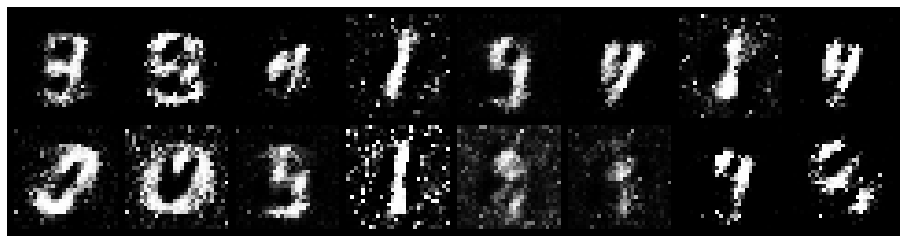

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.7822, Generator Loss: 5.0293
D(x): 0.7208, D(G(z)): 0.2223
gen_epochs:1 ,dis_epochs:1


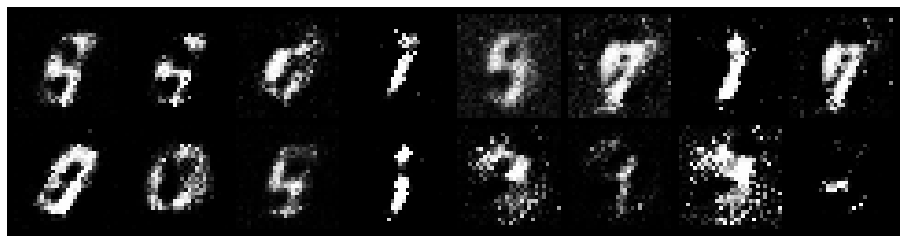

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.7651, Generator Loss: 5.2637
D(x): 0.7709, D(G(z)): 0.2286
gen_epochs:1 ,dis_epochs:1


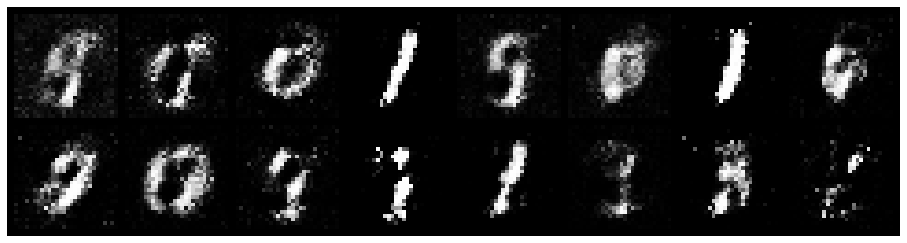

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.6736, Generator Loss: 5.1774
D(x): 0.7965, D(G(z)): 0.2237
gen_epochs:1 ,dis_epochs:1


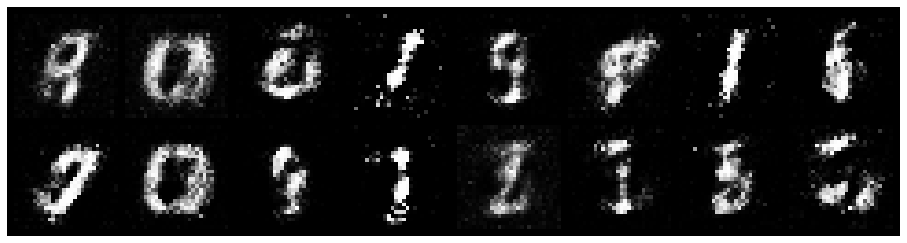

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.5697, Generator Loss: 5.9307
D(x): 0.8170, D(G(z)): 0.1932
gen_epochs:1 ,dis_epochs:1


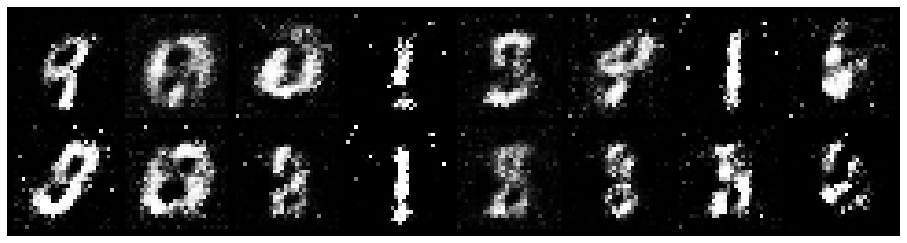

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.5135, Generator Loss: 6.0177
D(x): 0.8976, D(G(z)): 0.2401
gen_epochs:1 ,dis_epochs:1


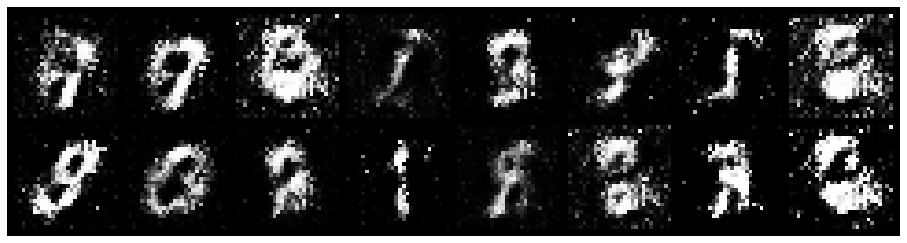

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.7079, Generator Loss: 4.5233
D(x): 0.7512, D(G(z)): 0.2269
gen_epochs:1 ,dis_epochs:1


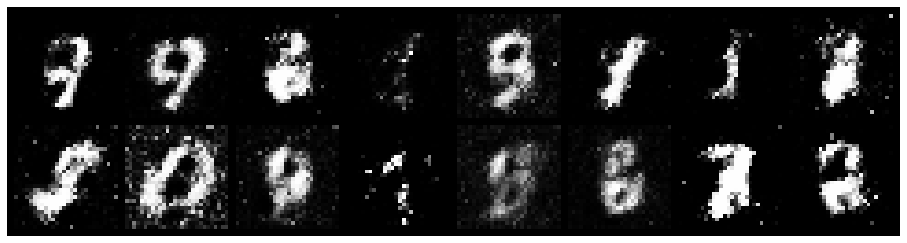

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.7359, Generator Loss: 4.3998
D(x): 0.6890, D(G(z)): 0.1996
gen_epochs:1 ,dis_epochs:1


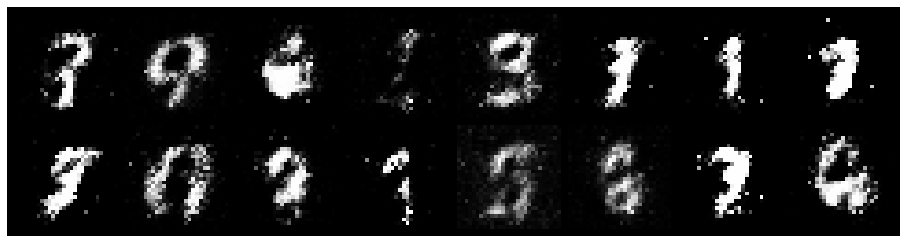

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.8480, Generator Loss: 5.3893
D(x): 0.6861, D(G(z)): 0.1653
gen_epochs:1 ,dis_epochs:1


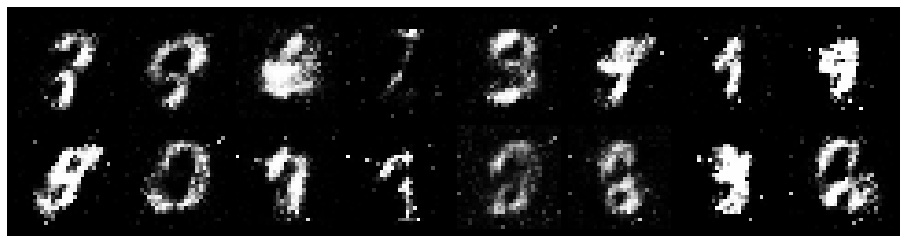

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.6343, Generator Loss: 5.5209
D(x): 0.7977, D(G(z)): 0.2180
gen_epochs:1 ,dis_epochs:1


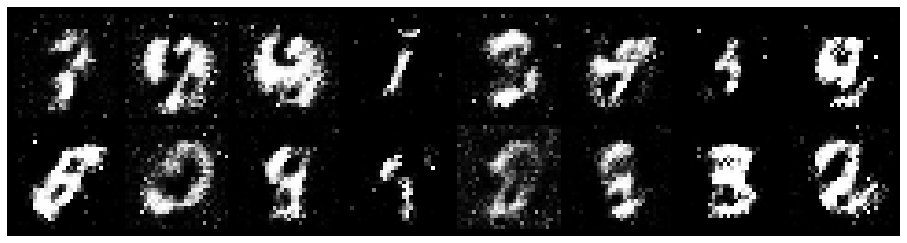

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.6737, Generator Loss: 5.7224
D(x): 0.8149, D(G(z)): 0.2256
gen_epochs:1 ,dis_epochs:1


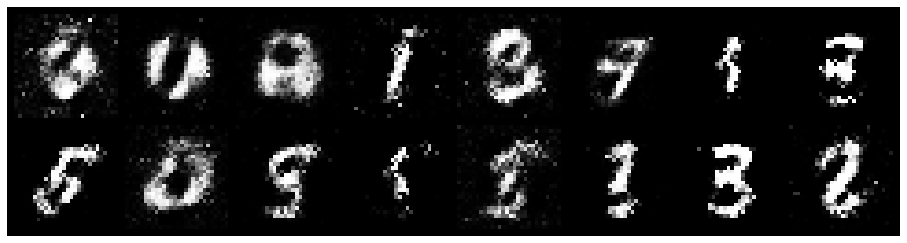

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 1.1021, Generator Loss: 4.0552
D(x): 0.6959, D(G(z)): 0.2806
gen_epochs:1 ,dis_epochs:1


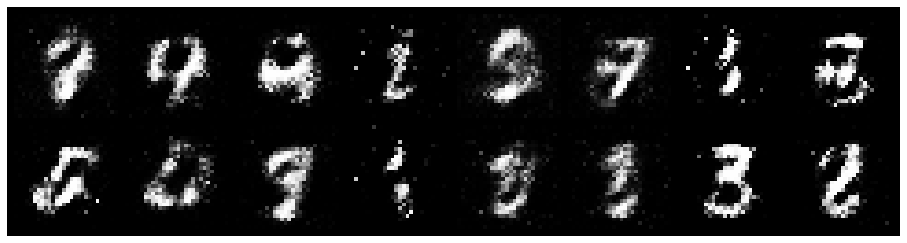

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.8360, Generator Loss: 3.9045
D(x): 0.7250, D(G(z)): 0.2796
gen_epochs:1 ,dis_epochs:1


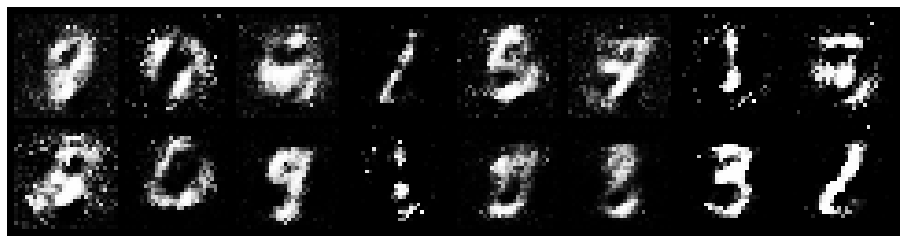

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.8174, Generator Loss: 4.2621
D(x): 0.6895, D(G(z)): 0.2237
gen_epochs:1 ,dis_epochs:1


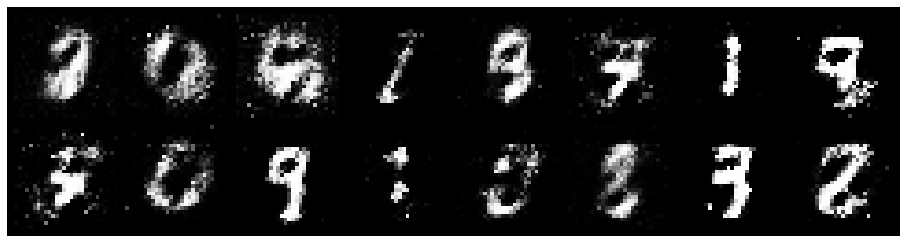

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.8633, Generator Loss: 4.6333
D(x): 0.7731, D(G(z)): 0.3054
gen_epochs:1 ,dis_epochs:1


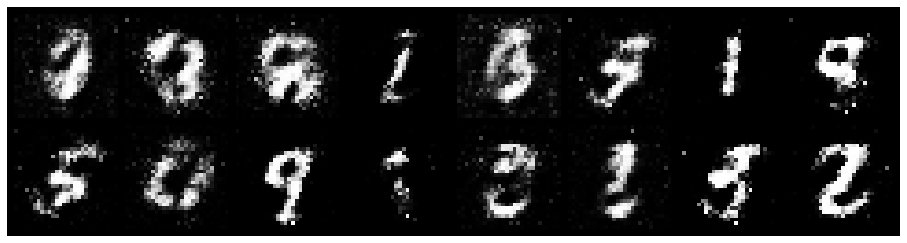

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.7822, Generator Loss: 5.8310
D(x): 0.7533, D(G(z)): 0.1836
gen_epochs:1 ,dis_epochs:1


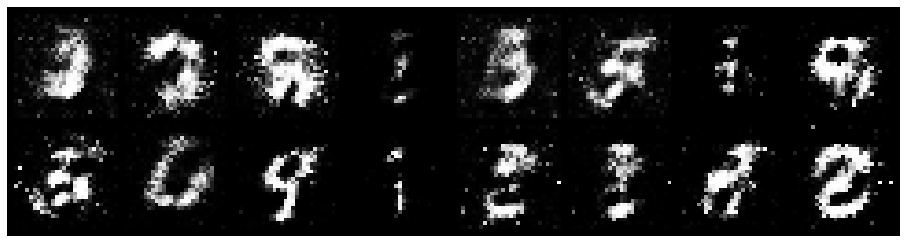

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.8980, Generator Loss: 4.2628
D(x): 0.6855, D(G(z)): 0.2456
gen_epochs:1 ,dis_epochs:1


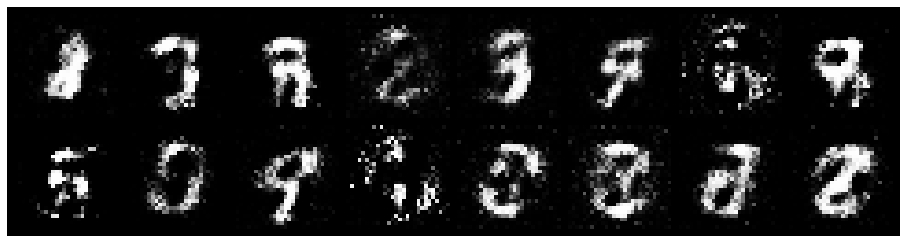

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.8202, Generator Loss: 3.5885
D(x): 0.7286, D(G(z)): 0.3250
gen_epochs:1 ,dis_epochs:1


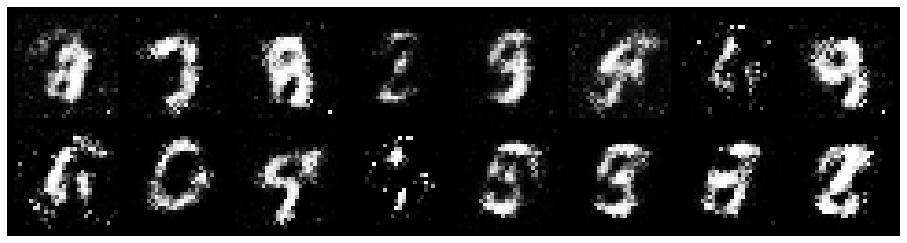

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.6435, Generator Loss: 4.5156
D(x): 0.8059, D(G(z)): 0.2215
gen_epochs:1 ,dis_epochs:1


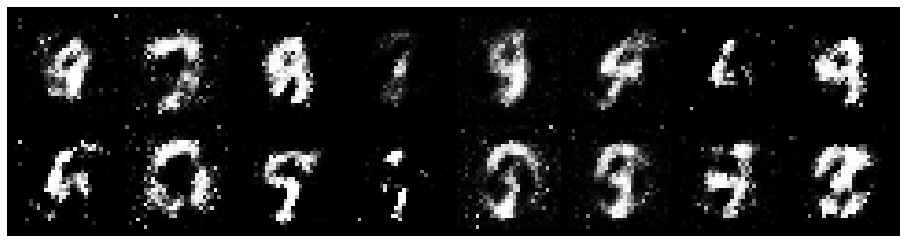

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.6274, Generator Loss: 4.5023
D(x): 0.7973, D(G(z)): 0.2543
gen_epochs:1 ,dis_epochs:1


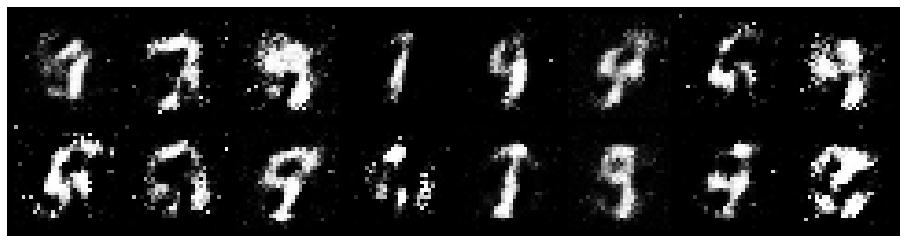

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.8189, Generator Loss: 3.6278
D(x): 0.7067, D(G(z)): 0.2669
gen_epochs:1 ,dis_epochs:1


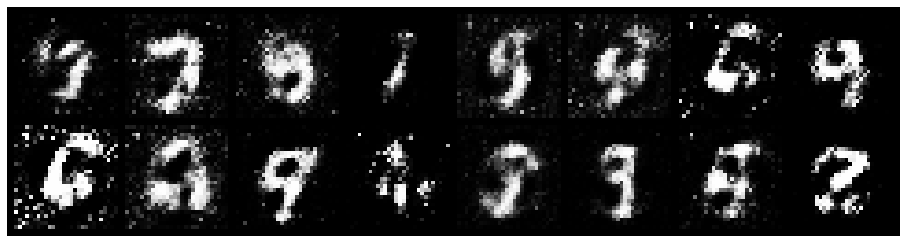

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.7885, Generator Loss: 5.0083
D(x): 0.7596, D(G(z)): 0.2958
gen_epochs:1 ,dis_epochs:1


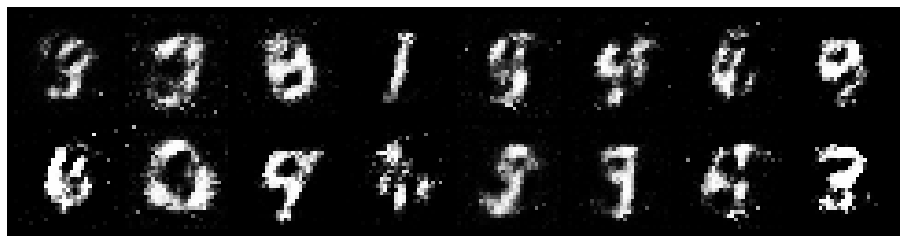

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.6716, Generator Loss: 4.4291
D(x): 0.7349, D(G(z)): 0.2104
gen_epochs:1 ,dis_epochs:1


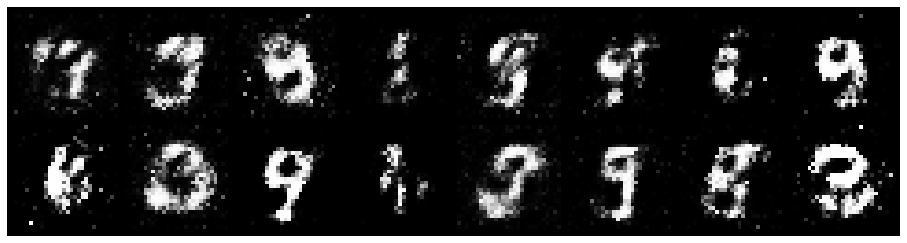

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.9564, Generator Loss: 3.0625
D(x): 0.6849, D(G(z)): 0.3434
gen_epochs:1 ,dis_epochs:1


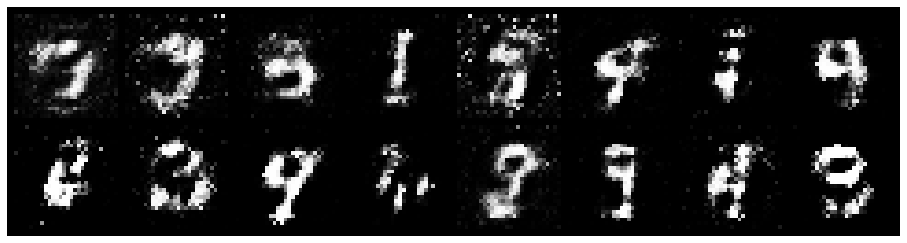

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.9754, Generator Loss: 4.4623
D(x): 0.6940, D(G(z)): 0.2785
gen_epochs:1 ,dis_epochs:1


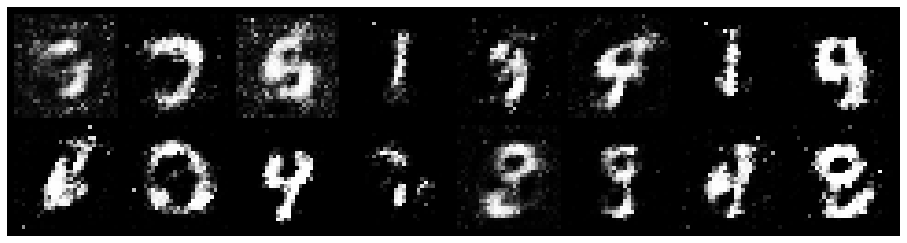

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 1.0921, Generator Loss: 3.3406
D(x): 0.6985, D(G(z)): 0.3739
gen_epochs:1 ,dis_epochs:1


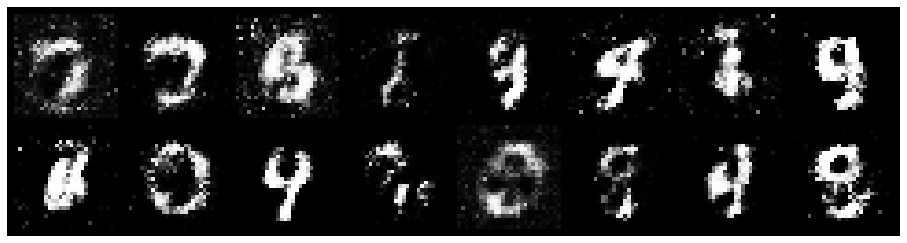

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.7161, Generator Loss: 3.4731
D(x): 0.6994, D(G(z)): 0.2318
gen_epochs:1 ,dis_epochs:1


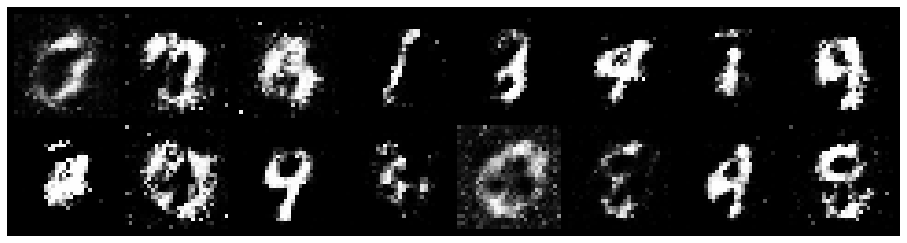

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.7246, Generator Loss: 4.5552
D(x): 0.7776, D(G(z)): 0.2446
gen_epochs:1 ,dis_epochs:1


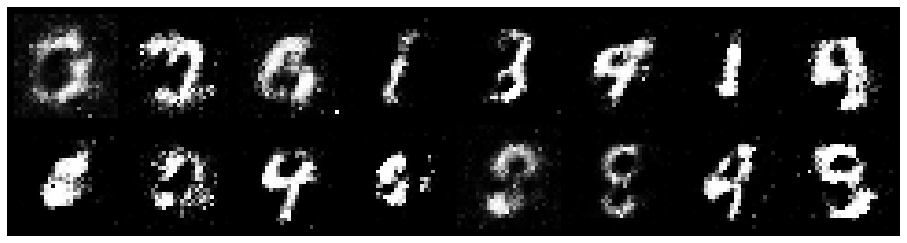

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.8859, Generator Loss: 3.6407
D(x): 0.6980, D(G(z)): 0.2824
gen_epochs:1 ,dis_epochs:1


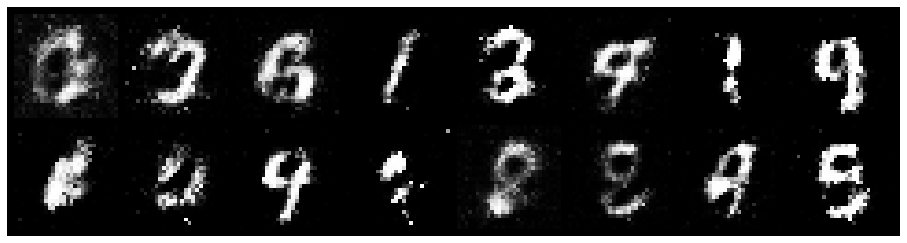

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.7356, Generator Loss: 4.3734
D(x): 0.7579, D(G(z)): 0.2326
gen_epochs:1 ,dis_epochs:1


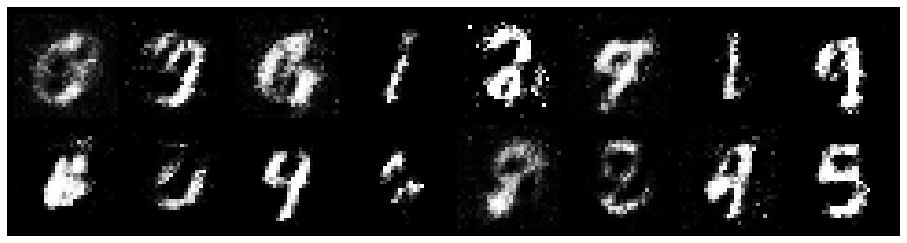

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 0.8241, Generator Loss: 3.7287
D(x): 0.7467, D(G(z)): 0.3181
gen_epochs:1 ,dis_epochs:1


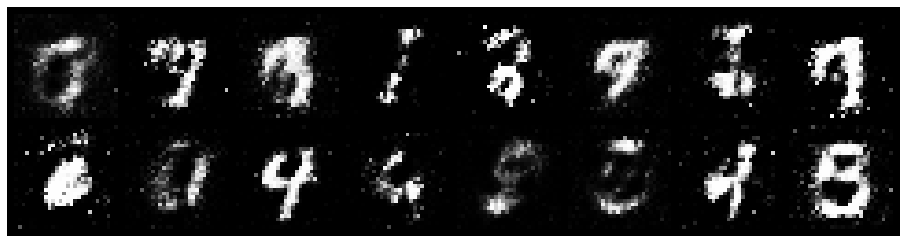

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.8173, Generator Loss: 3.6492
D(x): 0.7691, D(G(z)): 0.3363
gen_epochs:1 ,dis_epochs:1


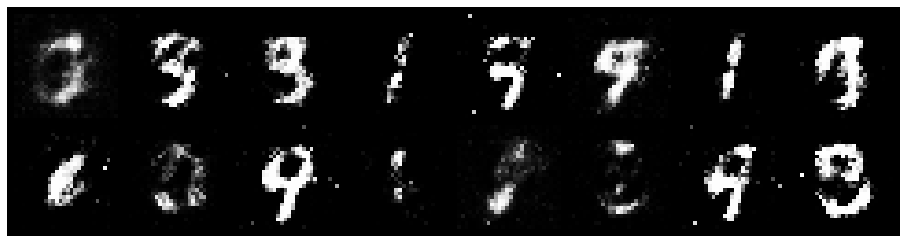

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.8728, Generator Loss: 4.4784
D(x): 0.6949, D(G(z)): 0.2130
gen_epochs:1 ,dis_epochs:1


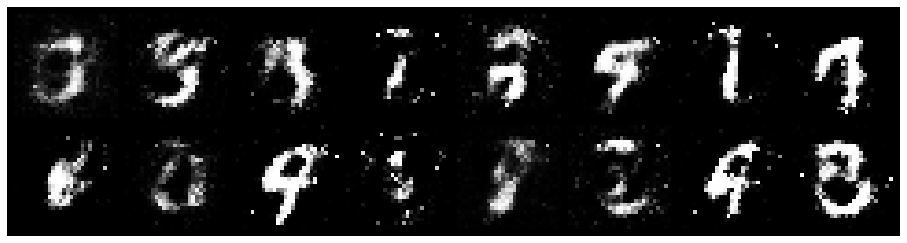

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.9082, Generator Loss: 3.8079
D(x): 0.7720, D(G(z)): 0.4034
gen_epochs:1 ,dis_epochs:1


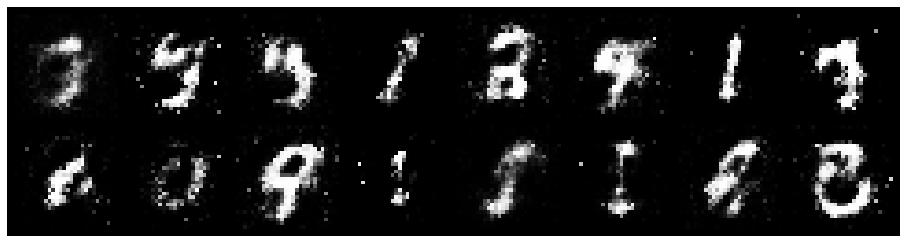

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.6920, Generator Loss: 5.5981
D(x): 0.7431, D(G(z)): 0.1854
gen_epochs:1 ,dis_epochs:1


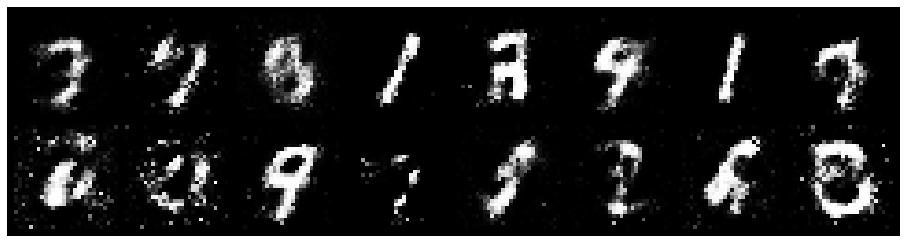

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.7685, Generator Loss: 3.8802
D(x): 0.7254, D(G(z)): 0.2606
gen_epochs:1 ,dis_epochs:1


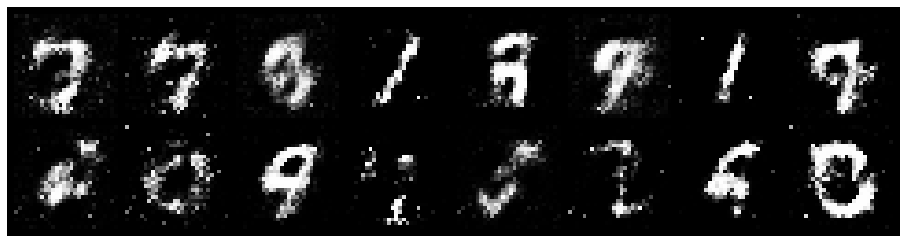

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.7529, Generator Loss: 3.6472
D(x): 0.7080, D(G(z)): 0.2486
gen_epochs:1 ,dis_epochs:1


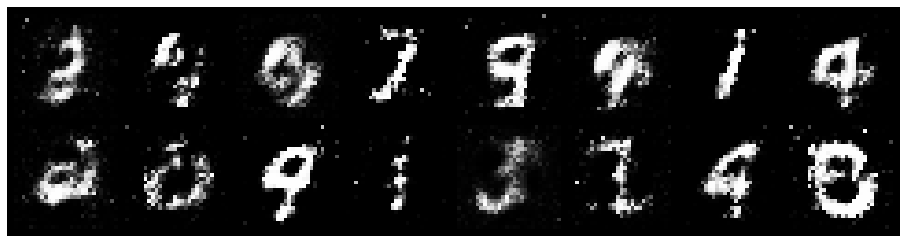

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.7636, Generator Loss: 3.5999
D(x): 0.7305, D(G(z)): 0.2804
gen_epochs:1 ,dis_epochs:1


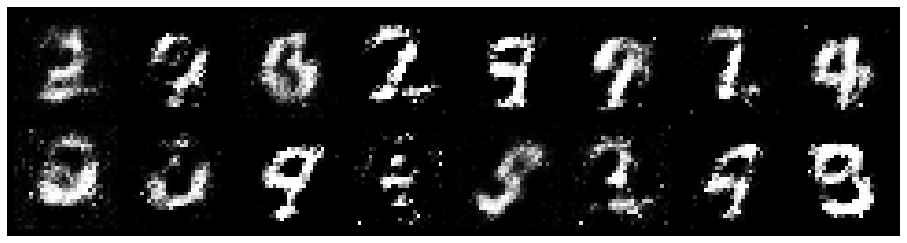

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.8651, Generator Loss: 4.4184
D(x): 0.8110, D(G(z)): 0.3310
gen_epochs:1 ,dis_epochs:1


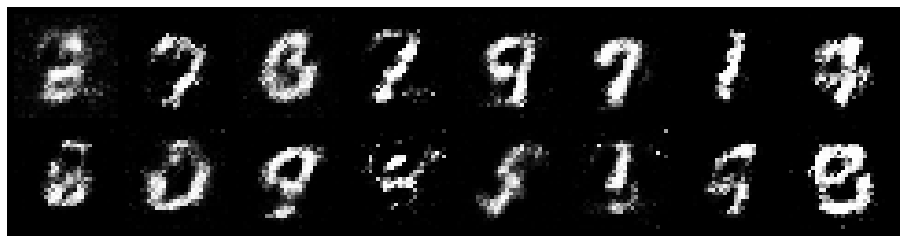

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.9302, Generator Loss: 4.1543
D(x): 0.7677, D(G(z)): 0.3453
gen_epochs:1 ,dis_epochs:1


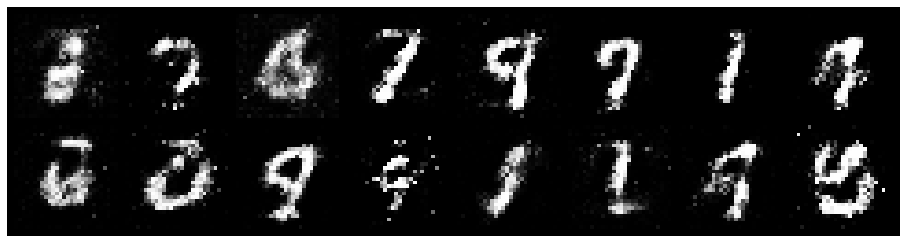

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.6771, Generator Loss: 4.1710
D(x): 0.7850, D(G(z)): 0.2748
gen_epochs:1 ,dis_epochs:1


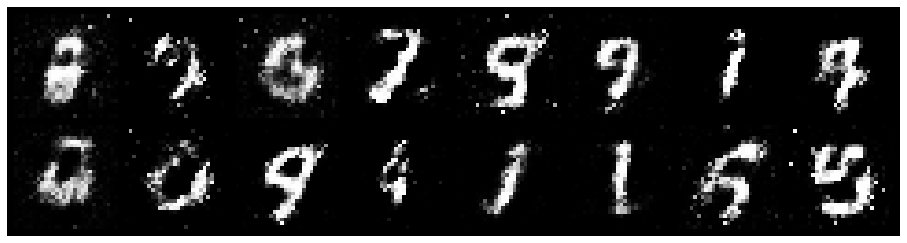

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.8768, Generator Loss: 4.0449
D(x): 0.7667, D(G(z)): 0.3728
gen_epochs:1 ,dis_epochs:1


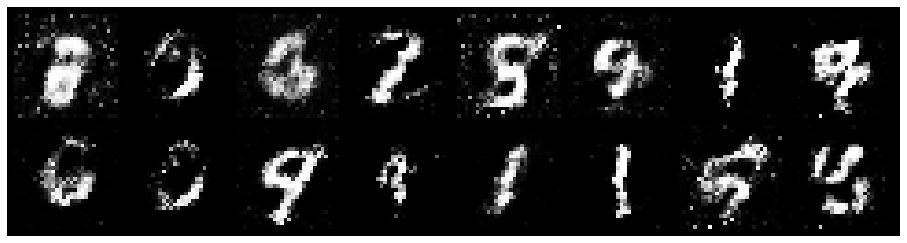

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.8900, Generator Loss: 3.7860
D(x): 0.6389, D(G(z)): 0.2277
gen_epochs:1 ,dis_epochs:1


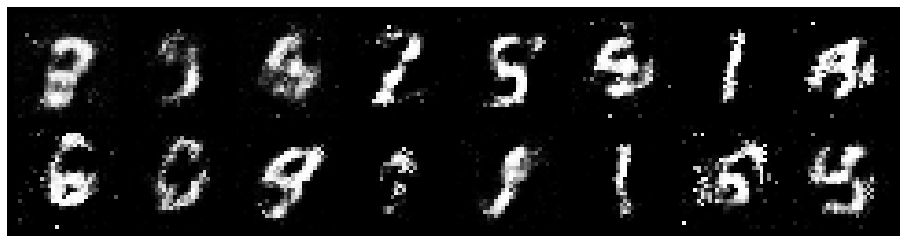

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 1.0987, Generator Loss: 2.9447
D(x): 0.5919, D(G(z)): 0.2906
gen_epochs:1 ,dis_epochs:1


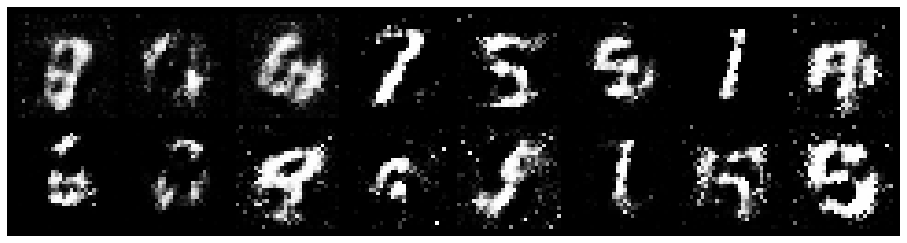

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.8896, Generator Loss: 3.2425
D(x): 0.6959, D(G(z)): 0.2909
gen_epochs:1 ,dis_epochs:1


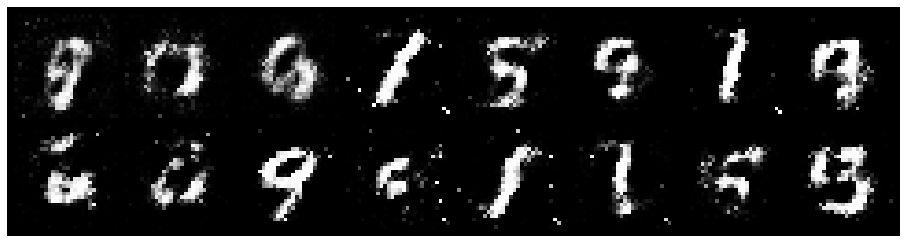

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.8107, Generator Loss: 3.5641
D(x): 0.6985, D(G(z)): 0.2577
gen_epochs:1 ,dis_epochs:1


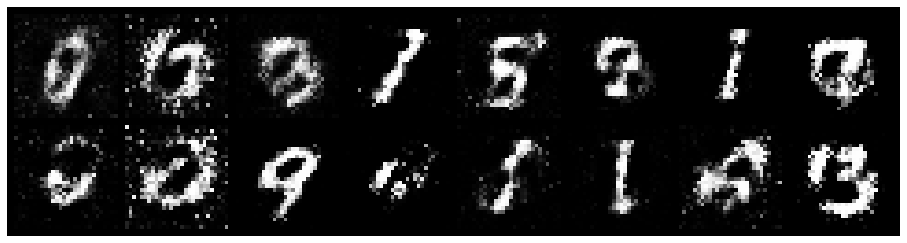

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.8200, Generator Loss: 4.1265
D(x): 0.7543, D(G(z)): 0.3057
gen_epochs:1 ,dis_epochs:1


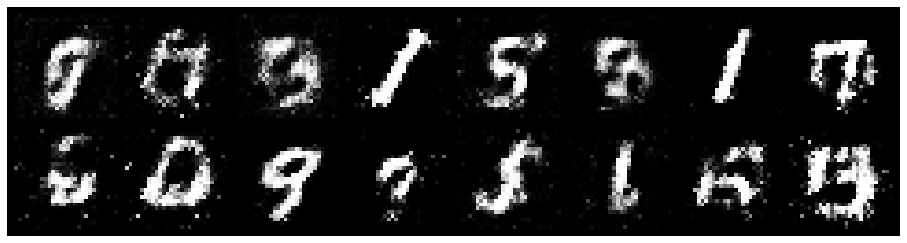

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.6579, Generator Loss: 4.2399
D(x): 0.7691, D(G(z)): 0.2241
gen_epochs:1 ,dis_epochs:1


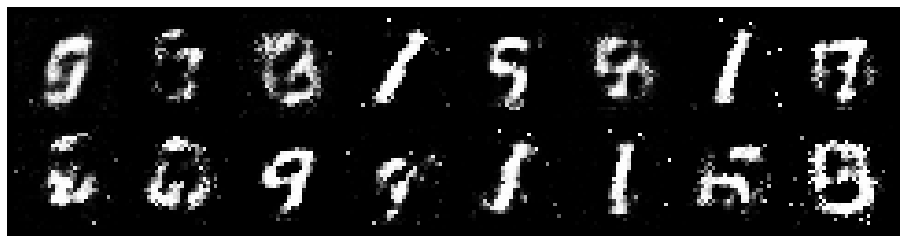

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 0.9112, Generator Loss: 3.6165
D(x): 0.6749, D(G(z)): 0.2684
gen_epochs:1 ,dis_epochs:1


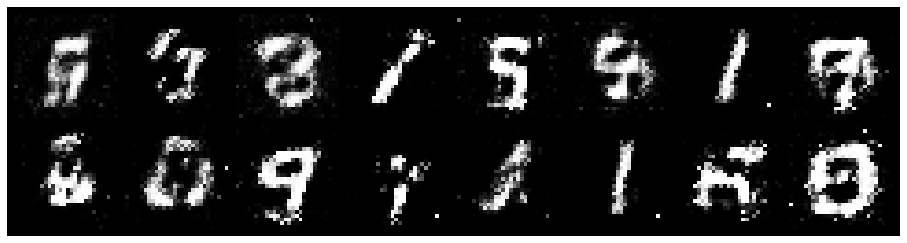

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.9138, Generator Loss: 3.4560
D(x): 0.6953, D(G(z)): 0.3255
gen_epochs:1 ,dis_epochs:1


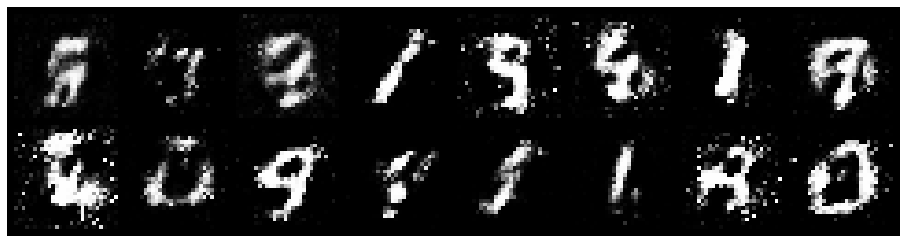

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.9057, Generator Loss: 3.1207
D(x): 0.6555, D(G(z)): 0.2735
gen_epochs:1 ,dis_epochs:1


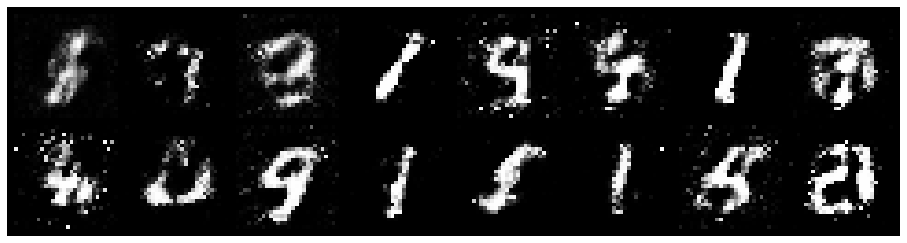

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.8075, Generator Loss: 3.7622
D(x): 0.7577, D(G(z)): 0.2835
gen_epochs:1 ,dis_epochs:1


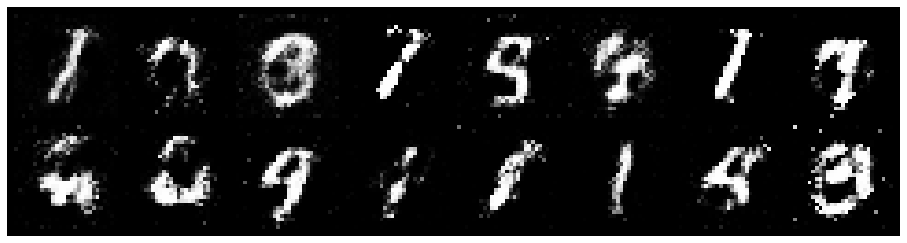

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.9037, Generator Loss: 3.6282
D(x): 0.7500, D(G(z)): 0.3449
gen_epochs:1 ,dis_epochs:1


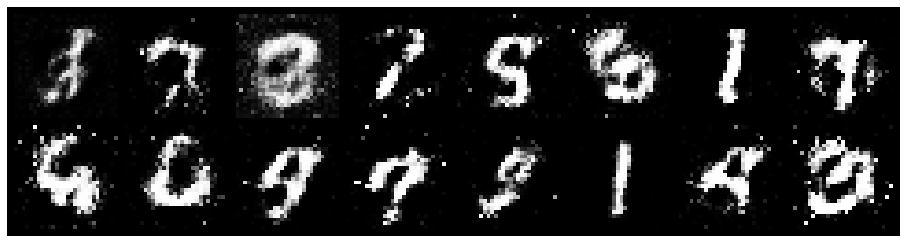

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 1.0912, Generator Loss: 2.6086
D(x): 0.6229, D(G(z)): 0.3670
gen_epochs:1 ,dis_epochs:1


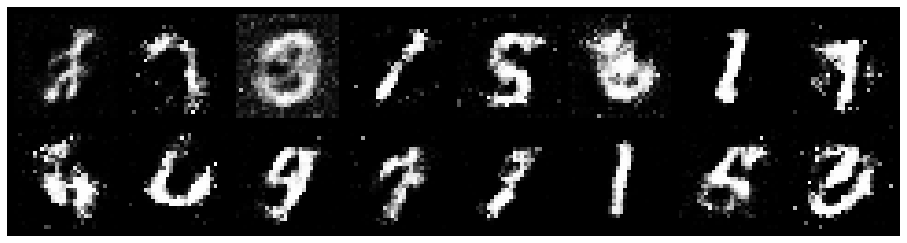

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.7235, Generator Loss: 4.3945
D(x): 0.8205, D(G(z)): 0.3225
gen_epochs:1 ,dis_epochs:1


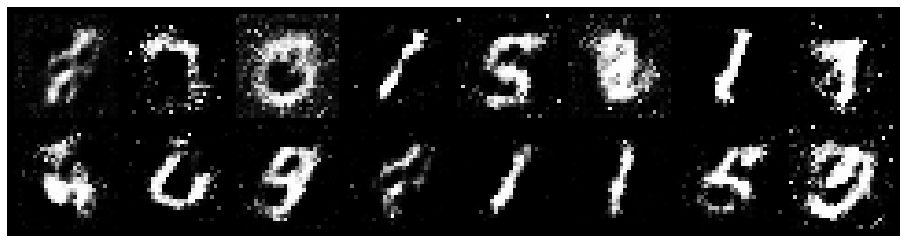

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.9150, Generator Loss: 3.9180
D(x): 0.7211, D(G(z)): 0.3003
gen_epochs:1 ,dis_epochs:1


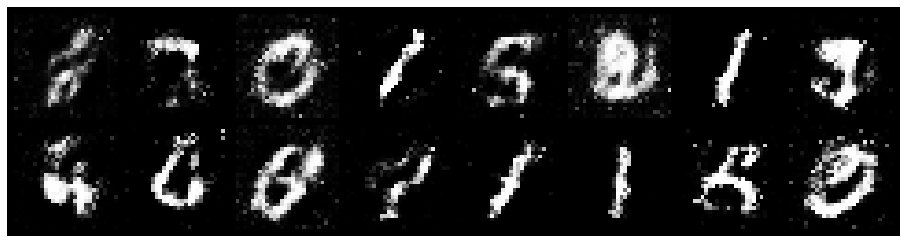

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.8550, Generator Loss: 3.5424
D(x): 0.6449, D(G(z)): 0.2143
gen_epochs:1 ,dis_epochs:1


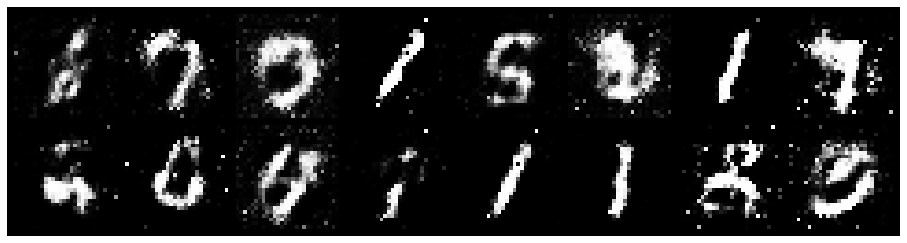

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 0.8619, Generator Loss: 4.3814
D(x): 0.8216, D(G(z)): 0.3406
gen_epochs:1 ,dis_epochs:1


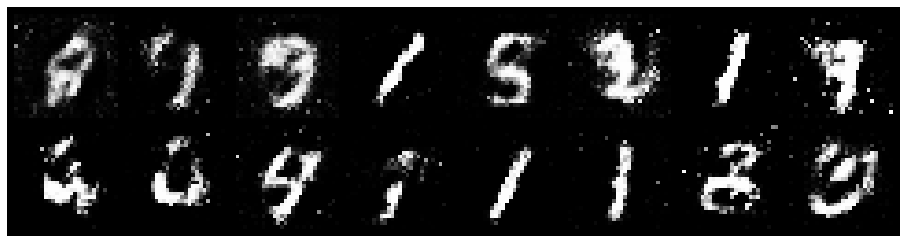

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.0713, Generator Loss: 3.4426
D(x): 0.6583, D(G(z)): 0.3373
gen_epochs:1 ,dis_epochs:1


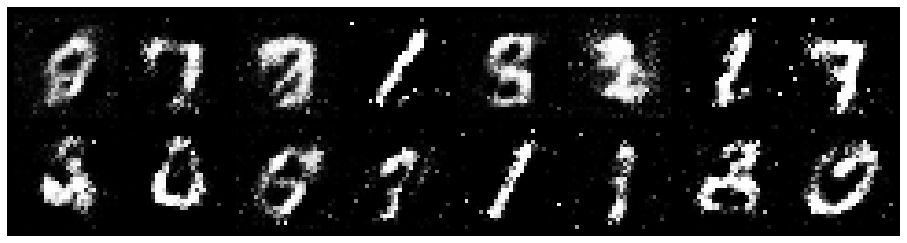

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.8372, Generator Loss: 4.2150
D(x): 0.7520, D(G(z)): 0.3021
gen_epochs:1 ,dis_epochs:1


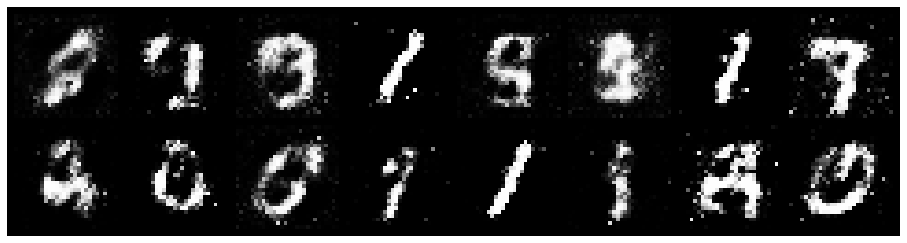

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 0.9550, Generator Loss: 3.3687
D(x): 0.6509, D(G(z)): 0.2723
gen_epochs:1 ,dis_epochs:1


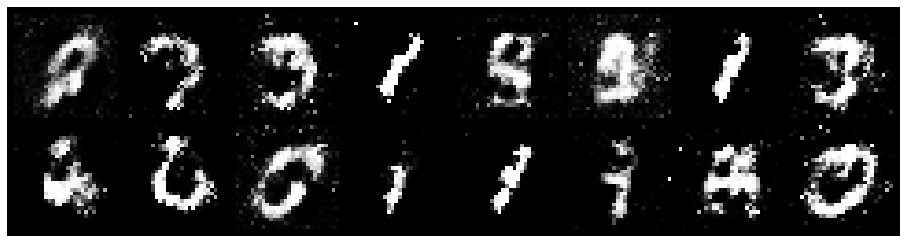

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.8950, Generator Loss: 3.7281
D(x): 0.6560, D(G(z)): 0.2478
gen_epochs:1 ,dis_epochs:1


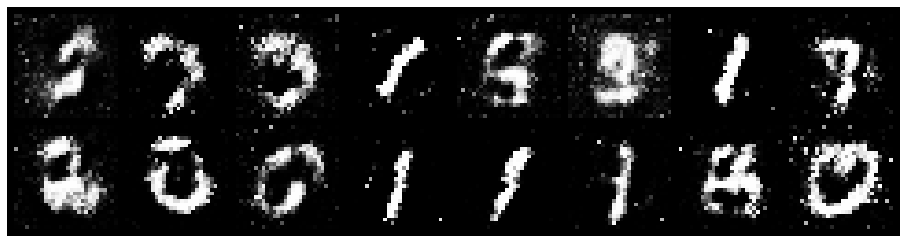

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 0.8051, Generator Loss: 4.1560
D(x): 0.7609, D(G(z)): 0.2850
gen_epochs:1 ,dis_epochs:1


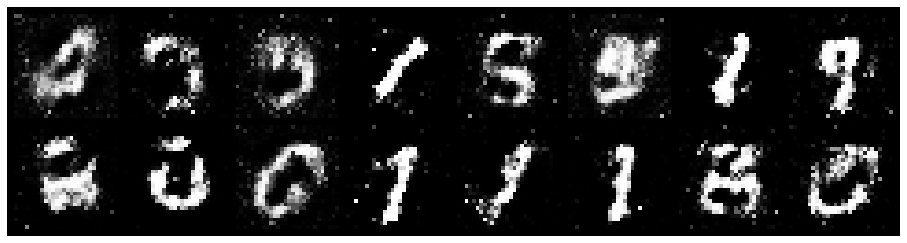

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.9723, Generator Loss: 3.5232
D(x): 0.6486, D(G(z)): 0.2856
gen_epochs:1 ,dis_epochs:1


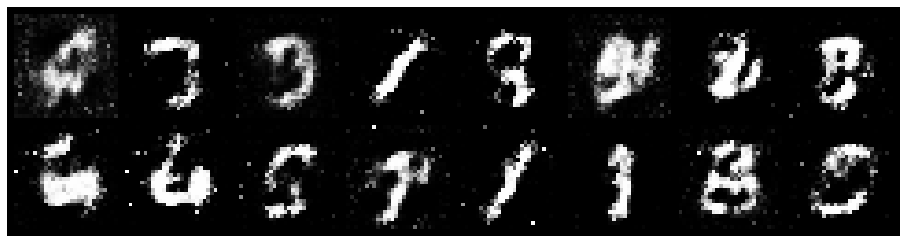

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 0.7126, Generator Loss: 3.8369
D(x): 0.7357, D(G(z)): 0.2459
gen_epochs:1 ,dis_epochs:1


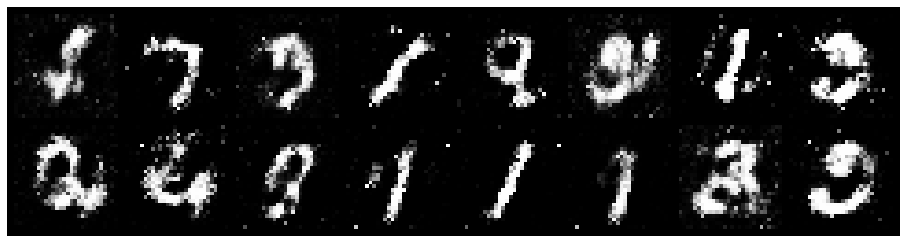

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.8960, Generator Loss: 2.8316
D(x): 0.6705, D(G(z)): 0.2949
gen_epochs:1 ,dis_epochs:1


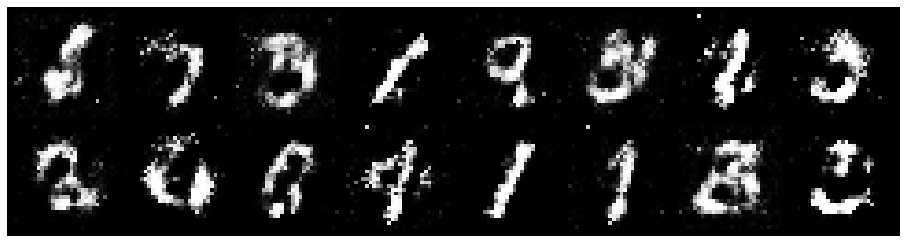

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9509, Generator Loss: 3.5458
D(x): 0.6482, D(G(z)): 0.2683
gen_epochs:1 ,dis_epochs:1


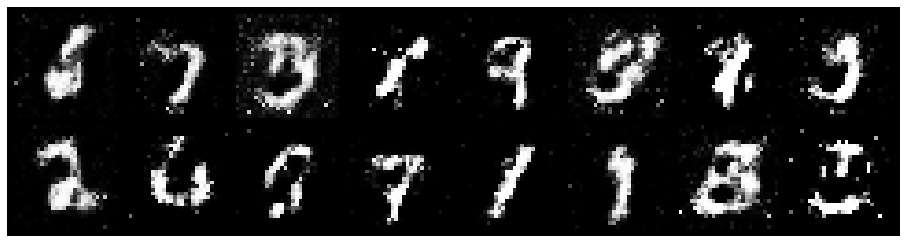

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.8409, Generator Loss: 4.2540
D(x): 0.7451, D(G(z)): 0.2925
gen_epochs:1 ,dis_epochs:1


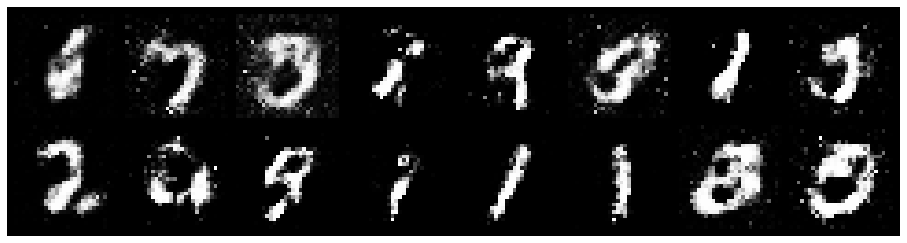

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.7361, Generator Loss: 4.1299
D(x): 0.7633, D(G(z)): 0.2614
gen_epochs:1 ,dis_epochs:1


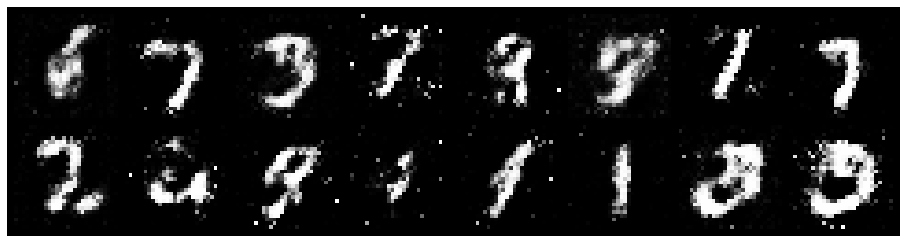

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 1.2325, Generator Loss: 3.2421
D(x): 0.5701, D(G(z)): 0.2720
gen_epochs:1 ,dis_epochs:1


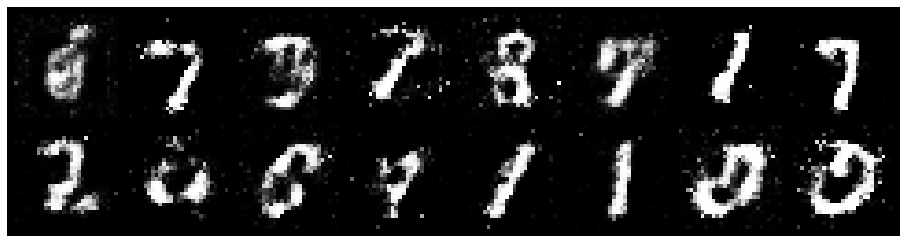

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 0.9708, Generator Loss: 3.0506
D(x): 0.6505, D(G(z)): 0.3123
gen_epochs:1 ,dis_epochs:1


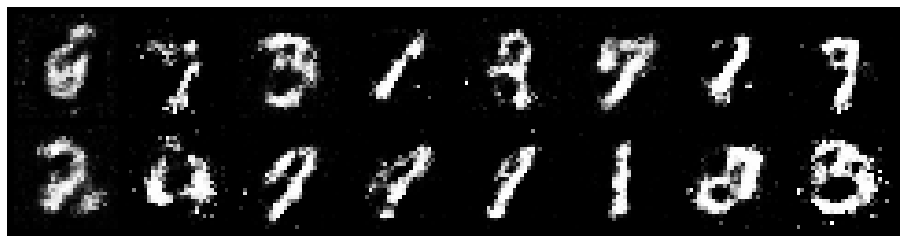

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.7679, Generator Loss: 3.9552
D(x): 0.7670, D(G(z)): 0.3093
gen_epochs:1 ,dis_epochs:1


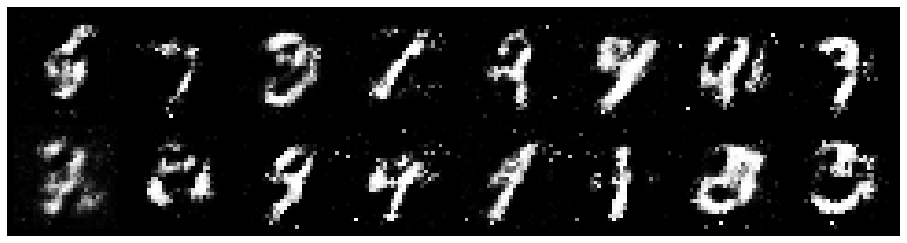

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.0521, Generator Loss: 3.5197
D(x): 0.6287, D(G(z)): 0.2747
gen_epochs:1 ,dis_epochs:1


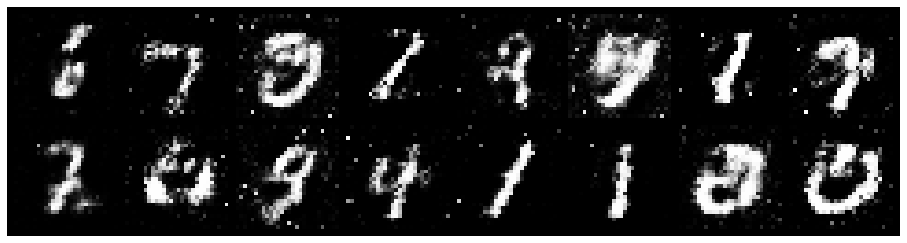

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 1.0455, Generator Loss: 2.5120
D(x): 0.6032, D(G(z)): 0.3139
gen_epochs:1 ,dis_epochs:1


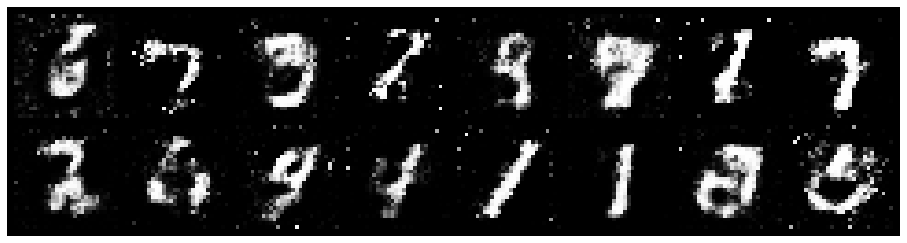

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 0.9160, Generator Loss: 3.2938
D(x): 0.6550, D(G(z)): 0.2841
gen_epochs:1 ,dis_epochs:1


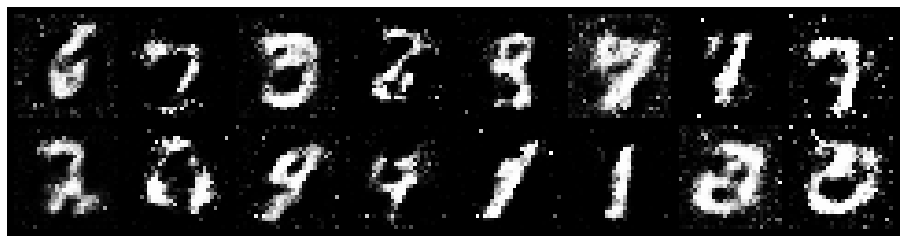

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.9630, Generator Loss: 3.3052
D(x): 0.7441, D(G(z)): 0.3822
gen_epochs:1 ,dis_epochs:1


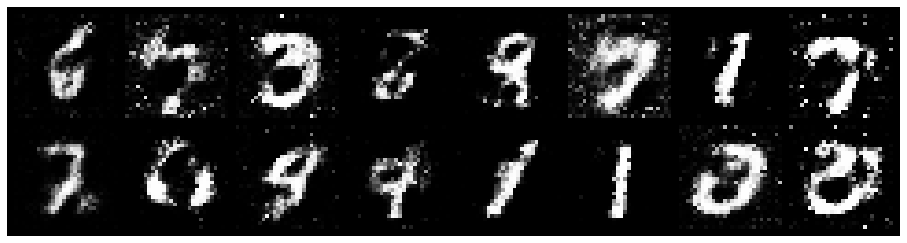

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.9519, Generator Loss: 2.9865
D(x): 0.6392, D(G(z)): 0.3130
gen_epochs:1 ,dis_epochs:1


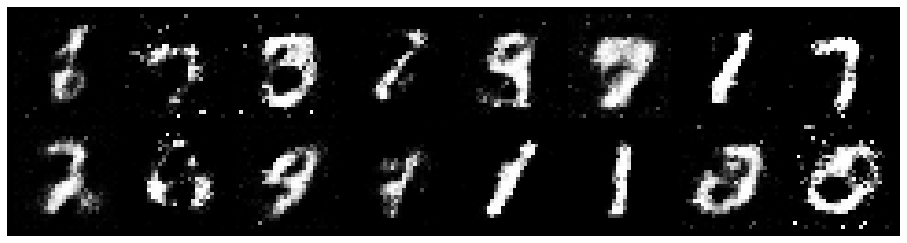

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.1632, Generator Loss: 2.6741
D(x): 0.5800, D(G(z)): 0.3275
gen_epochs:1 ,dis_epochs:1


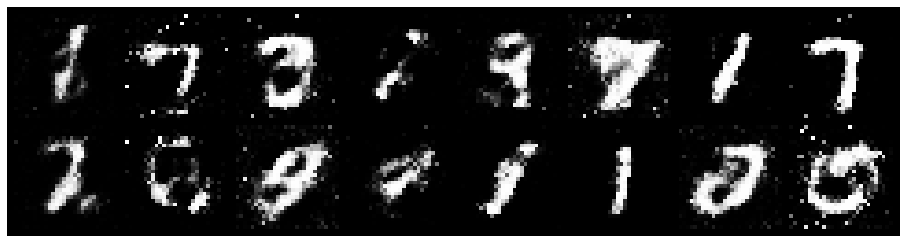

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.3886, Generator Loss: 2.4704
D(x): 0.5155, D(G(z)): 0.3247
gen_epochs:1 ,dis_epochs:1


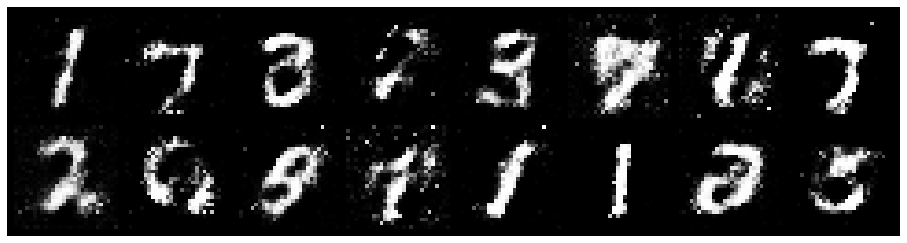

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.0116, Generator Loss: 2.9551
D(x): 0.6072, D(G(z)): 0.2832
gen_epochs:1 ,dis_epochs:1


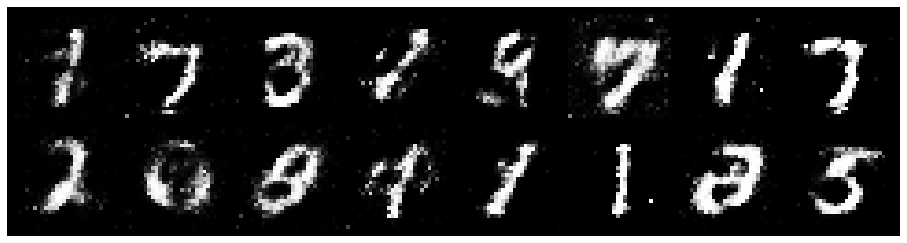

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 1.0456, Generator Loss: 2.8249
D(x): 0.6149, D(G(z)): 0.3085
gen_epochs:1 ,dis_epochs:1


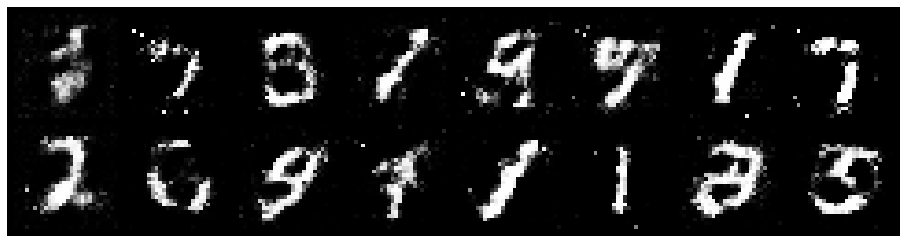

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 1.0810, Generator Loss: 3.3184
D(x): 0.6281, D(G(z)): 0.3272
gen_epochs:1 ,dis_epochs:1


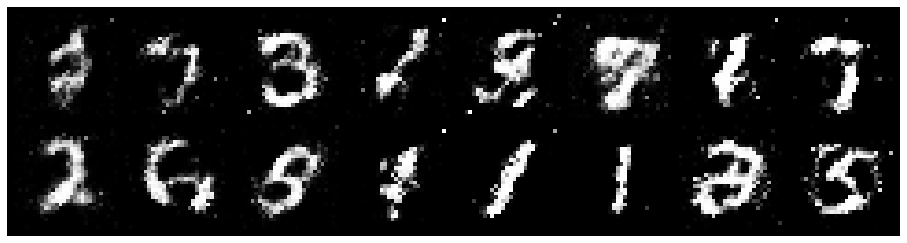

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 0.9121, Generator Loss: 3.7226
D(x): 0.6882, D(G(z)): 0.3064
gen_epochs:1 ,dis_epochs:1


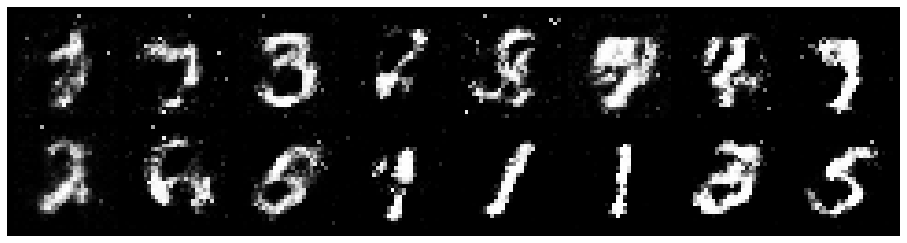

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 0.9086, Generator Loss: 3.6750
D(x): 0.6277, D(G(z)): 0.2172
gen_epochs:1 ,dis_epochs:1


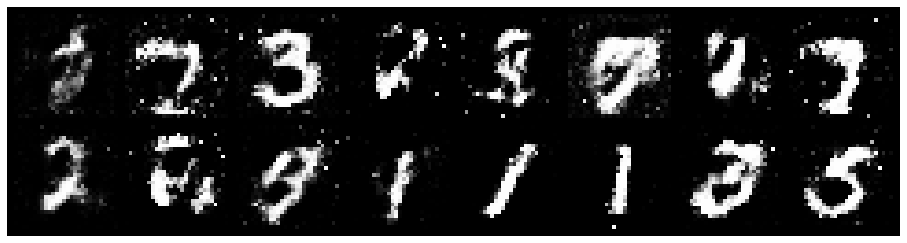

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.9676, Generator Loss: 3.1063
D(x): 0.6976, D(G(z)): 0.3531
gen_epochs:1 ,dis_epochs:1


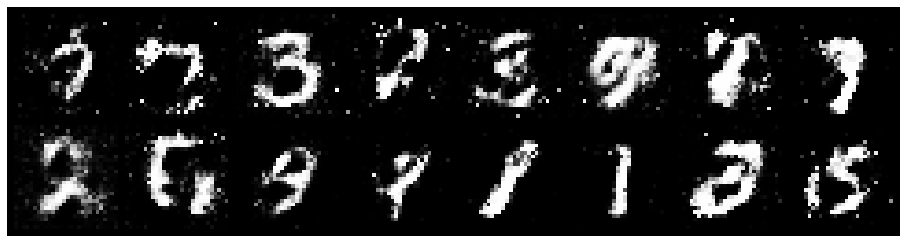

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 1.0603, Generator Loss: 2.2182
D(x): 0.6310, D(G(z)): 0.3952
gen_epochs:1 ,dis_epochs:1


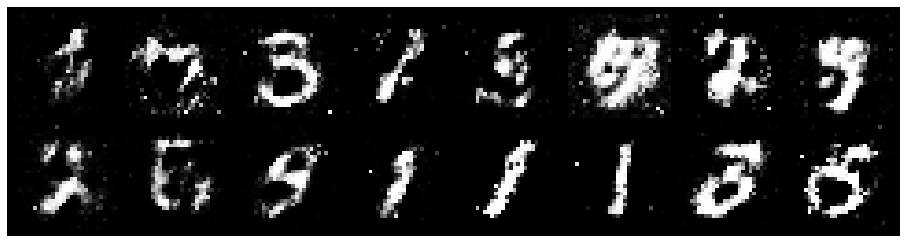

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.0670, Generator Loss: 3.2580
D(x): 0.6294, D(G(z)): 0.3155
gen_epochs:1 ,dis_epochs:1


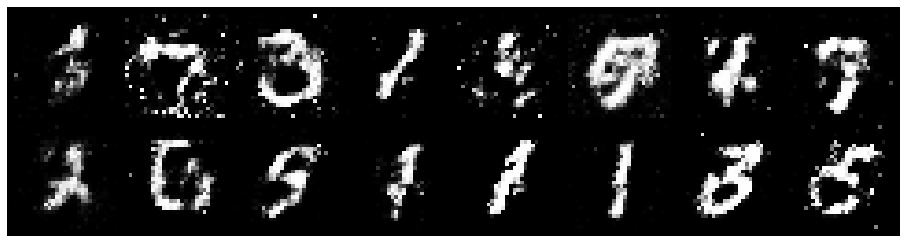

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.9393, Generator Loss: 3.8312
D(x): 0.6799, D(G(z)): 0.2772
gen_epochs:1 ,dis_epochs:1


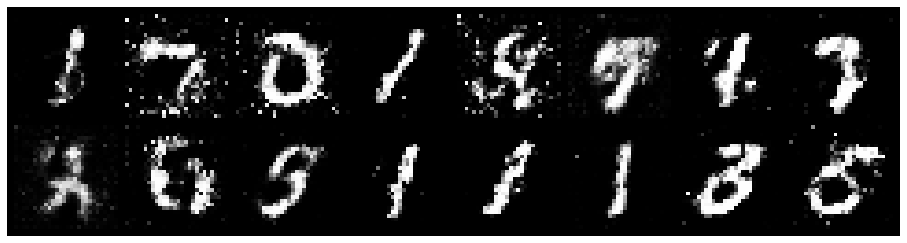

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.1725, Generator Loss: 3.1826
D(x): 0.6146, D(G(z)): 0.3309
gen_epochs:1 ,dis_epochs:1


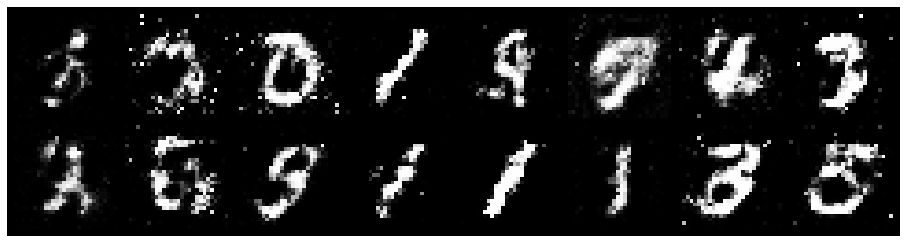

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 0.9779, Generator Loss: 2.8051
D(x): 0.6606, D(G(z)): 0.3584
gen_epochs:1 ,dis_epochs:1


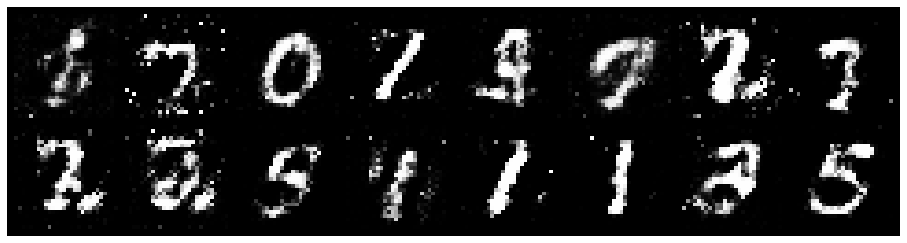

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 1.0400, Generator Loss: 2.7494
D(x): 0.6242, D(G(z)): 0.3600
gen_epochs:1 ,dis_epochs:1


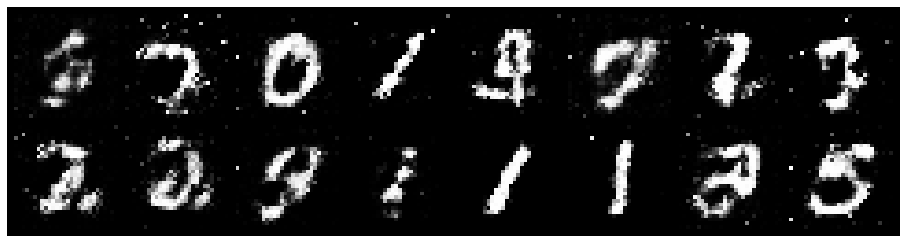

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0633, Generator Loss: 3.1390
D(x): 0.6902, D(G(z)): 0.3961
gen_epochs:1 ,dis_epochs:1


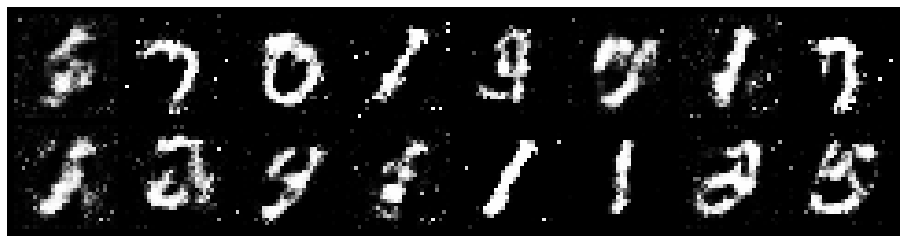

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.0142, Generator Loss: 2.5567
D(x): 0.6531, D(G(z)): 0.3678
gen_epochs:1 ,dis_epochs:1


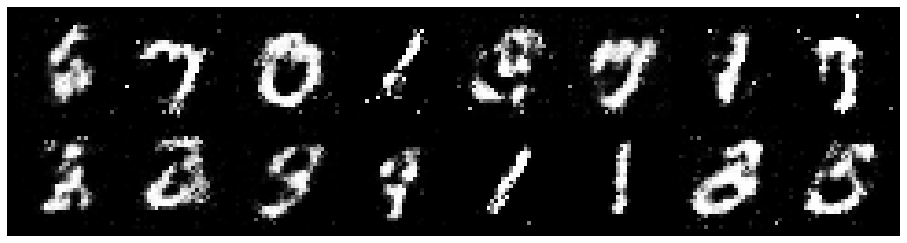

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 1.1145, Generator Loss: 2.8001
D(x): 0.6421, D(G(z)): 0.3825
gen_epochs:1 ,dis_epochs:1


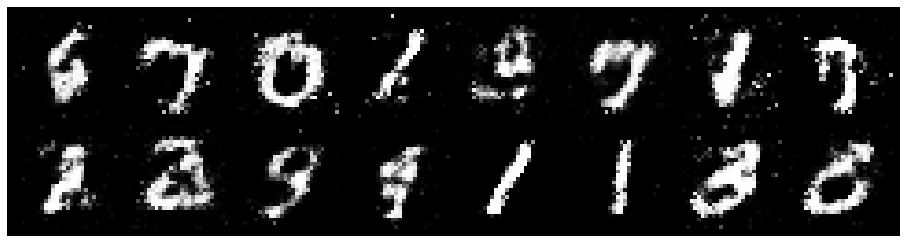

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 1.1947, Generator Loss: 2.8305
D(x): 0.7218, D(G(z)): 0.4728
gen_epochs:1 ,dis_epochs:1


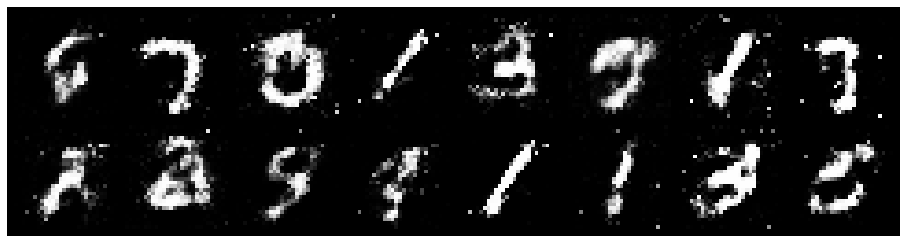

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.9592, Generator Loss: 2.9157
D(x): 0.6888, D(G(z)): 0.3464
gen_epochs:1 ,dis_epochs:1


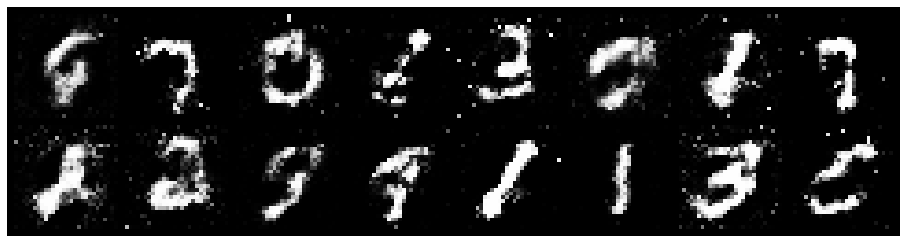

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.8955, Generator Loss: 2.9152
D(x): 0.6945, D(G(z)): 0.3249
gen_epochs:1 ,dis_epochs:1


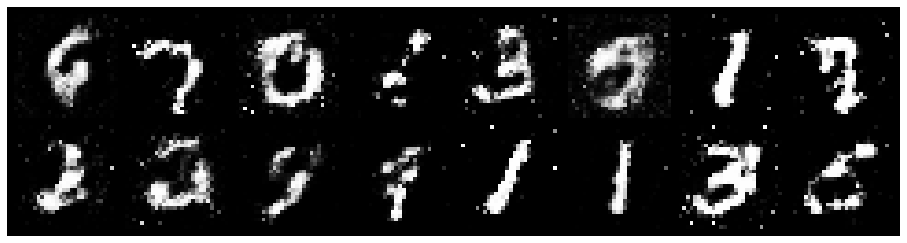

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.1228, Generator Loss: 3.4576
D(x): 0.6365, D(G(z)): 0.3243
gen_epochs:1 ,dis_epochs:1


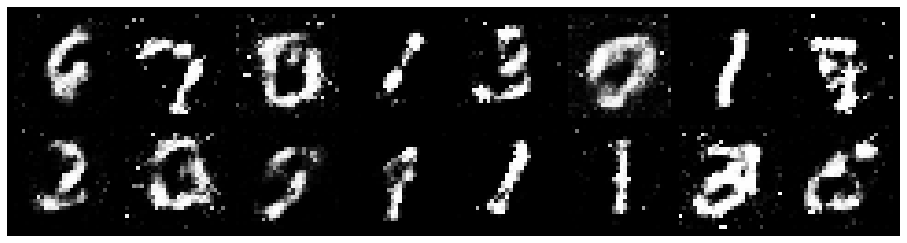

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0685, Generator Loss: 2.8480
D(x): 0.6172, D(G(z)): 0.3559
gen_epochs:1 ,dis_epochs:1


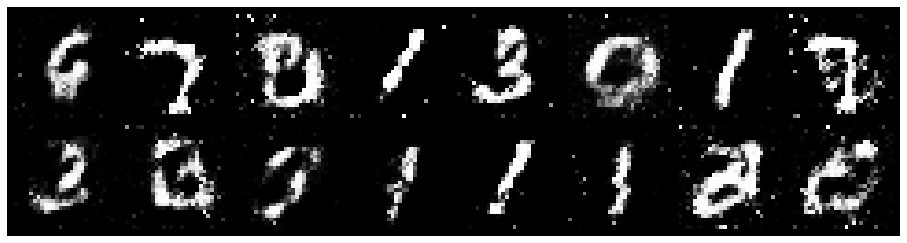

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.0495, Generator Loss: 2.9203
D(x): 0.6733, D(G(z)): 0.3657
gen_epochs:1 ,dis_epochs:1


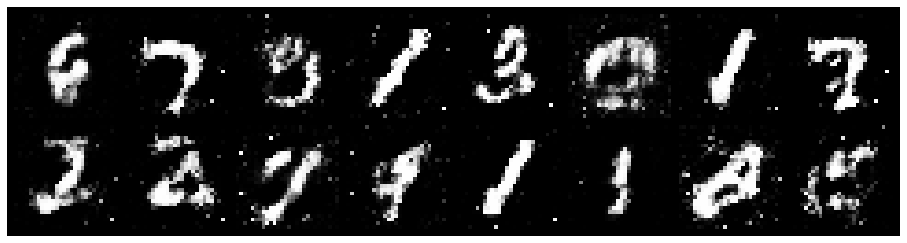

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 1.0179, Generator Loss: 2.6355
D(x): 0.6341, D(G(z)): 0.3403
gen_epochs:1 ,dis_epochs:1


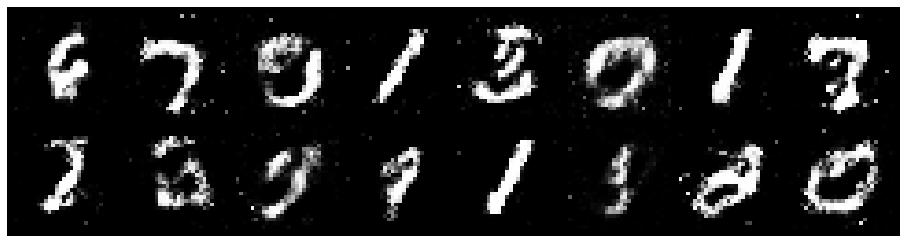

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.9641, Generator Loss: 3.1447
D(x): 0.7447, D(G(z)): 0.4098
gen_epochs:1 ,dis_epochs:1


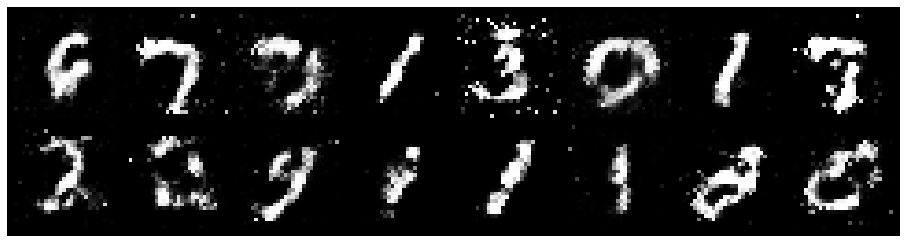

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 0.8552, Generator Loss: 2.9244
D(x): 0.6973, D(G(z)): 0.3163
gen_epochs:1 ,dis_epochs:1


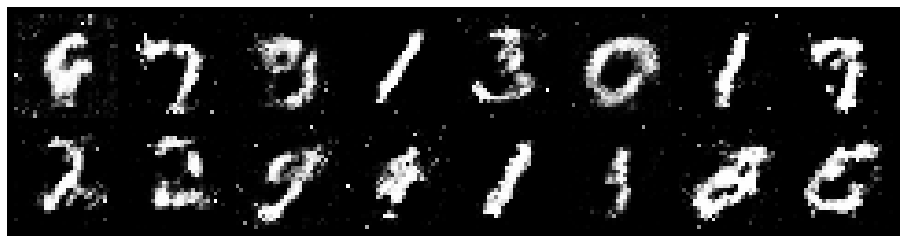

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.8813, Generator Loss: 3.4515
D(x): 0.7250, D(G(z)): 0.3489
gen_epochs:1 ,dis_epochs:1


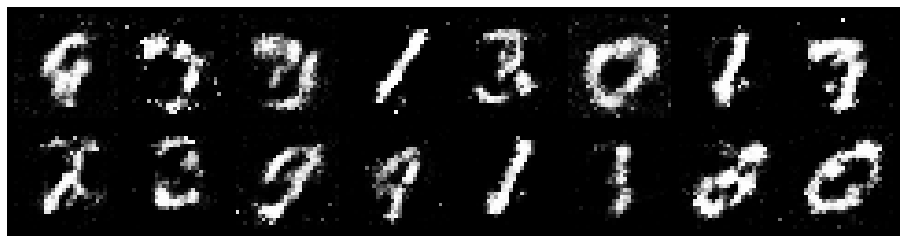

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 1.0154, Generator Loss: 2.9812
D(x): 0.6648, D(G(z)): 0.3519
gen_epochs:1 ,dis_epochs:1


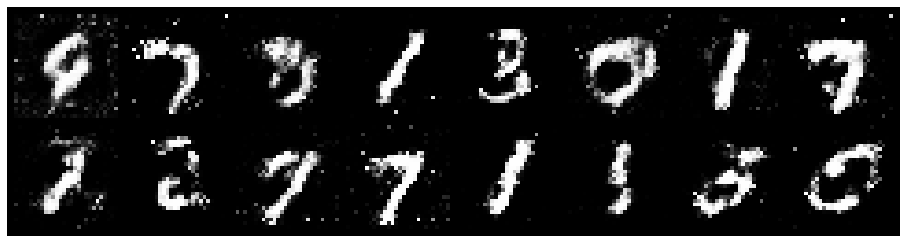

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 0.9708, Generator Loss: 2.4115
D(x): 0.6551, D(G(z)): 0.3572
gen_epochs:1 ,dis_epochs:1


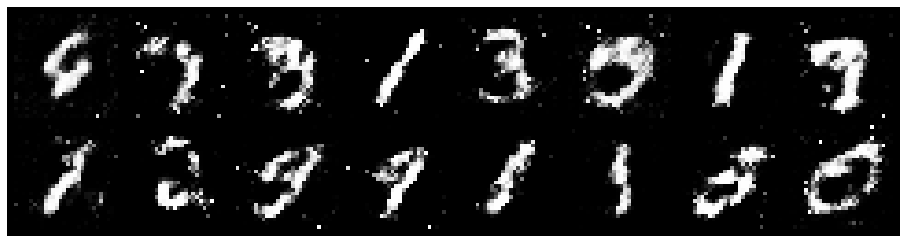

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 1.1965, Generator Loss: 2.6764
D(x): 0.5896, D(G(z)): 0.3287
gen_epochs:1 ,dis_epochs:1


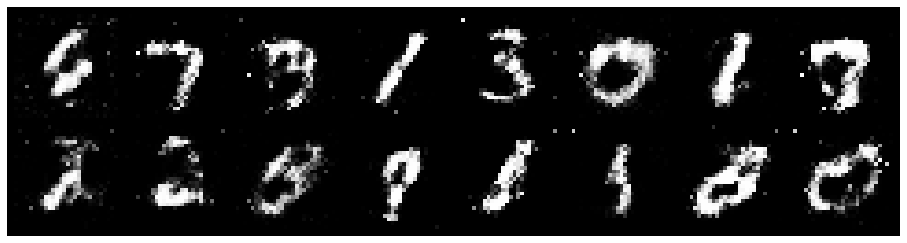

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.1405, Generator Loss: 2.2679
D(x): 0.5842, D(G(z)): 0.3905
gen_epochs:1 ,dis_epochs:1


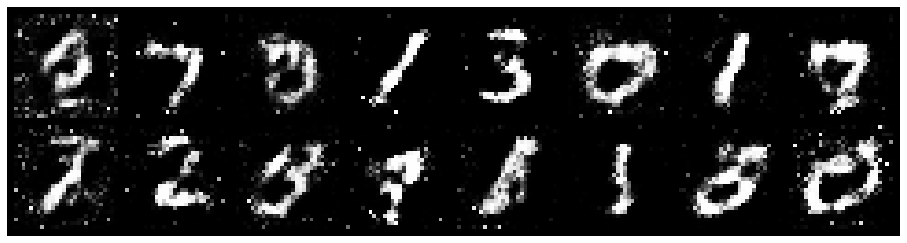

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 1.2732, Generator Loss: 2.3906
D(x): 0.5805, D(G(z)): 0.4020
gen_epochs:1 ,dis_epochs:1


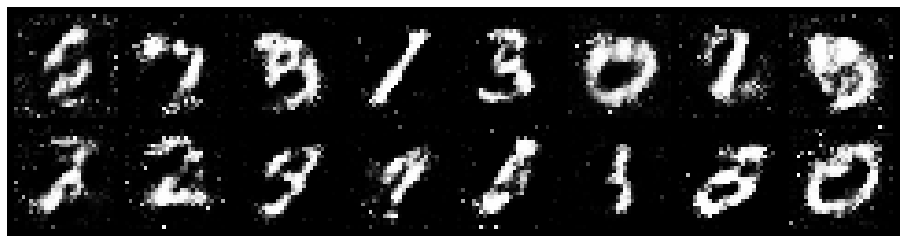

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.0202, Generator Loss: 3.0351
D(x): 0.6635, D(G(z)): 0.3569
gen_epochs:1 ,dis_epochs:1


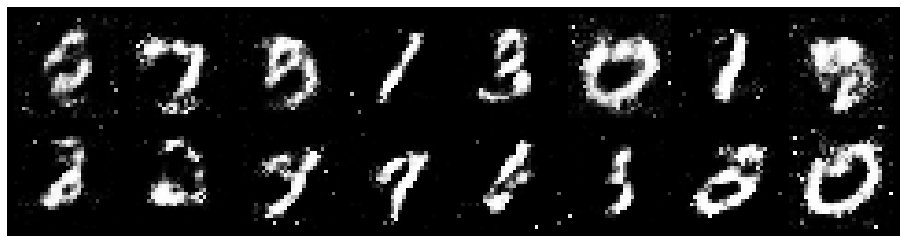

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.0363, Generator Loss: 3.6340
D(x): 0.6543, D(G(z)): 0.2894
gen_epochs:1 ,dis_epochs:1


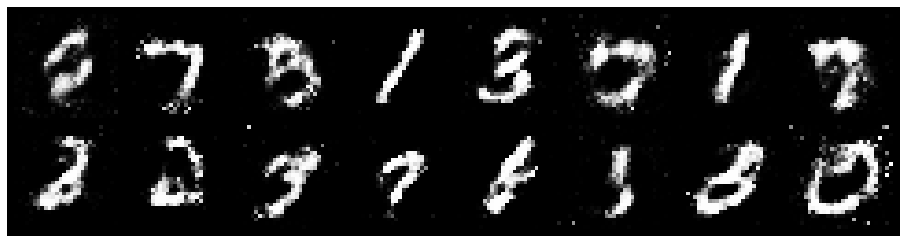

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.1679, Generator Loss: 2.7791
D(x): 0.6264, D(G(z)): 0.3691
gen_epochs:1 ,dis_epochs:1


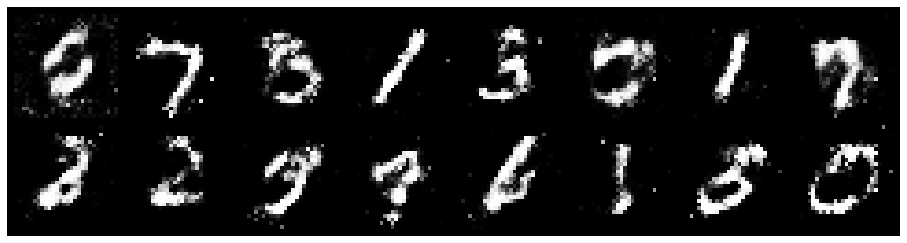

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.1393, Generator Loss: 2.6791
D(x): 0.5919, D(G(z)): 0.3574
gen_epochs:1 ,dis_epochs:1


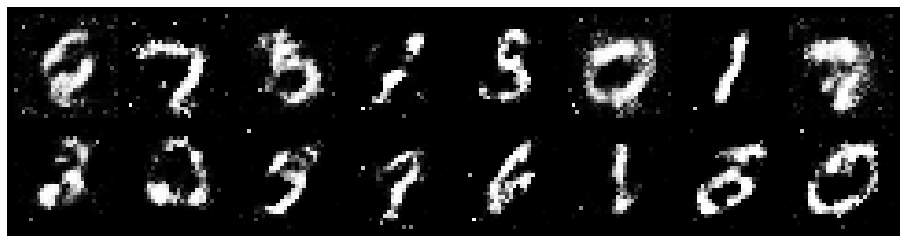

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.2721, Generator Loss: 2.3822
D(x): 0.6159, D(G(z)): 0.4462
gen_epochs:1 ,dis_epochs:1


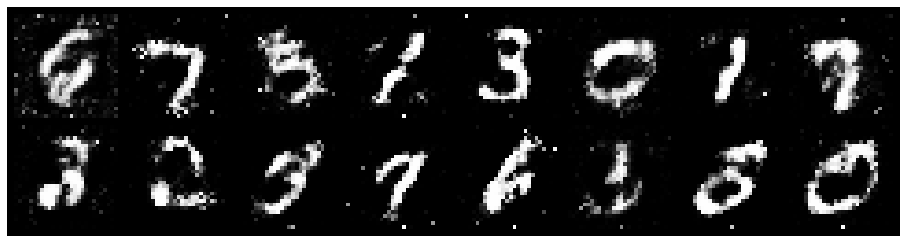

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 1.0558, Generator Loss: 3.0696
D(x): 0.6310, D(G(z)): 0.3280
gen_epochs:1 ,dis_epochs:1


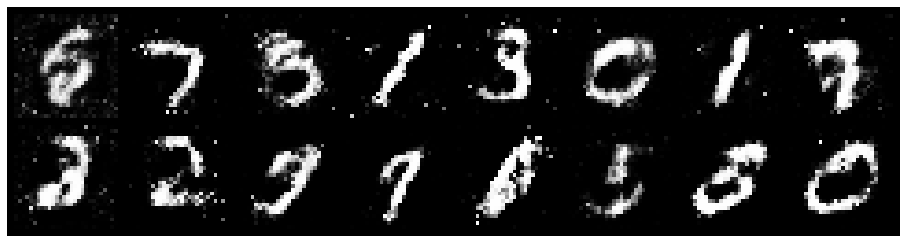

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.2563, Generator Loss: 2.5515
D(x): 0.5659, D(G(z)): 0.3672
gen_epochs:1 ,dis_epochs:1


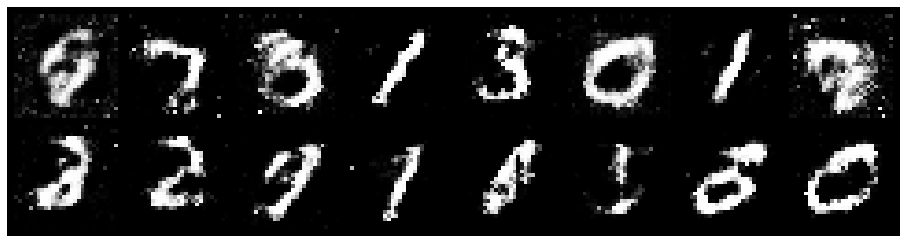

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.2883, Generator Loss: 2.8088
D(x): 0.6613, D(G(z)): 0.4606
gen_epochs:1 ,dis_epochs:1


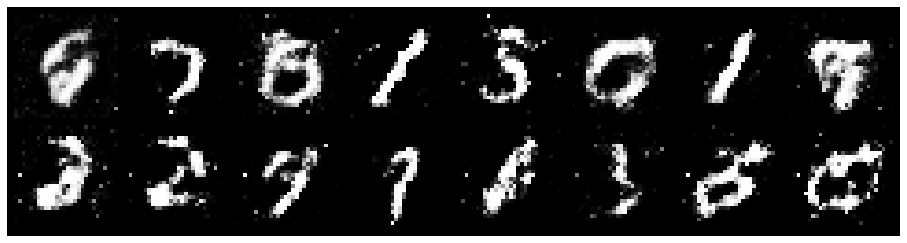

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 0.8895, Generator Loss: 2.9982
D(x): 0.7045, D(G(z)): 0.3202
gen_epochs:1 ,dis_epochs:1


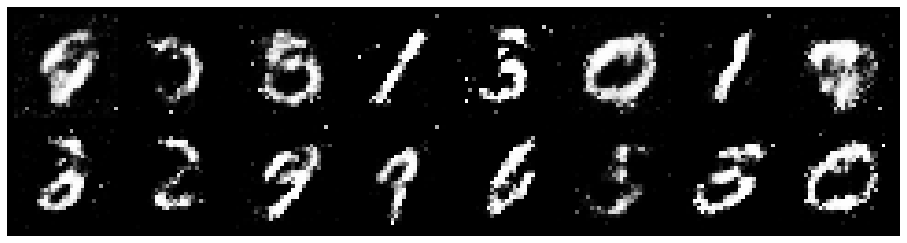

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 0.9058, Generator Loss: 3.2985
D(x): 0.6515, D(G(z)): 0.2797
gen_epochs:1 ,dis_epochs:1


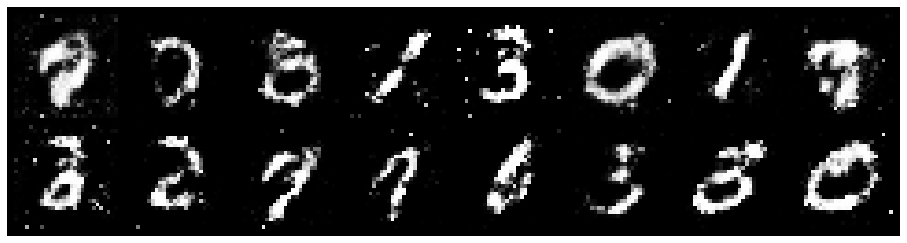

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 0.9665, Generator Loss: 3.2508
D(x): 0.6836, D(G(z)): 0.3443
gen_epochs:1 ,dis_epochs:1


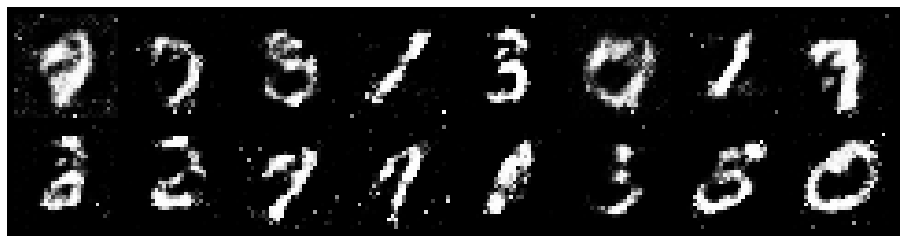

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.0683, Generator Loss: 3.2809
D(x): 0.6272, D(G(z)): 0.3093
gen_epochs:1 ,dis_epochs:1


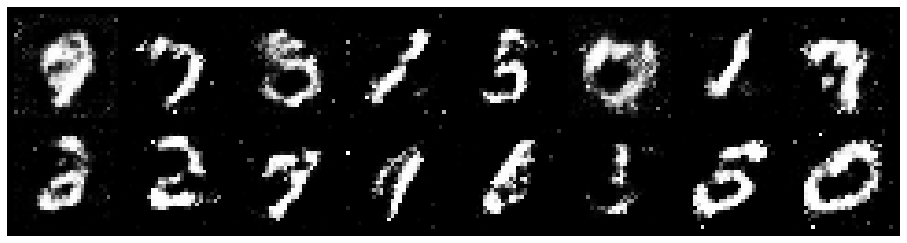

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.9776, Generator Loss: 3.2480
D(x): 0.7092, D(G(z)): 0.3456
gen_epochs:1 ,dis_epochs:1


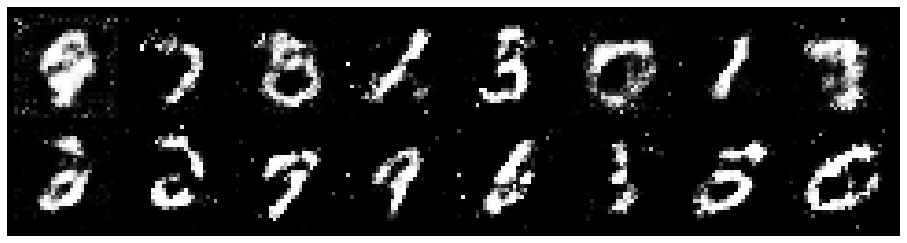

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.0294, Generator Loss: 2.8731
D(x): 0.6114, D(G(z)): 0.3032
gen_epochs:1 ,dis_epochs:1


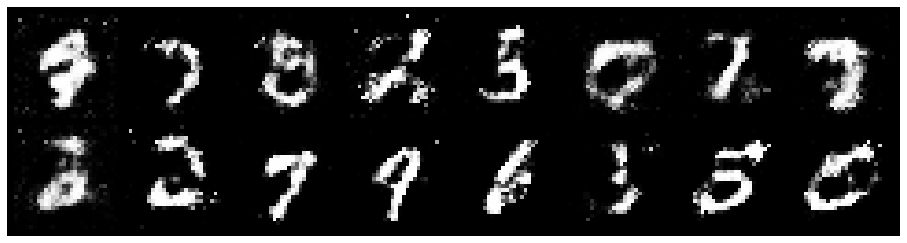

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 0.9130, Generator Loss: 3.5286
D(x): 0.6970, D(G(z)): 0.3175
gen_epochs:1 ,dis_epochs:1


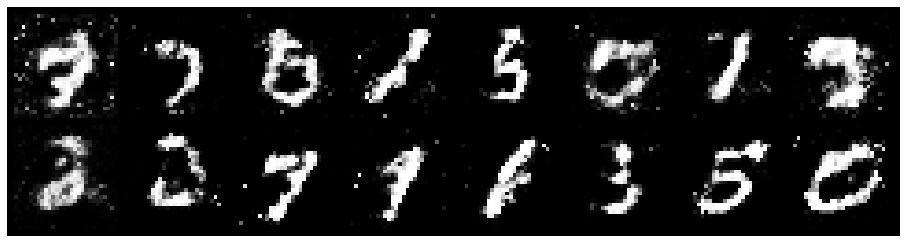

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.0701, Generator Loss: 2.9200
D(x): 0.6715, D(G(z)): 0.3617
gen_epochs:1 ,dis_epochs:1


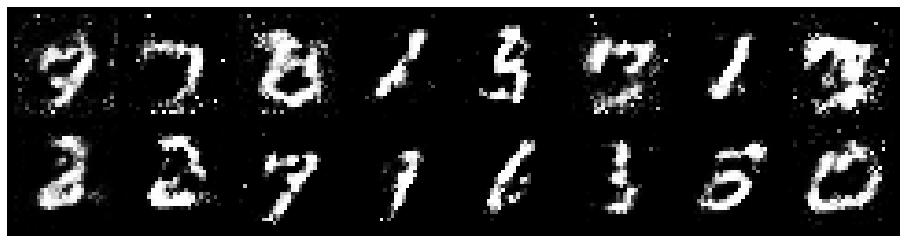

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 0.9576, Generator Loss: 2.9496
D(x): 0.6870, D(G(z)): 0.3708
gen_epochs:1 ,dis_epochs:1


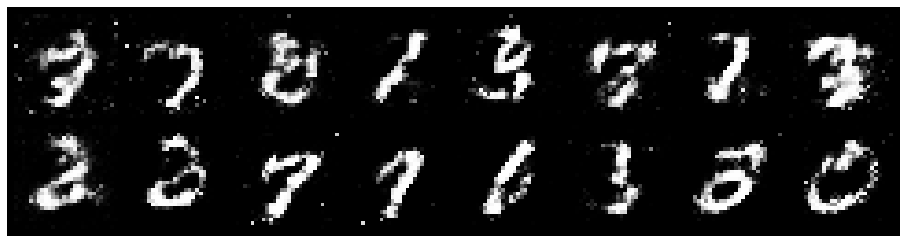

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 0.9251, Generator Loss: 3.1252
D(x): 0.7058, D(G(z)): 0.3363
gen_epochs:1 ,dis_epochs:1


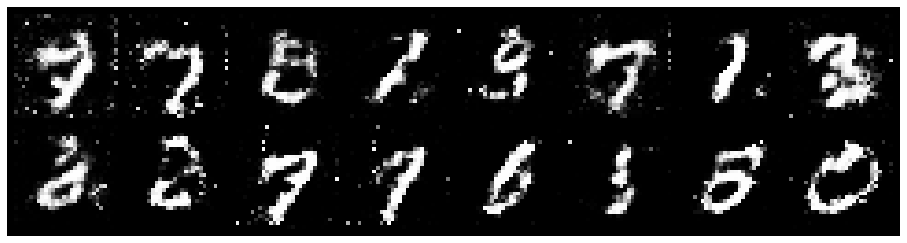

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 0.7821, Generator Loss: 3.3172
D(x): 0.7515, D(G(z)): 0.2873
gen_epochs:1 ,dis_epochs:1


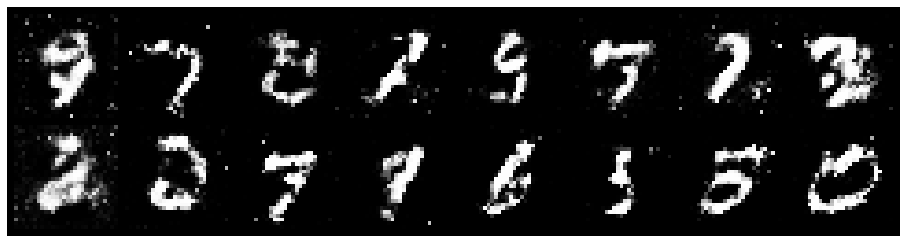

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.0330, Generator Loss: 3.2782
D(x): 0.6490, D(G(z)): 0.3305
gen_epochs:1 ,dis_epochs:1


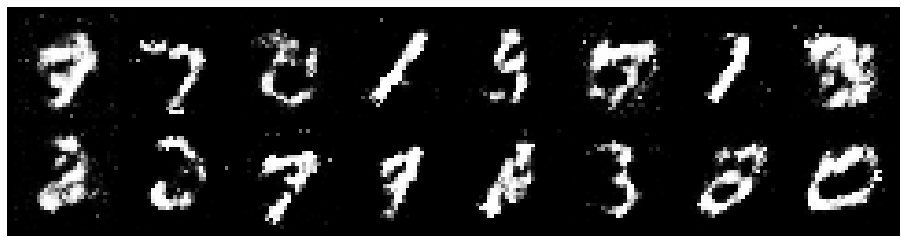

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0247, Generator Loss: 2.8813
D(x): 0.6904, D(G(z)): 0.3941
gen_epochs:1 ,dis_epochs:1


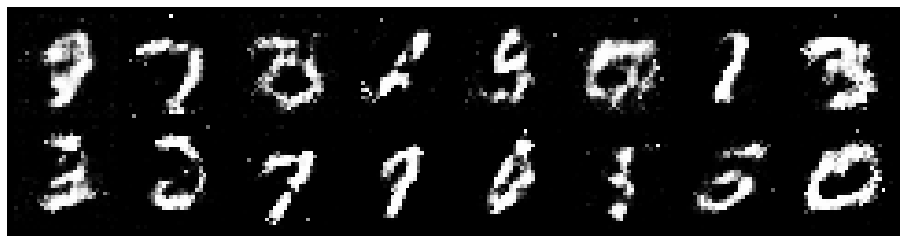

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 0.9617, Generator Loss: 2.8453
D(x): 0.6775, D(G(z)): 0.3377
gen_epochs:1 ,dis_epochs:1


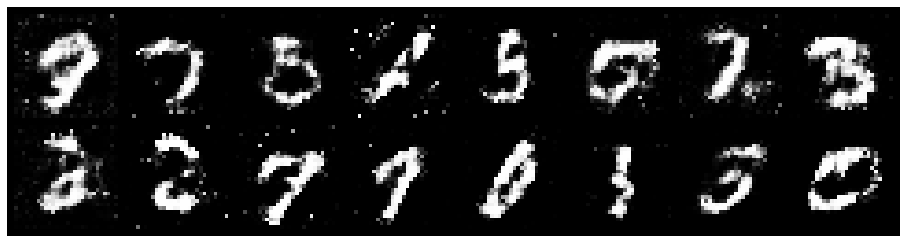

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.0370, Generator Loss: 3.1034
D(x): 0.6223, D(G(z)): 0.3149
gen_epochs:1 ,dis_epochs:1


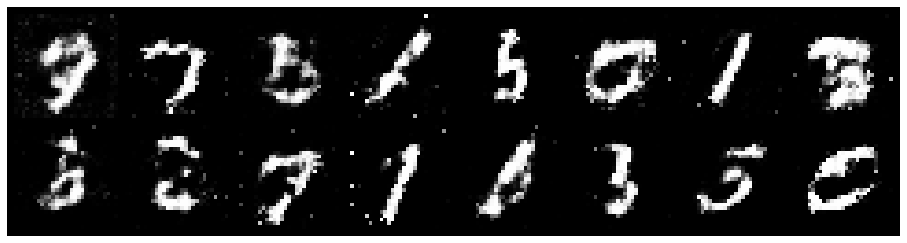

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.0086, Generator Loss: 3.3010
D(x): 0.7200, D(G(z)): 0.3630
gen_epochs:1 ,dis_epochs:1


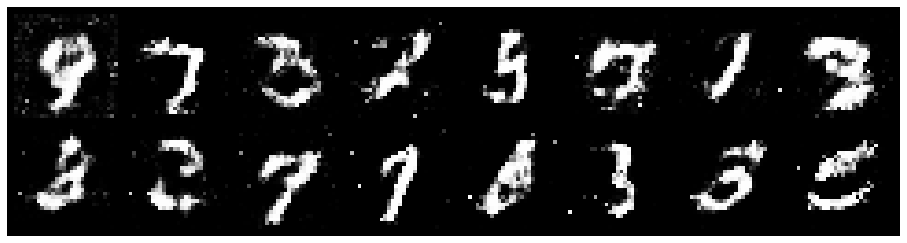

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.1328, Generator Loss: 2.8741
D(x): 0.6313, D(G(z)): 0.3696
gen_epochs:1 ,dis_epochs:1


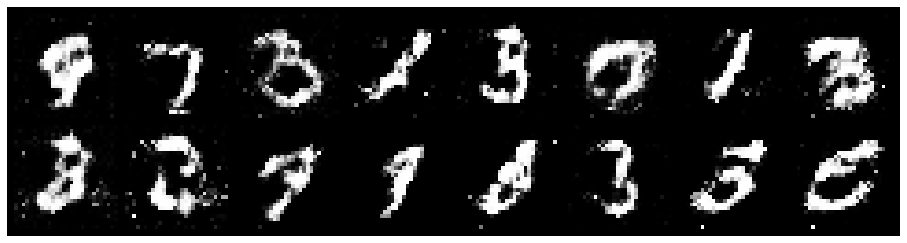

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.1059, Generator Loss: 2.6820
D(x): 0.5658, D(G(z)): 0.2941
gen_epochs:1 ,dis_epochs:1


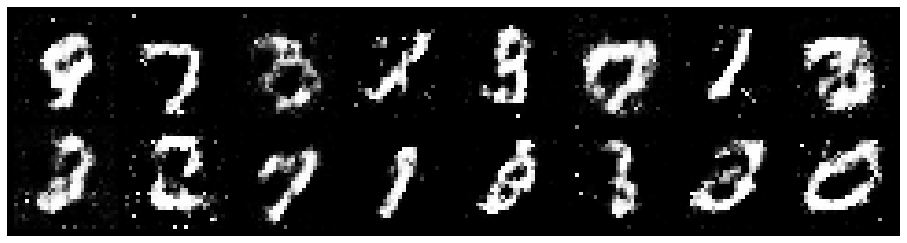

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.1060, Generator Loss: 3.6359
D(x): 0.6425, D(G(z)): 0.3371
gen_epochs:1 ,dis_epochs:1


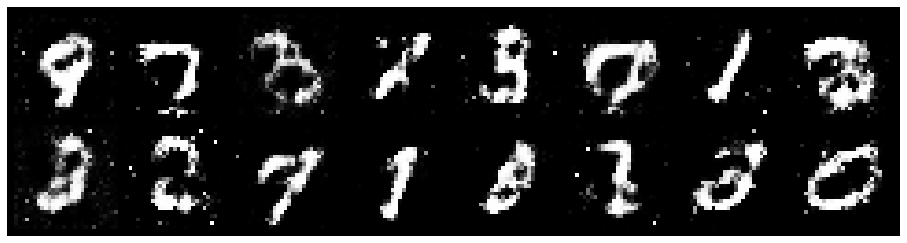

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.0513, Generator Loss: 2.9407
D(x): 0.6497, D(G(z)): 0.3483
gen_epochs:1 ,dis_epochs:1


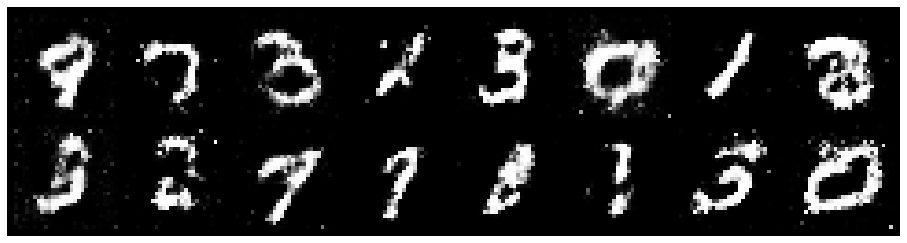

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 0.9664, Generator Loss: 2.8661
D(x): 0.6668, D(G(z)): 0.3588
gen_epochs:1 ,dis_epochs:1


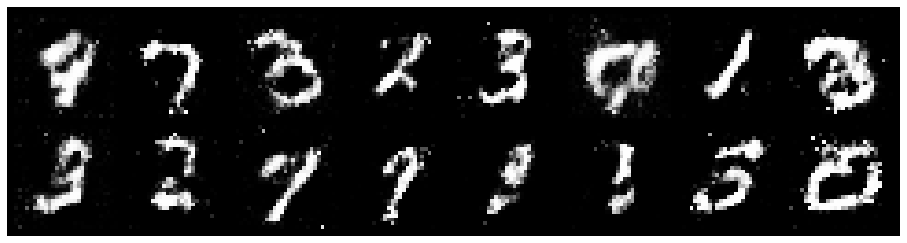

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.3166, Generator Loss: 2.4864
D(x): 0.5778, D(G(z)): 0.4019
gen_epochs:1 ,dis_epochs:1


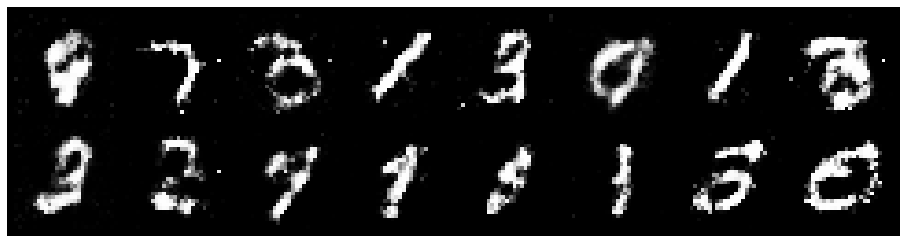

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.1670, Generator Loss: 2.3298
D(x): 0.6176, D(G(z)): 0.4194
gen_epochs:1 ,dis_epochs:1


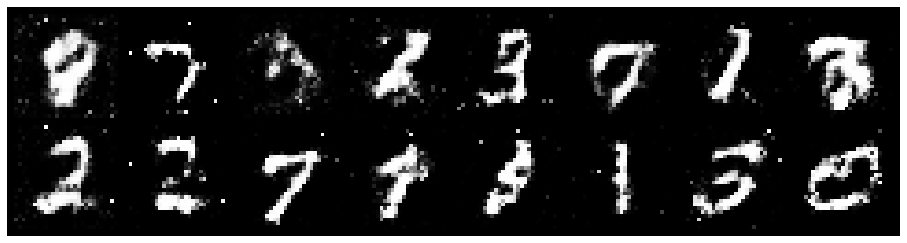

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.3734, Generator Loss: 2.0664
D(x): 0.5418, D(G(z)): 0.4461
gen_epochs:1 ,dis_epochs:1


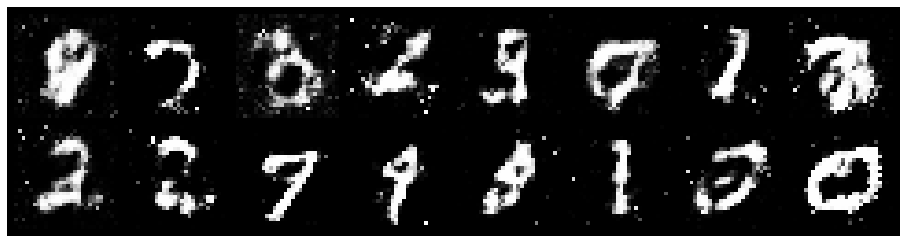

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.3277, Generator Loss: 2.1806
D(x): 0.5733, D(G(z)): 0.4300
gen_epochs:1 ,dis_epochs:1


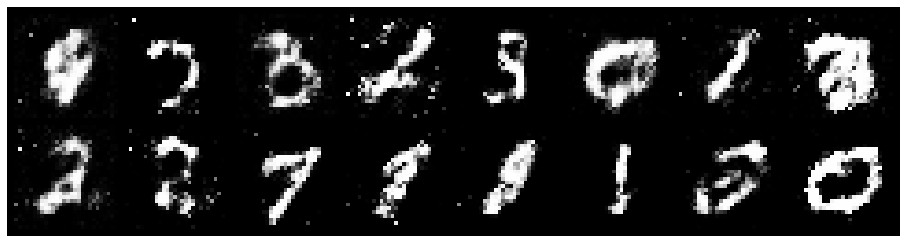

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.2200, Generator Loss: 2.2647
D(x): 0.5886, D(G(z)): 0.4045
gen_epochs:1 ,dis_epochs:1


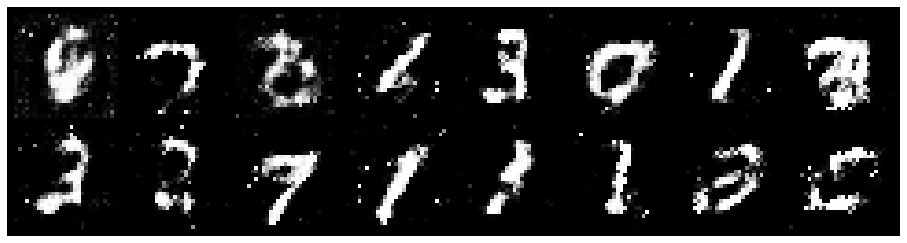

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.1202, Generator Loss: 2.6382
D(x): 0.6217, D(G(z)): 0.3705
gen_epochs:1 ,dis_epochs:1


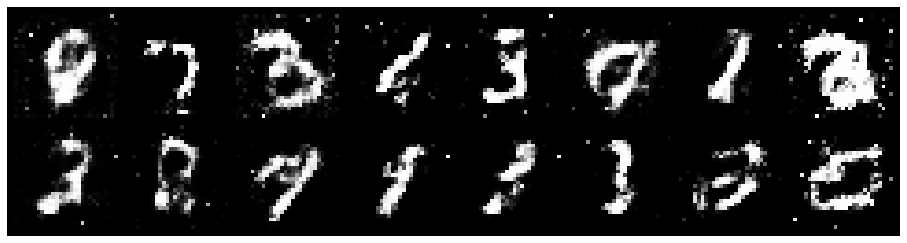

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.0924, Generator Loss: 2.3930
D(x): 0.6359, D(G(z)): 0.3506
gen_epochs:1 ,dis_epochs:1


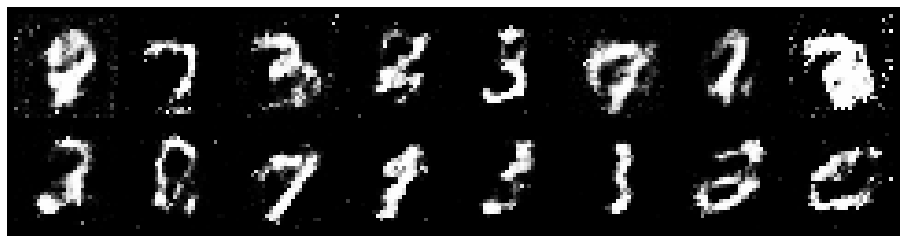

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.3342, Generator Loss: 2.1720
D(x): 0.5687, D(G(z)): 0.4393
gen_epochs:1 ,dis_epochs:1


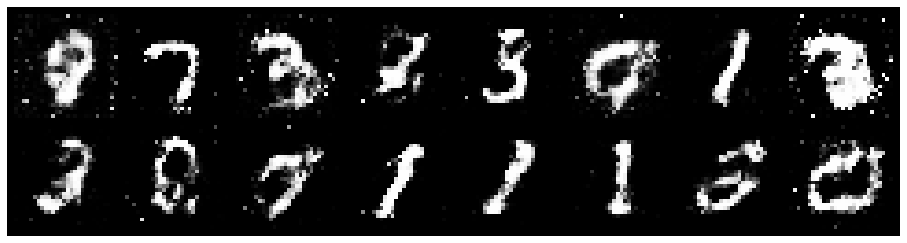

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0492, Generator Loss: 2.4295
D(x): 0.5979, D(G(z)): 0.3330
gen_epochs:1 ,dis_epochs:1


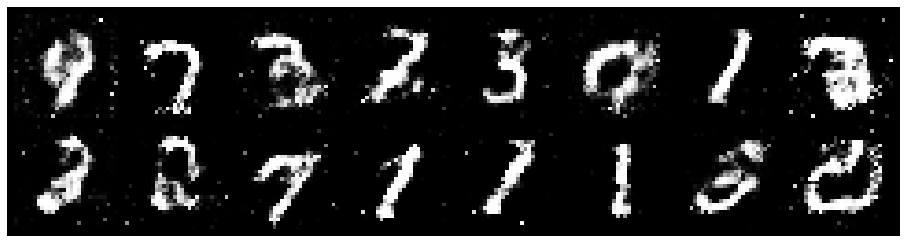

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.1016, Generator Loss: 2.1504
D(x): 0.5965, D(G(z)): 0.3871
gen_epochs:1 ,dis_epochs:1


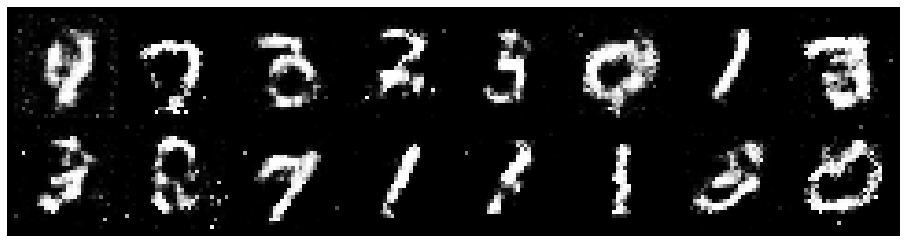

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 0.9955, Generator Loss: 2.9739
D(x): 0.6790, D(G(z)): 0.3363
gen_epochs:1 ,dis_epochs:1


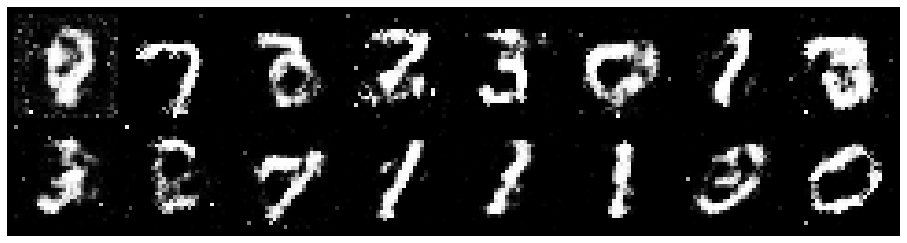

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.0448, Generator Loss: 2.9531
D(x): 0.6467, D(G(z)): 0.3474
gen_epochs:1 ,dis_epochs:1


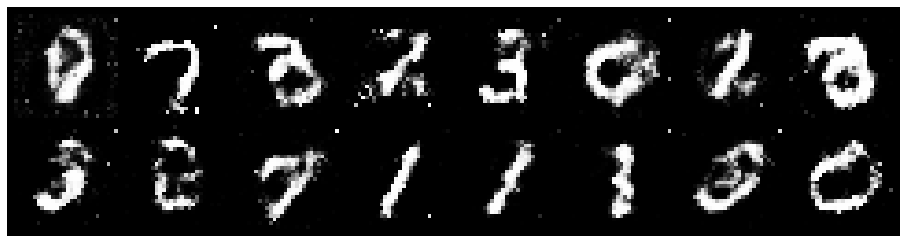

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.1168, Generator Loss: 2.9484
D(x): 0.6516, D(G(z)): 0.3322
gen_epochs:1 ,dis_epochs:1


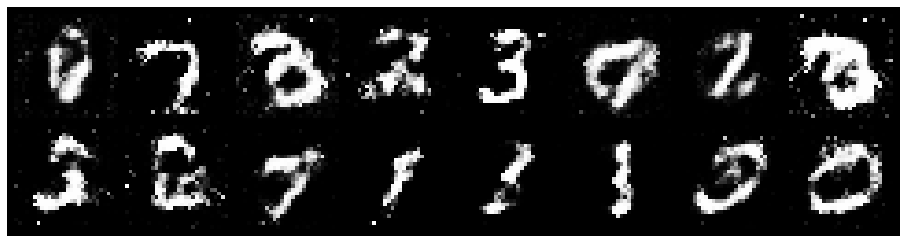

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.1390, Generator Loss: 2.2159
D(x): 0.6222, D(G(z)): 0.3847
gen_epochs:1 ,dis_epochs:1


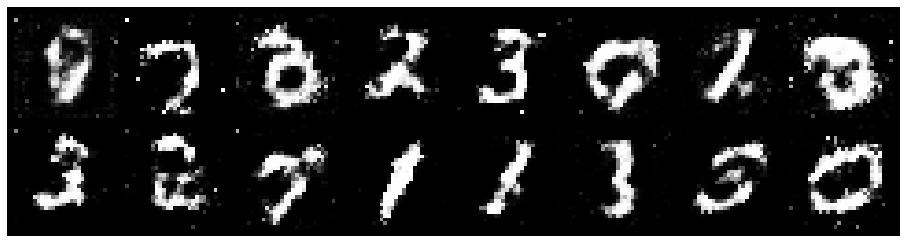

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 0.9944, Generator Loss: 2.7953
D(x): 0.6657, D(G(z)): 0.3648
gen_epochs:1 ,dis_epochs:1


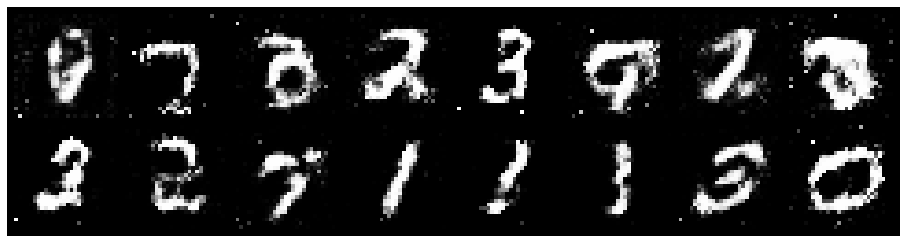

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.0849, Generator Loss: 2.7123
D(x): 0.6781, D(G(z)): 0.3969
gen_epochs:1 ,dis_epochs:1


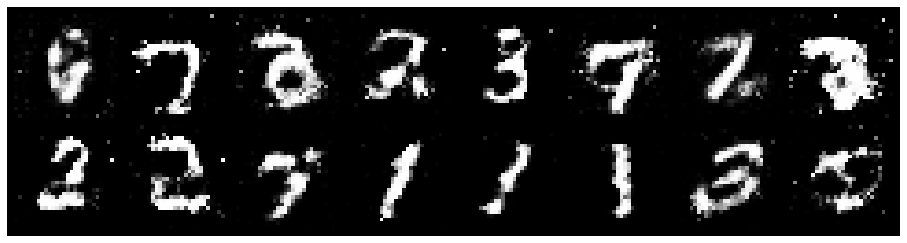

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.2632, Generator Loss: 2.4009
D(x): 0.5966, D(G(z)): 0.4210
gen_epochs:1 ,dis_epochs:1


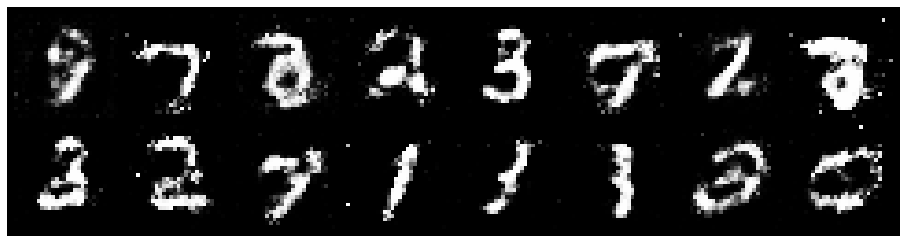

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.0479, Generator Loss: 2.5348
D(x): 0.6464, D(G(z)): 0.3918
gen_epochs:1 ,dis_epochs:1


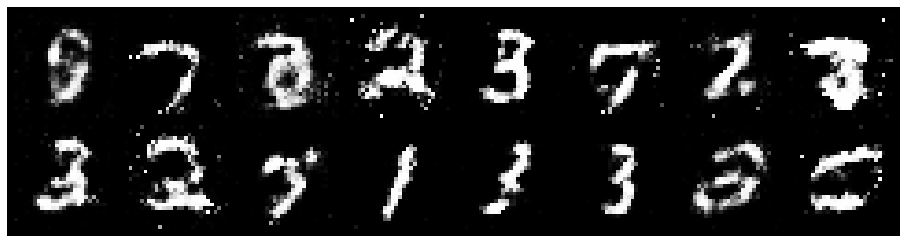

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.0723, Generator Loss: 2.3915
D(x): 0.6190, D(G(z)): 0.3619
gen_epochs:1 ,dis_epochs:1


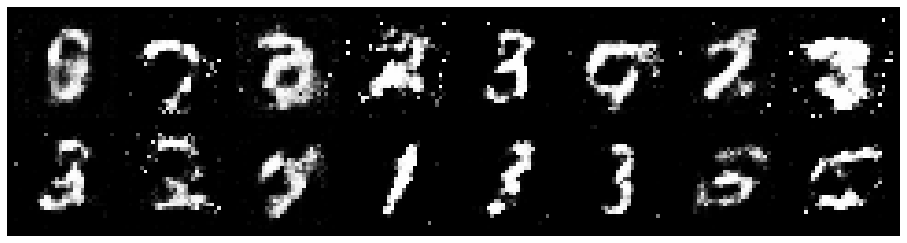

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.0238, Generator Loss: 2.4257
D(x): 0.6556, D(G(z)): 0.3984
gen_epochs:1 ,dis_epochs:1


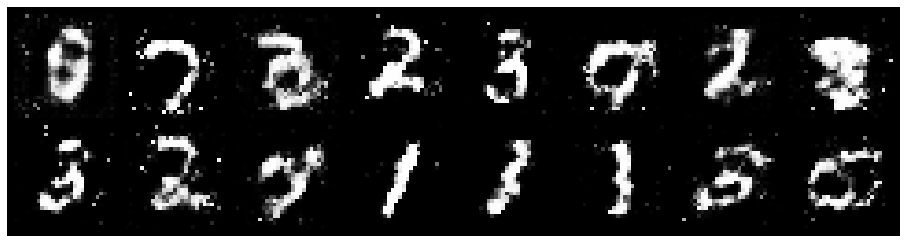

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.2867, Generator Loss: 2.5937
D(x): 0.5754, D(G(z)): 0.3839
gen_epochs:1 ,dis_epochs:1


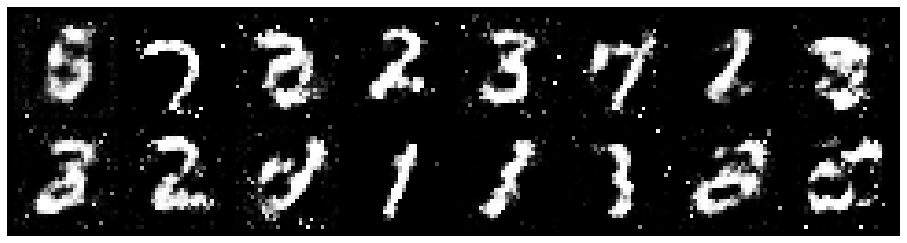

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.0638, Generator Loss: 2.8688
D(x): 0.7091, D(G(z)): 0.4141
gen_epochs:1 ,dis_epochs:1


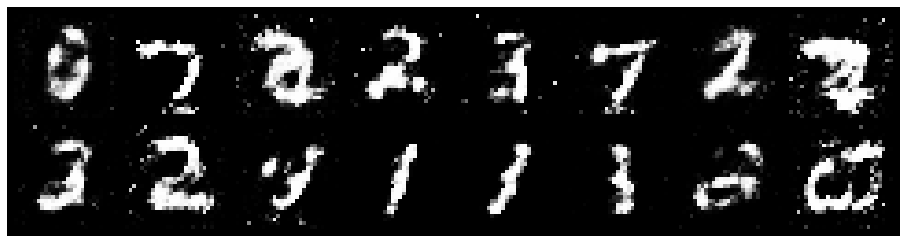

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.1311, Generator Loss: 2.6855
D(x): 0.6308, D(G(z)): 0.3558
gen_epochs:1 ,dis_epochs:1


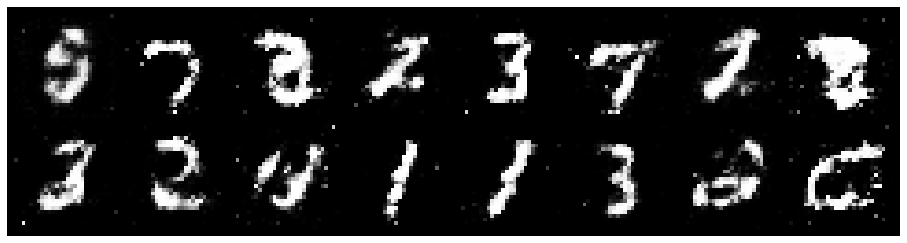

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 0.9634, Generator Loss: 3.2143
D(x): 0.6735, D(G(z)): 0.3129
gen_epochs:1 ,dis_epochs:1


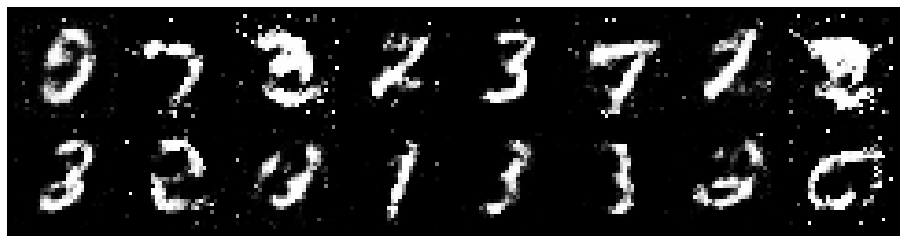

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 0.9090, Generator Loss: 3.1409
D(x): 0.6824, D(G(z)): 0.2833
gen_epochs:1 ,dis_epochs:1


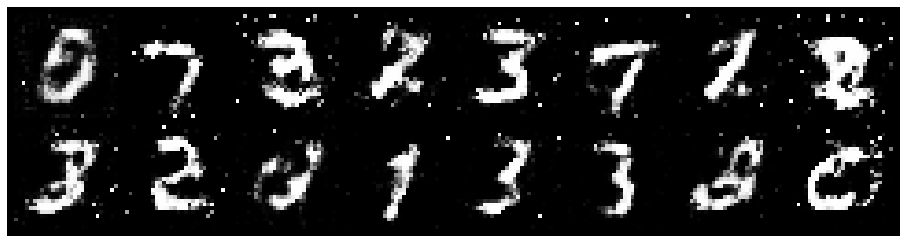

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.0685, Generator Loss: 2.6972
D(x): 0.6488, D(G(z)): 0.3460
gen_epochs:1 ,dis_epochs:1


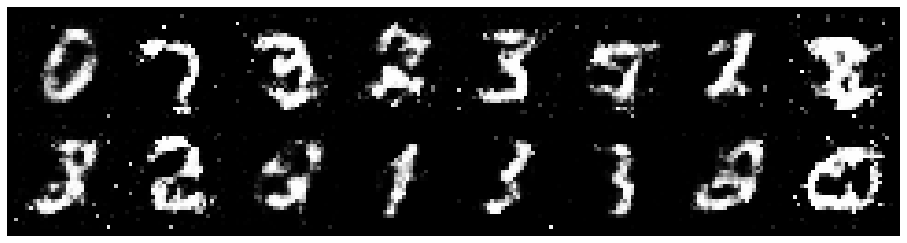

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.2664, Generator Loss: 2.1619
D(x): 0.6260, D(G(z)): 0.4404
gen_epochs:1 ,dis_epochs:1


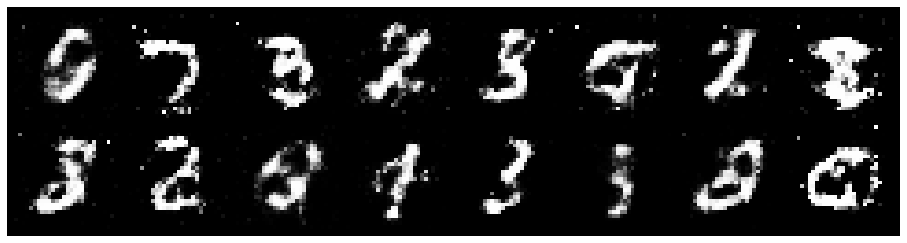

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.2450, Generator Loss: 2.7860
D(x): 0.6038, D(G(z)): 0.4125
gen_epochs:1 ,dis_epochs:1


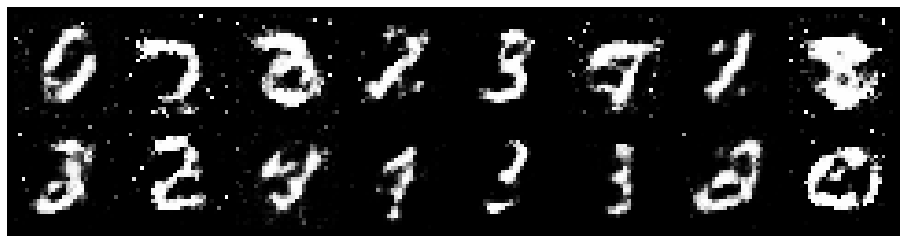

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.1370, Generator Loss: 2.3280
D(x): 0.6137, D(G(z)): 0.4138
gen_epochs:1 ,dis_epochs:1


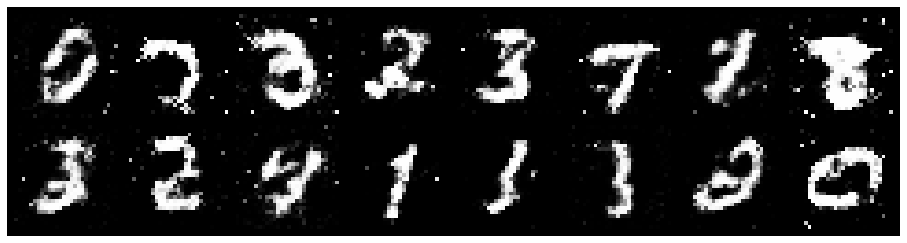

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.0980, Generator Loss: 2.6604
D(x): 0.6164, D(G(z)): 0.3633
gen_epochs:1 ,dis_epochs:1


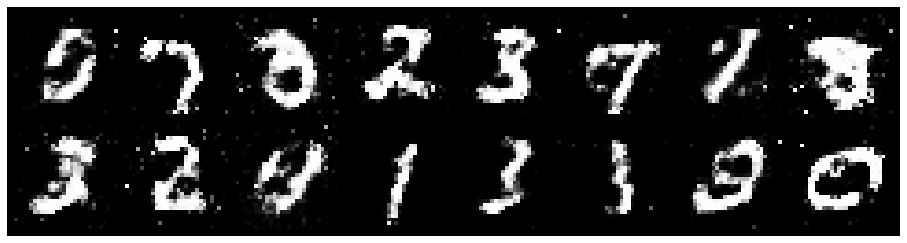

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.0701, Generator Loss: 2.2524
D(x): 0.6342, D(G(z)): 0.4013
gen_epochs:1 ,dis_epochs:1


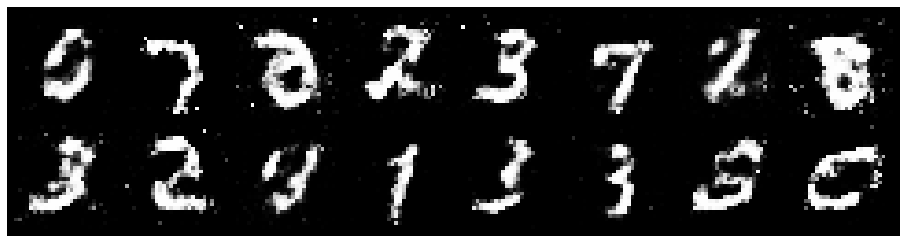

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 0.9811, Generator Loss: 2.6849
D(x): 0.6507, D(G(z)): 0.3276
gen_epochs:1 ,dis_epochs:1


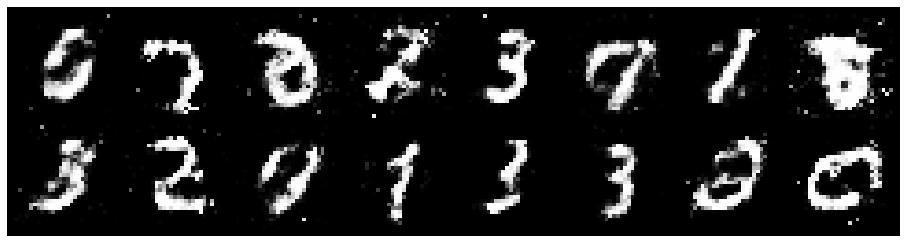

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1702, Generator Loss: 2.6381
D(x): 0.6841, D(G(z)): 0.4254
gen_epochs:1 ,dis_epochs:1


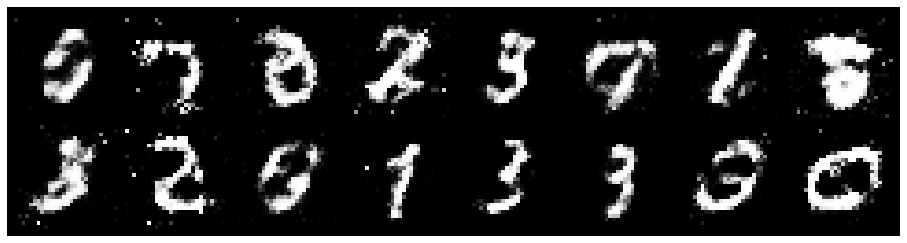

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 0.9718, Generator Loss: 2.7382
D(x): 0.6648, D(G(z)): 0.3497
gen_epochs:1 ,dis_epochs:1


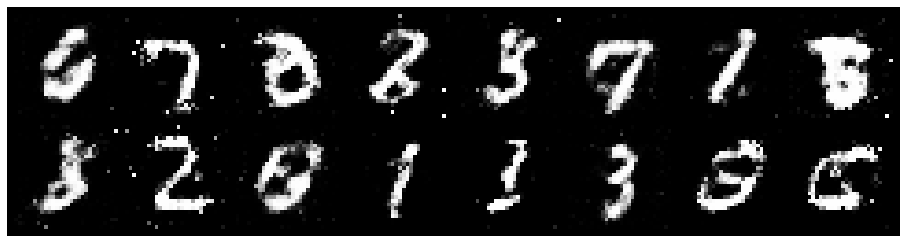

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.2532, Generator Loss: 2.5158
D(x): 0.5366, D(G(z)): 0.3268
gen_epochs:1 ,dis_epochs:1


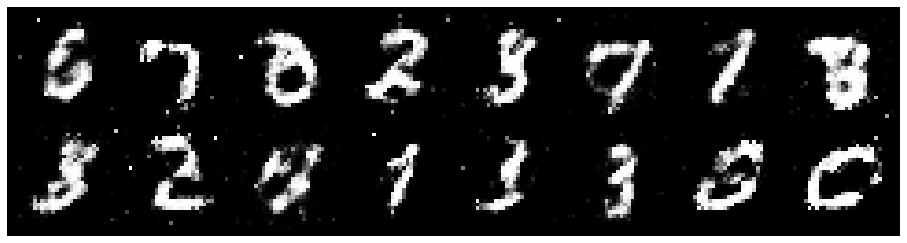

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.1190, Generator Loss: 2.4591
D(x): 0.6084, D(G(z)): 0.3623
gen_epochs:1 ,dis_epochs:1


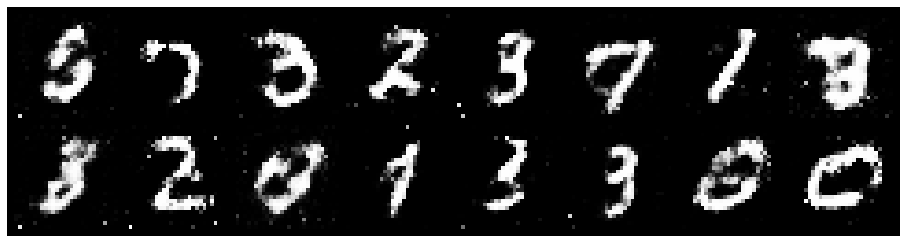

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.2075, Generator Loss: 1.9284
D(x): 0.5326, D(G(z)): 0.3751
gen_epochs:1 ,dis_epochs:1


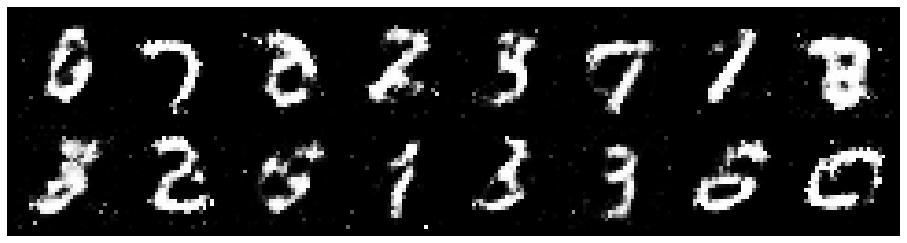

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.2555, Generator Loss: 1.9696
D(x): 0.5683, D(G(z)): 0.4194
gen_epochs:1 ,dis_epochs:1


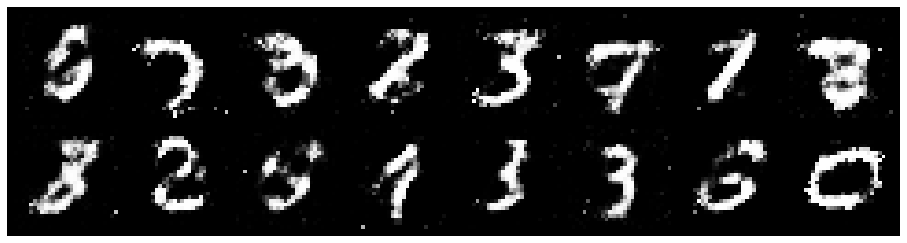

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.1314, Generator Loss: 2.2573
D(x): 0.6108, D(G(z)): 0.3926
gen_epochs:1 ,dis_epochs:1


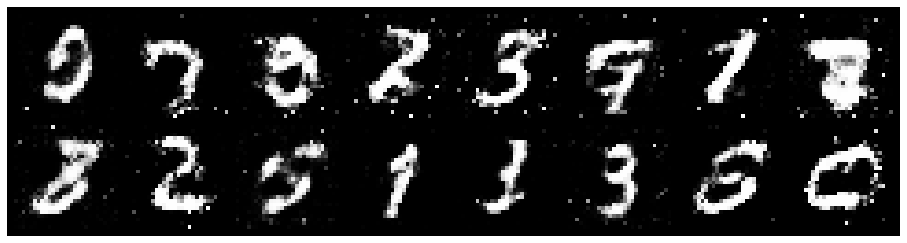

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.0695, Generator Loss: 2.5545
D(x): 0.6635, D(G(z)): 0.4022
gen_epochs:1 ,dis_epochs:1


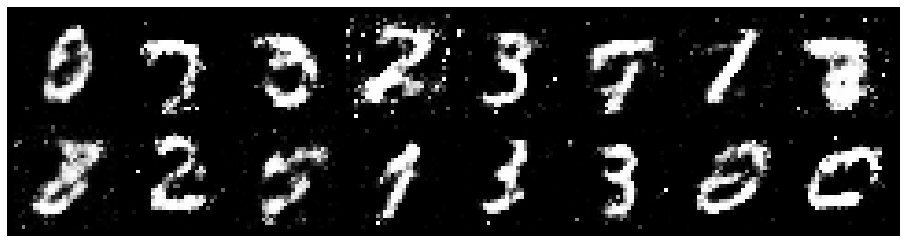

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.2228, Generator Loss: 2.2783
D(x): 0.6117, D(G(z)): 0.4446
gen_epochs:1 ,dis_epochs:1


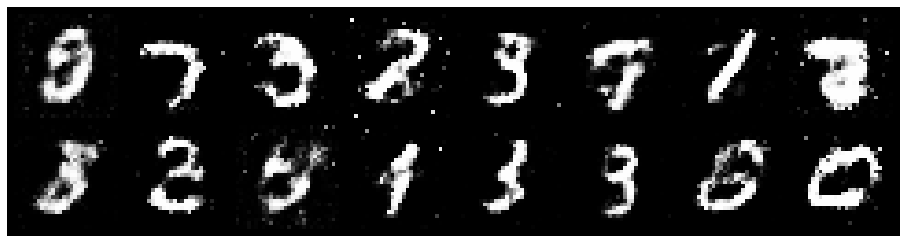

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.1310, Generator Loss: 3.2471
D(x): 0.6605, D(G(z)): 0.3282
gen_epochs:1 ,dis_epochs:1


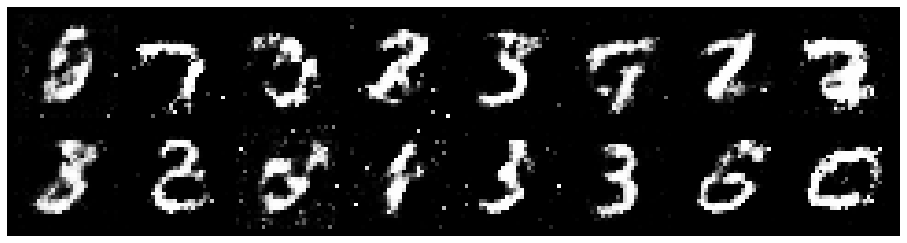

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.0327, Generator Loss: 2.6876
D(x): 0.6671, D(G(z)): 0.3687
gen_epochs:1 ,dis_epochs:1


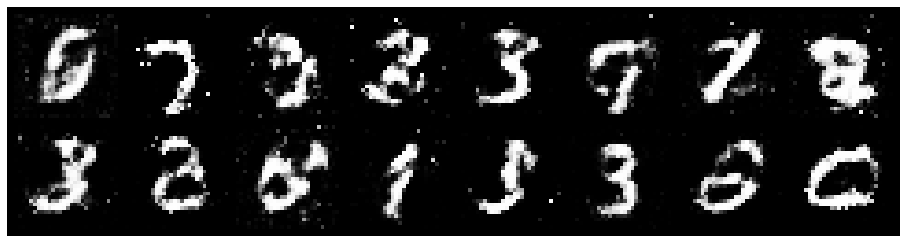

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.2550, Generator Loss: 2.3063
D(x): 0.6302, D(G(z)): 0.4442
gen_epochs:1 ,dis_epochs:1


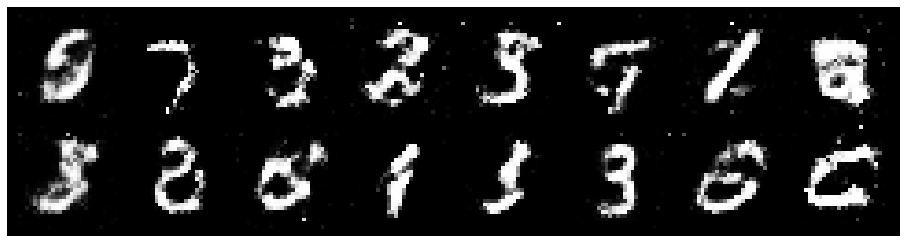

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.0315, Generator Loss: 2.5623
D(x): 0.6310, D(G(z)): 0.3587
gen_epochs:1 ,dis_epochs:1


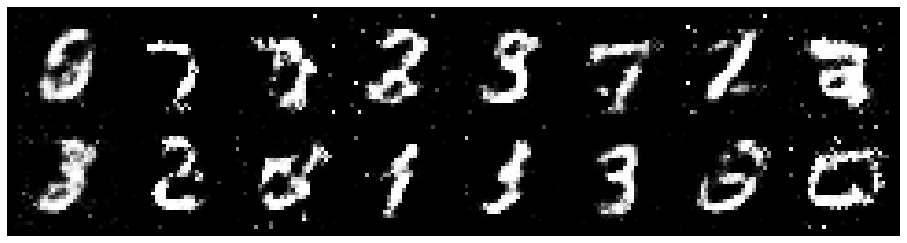

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.1288, Generator Loss: 2.8633
D(x): 0.6120, D(G(z)): 0.3019
gen_epochs:1 ,dis_epochs:1


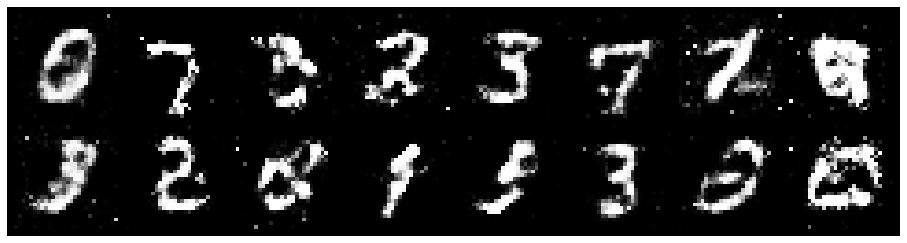

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.0748, Generator Loss: 2.4353
D(x): 0.6598, D(G(z)): 0.4130
gen_epochs:1 ,dis_epochs:1


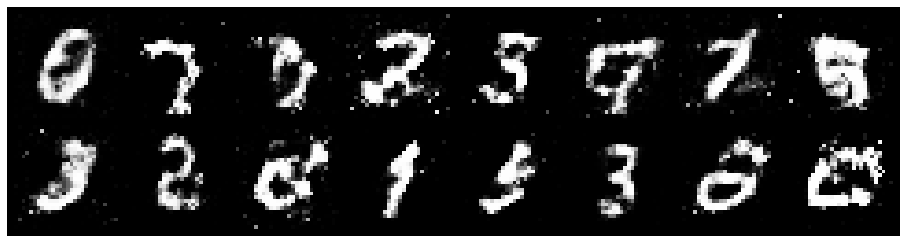

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 0.9157, Generator Loss: 3.1364
D(x): 0.6765, D(G(z)): 0.3164
gen_epochs:1 ,dis_epochs:1


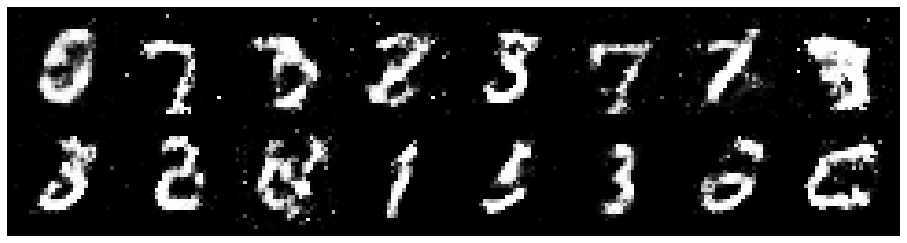

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.0269, Generator Loss: 2.9303
D(x): 0.6625, D(G(z)): 0.3492
gen_epochs:1 ,dis_epochs:1


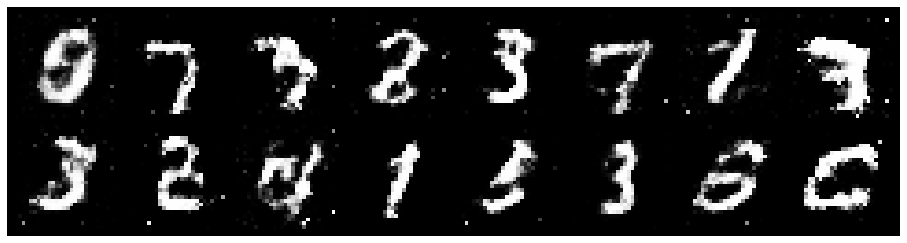

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.2107, Generator Loss: 2.3303
D(x): 0.5235, D(G(z)): 0.3316
gen_epochs:1 ,dis_epochs:1


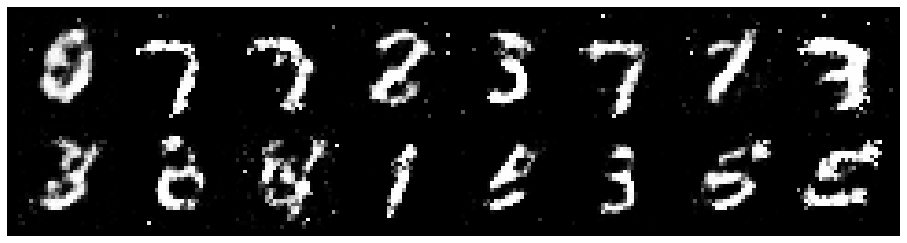

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.0341, Generator Loss: 2.2411
D(x): 0.6278, D(G(z)): 0.3783
gen_epochs:1 ,dis_epochs:1


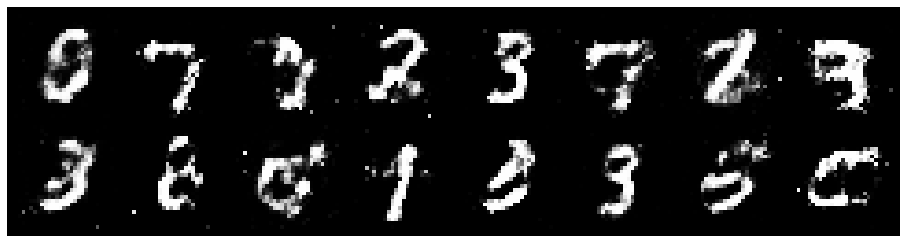

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.1357, Generator Loss: 2.0809
D(x): 0.6238, D(G(z)): 0.4327
gen_epochs:1 ,dis_epochs:1


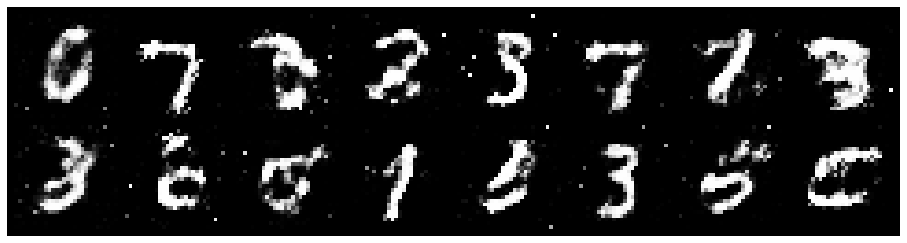

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.0968, Generator Loss: 2.3470
D(x): 0.6353, D(G(z)): 0.3734
gen_epochs:1 ,dis_epochs:1


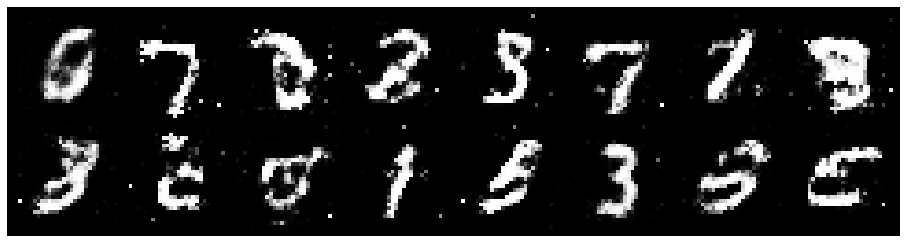

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.0129, Generator Loss: 2.4860
D(x): 0.6775, D(G(z)): 0.4057
gen_epochs:1 ,dis_epochs:1


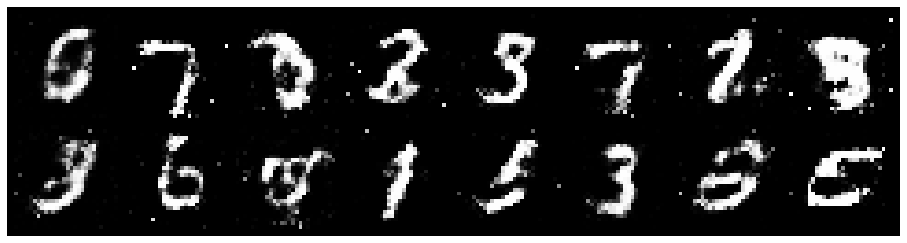

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.0581, Generator Loss: 2.5364
D(x): 0.6144, D(G(z)): 0.3605
gen_epochs:1 ,dis_epochs:1


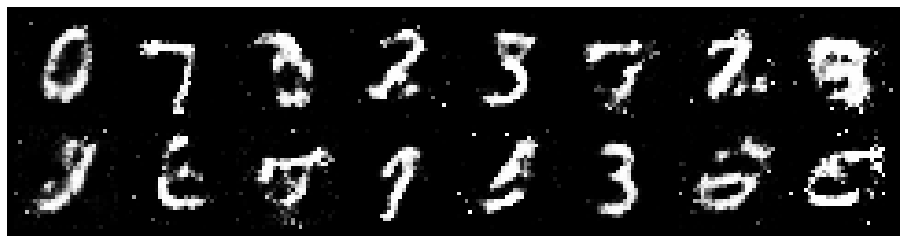

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.0734, Generator Loss: 2.5714
D(x): 0.6510, D(G(z)): 0.4005
gen_epochs:1 ,dis_epochs:1


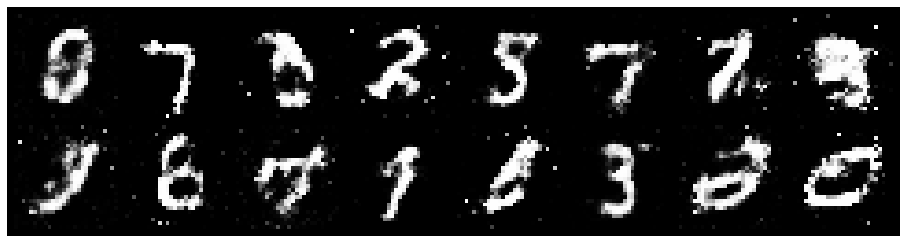

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.1263, Generator Loss: 2.3617
D(x): 0.6155, D(G(z)): 0.3820
gen_epochs:1 ,dis_epochs:1


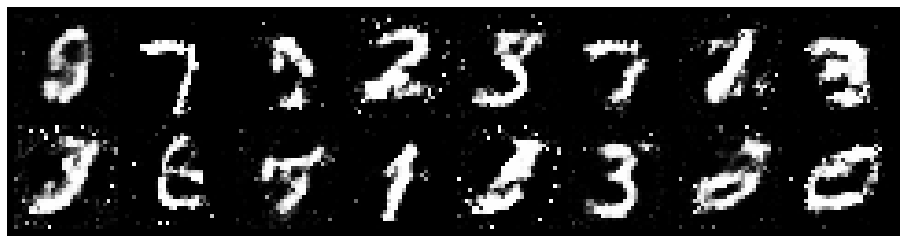

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 0.9921, Generator Loss: 2.7378
D(x): 0.6467, D(G(z)): 0.3462
gen_epochs:1 ,dis_epochs:1


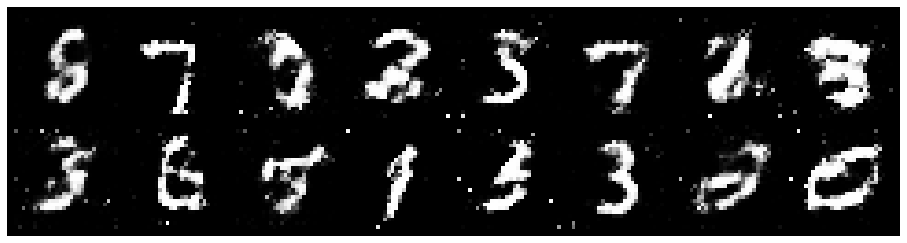

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.0020, Generator Loss: 2.7735
D(x): 0.5577, D(G(z)): 0.2544
gen_epochs:1 ,dis_epochs:1


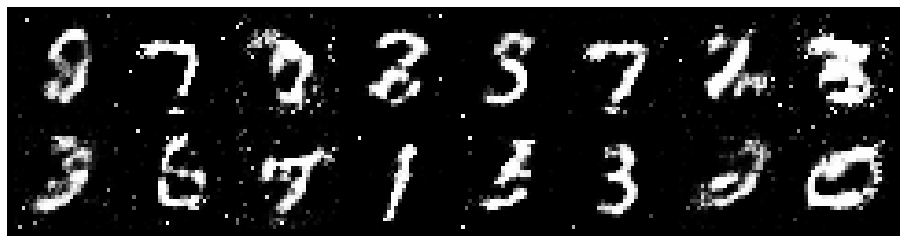

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.0359, Generator Loss: 2.5341
D(x): 0.6407, D(G(z)): 0.3800
gen_epochs:1 ,dis_epochs:1


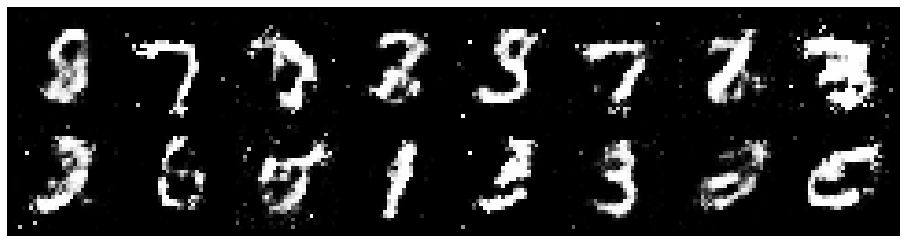

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.1127, Generator Loss: 2.4322
D(x): 0.6412, D(G(z)): 0.4074
gen_epochs:1 ,dis_epochs:1


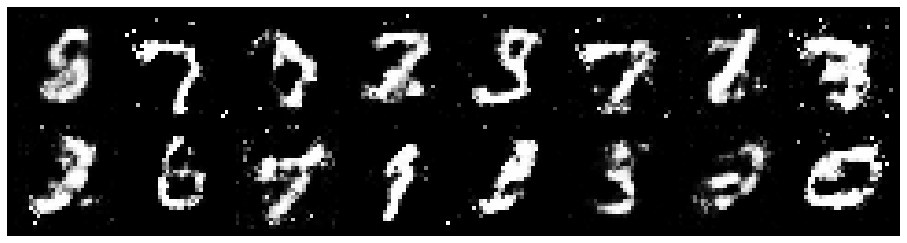

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.1364, Generator Loss: 2.0335
D(x): 0.6121, D(G(z)): 0.4176
gen_epochs:1 ,dis_epochs:1


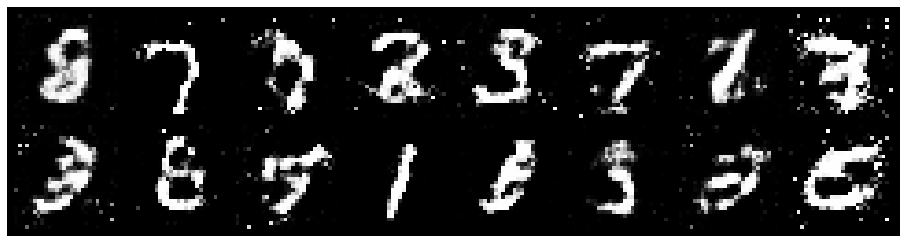

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.2189, Generator Loss: 2.0107
D(x): 0.5518, D(G(z)): 0.3823
gen_epochs:1 ,dis_epochs:1


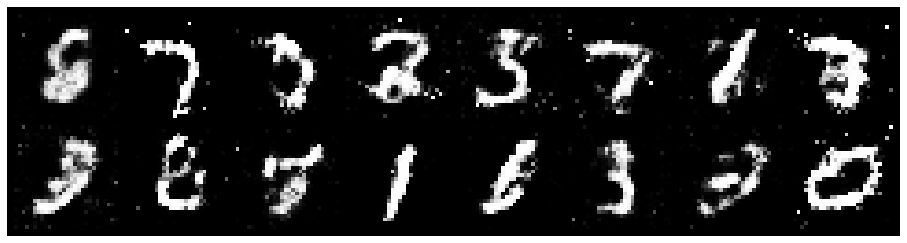

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.0578, Generator Loss: 2.1191
D(x): 0.6477, D(G(z)): 0.3956
gen_epochs:1 ,dis_epochs:1


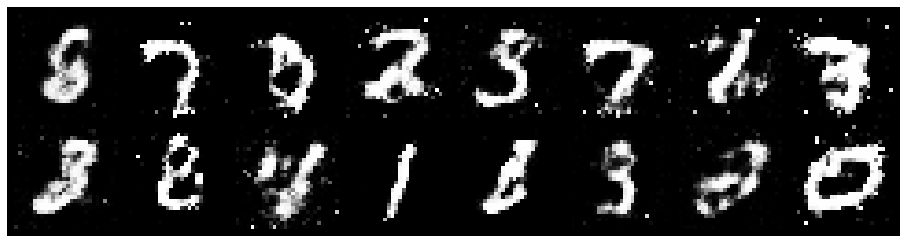

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.0619, Generator Loss: 2.3793
D(x): 0.6222, D(G(z)): 0.3650
gen_epochs:1 ,dis_epochs:1


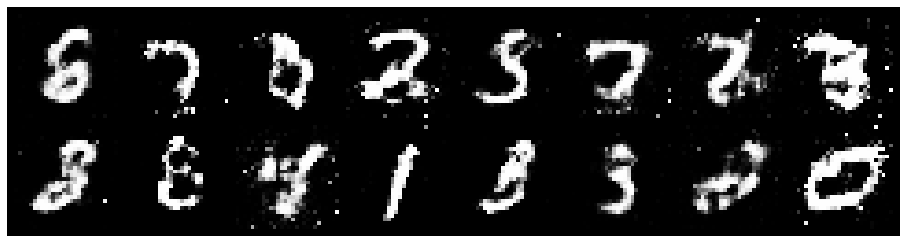

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.0420, Generator Loss: 2.7508
D(x): 0.6695, D(G(z)): 0.3621
gen_epochs:1 ,dis_epochs:1


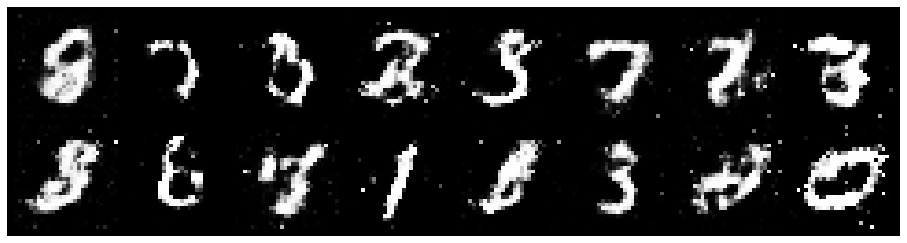

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.1781, Generator Loss: 2.6229
D(x): 0.5847, D(G(z)): 0.3611
gen_epochs:1 ,dis_epochs:1


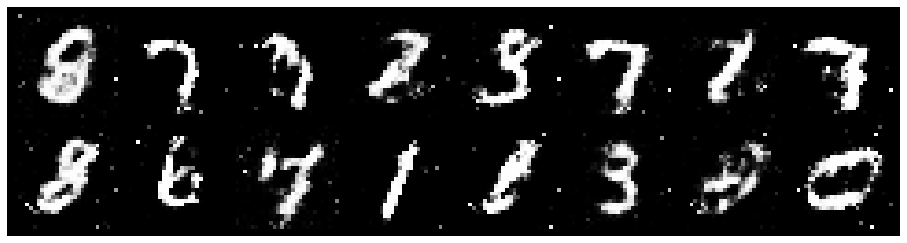

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.0451, Generator Loss: 2.6613
D(x): 0.6114, D(G(z)): 0.3369
gen_epochs:1 ,dis_epochs:1


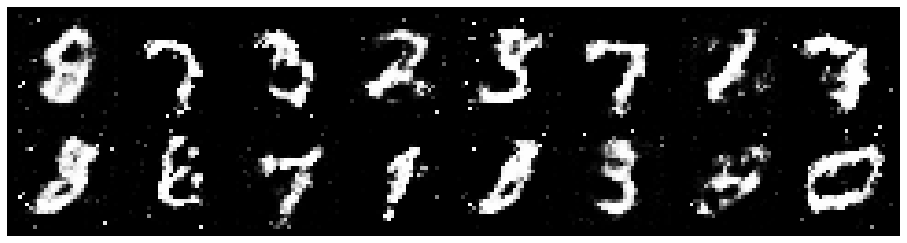

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.1473, Generator Loss: 2.3271
D(x): 0.5461, D(G(z)): 0.3381
gen_epochs:1 ,dis_epochs:1


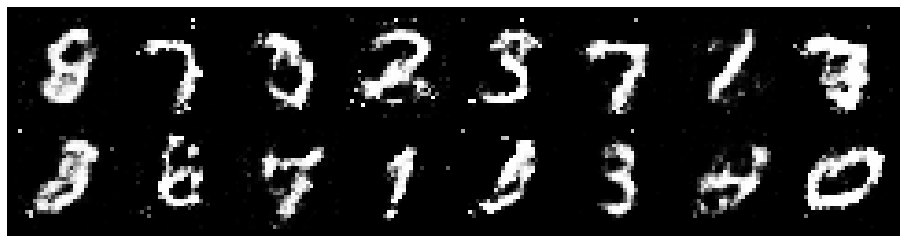

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.2125, Generator Loss: 2.3171
D(x): 0.6239, D(G(z)): 0.4345
gen_epochs:1 ,dis_epochs:1


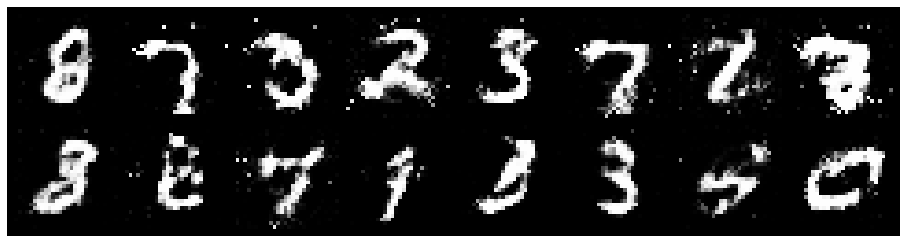

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.1948, Generator Loss: 2.4966
D(x): 0.5315, D(G(z)): 0.3038
gen_epochs:1 ,dis_epochs:1


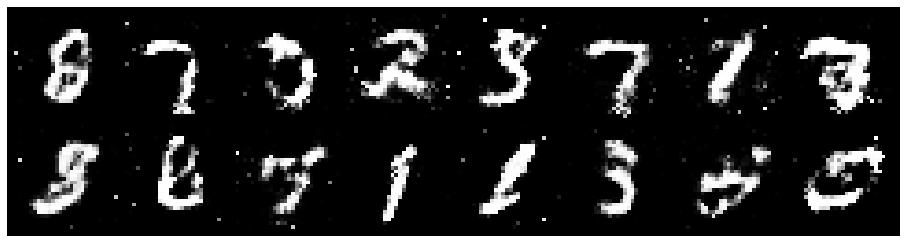

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.0901, Generator Loss: 2.4958
D(x): 0.6343, D(G(z)): 0.4010
gen_epochs:1 ,dis_epochs:1


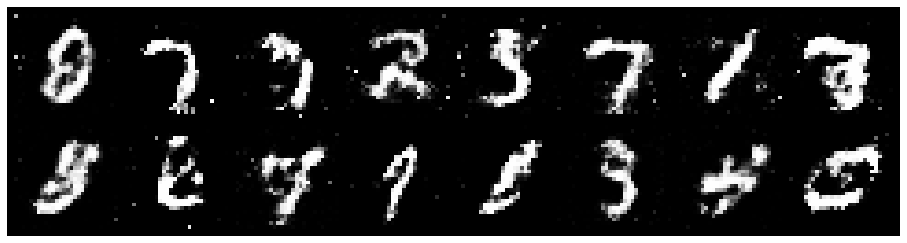

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.1433, Generator Loss: 2.0548
D(x): 0.6359, D(G(z)): 0.4253
gen_epochs:1 ,dis_epochs:1


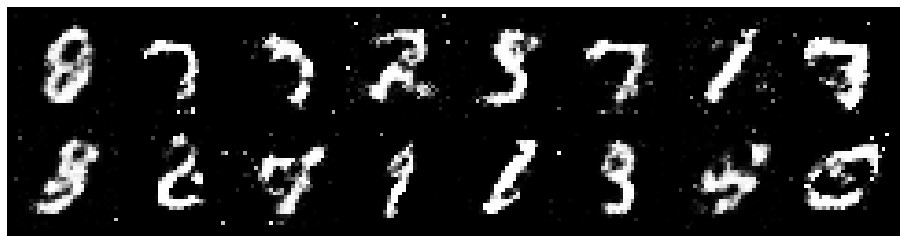

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.0432, Generator Loss: 2.3093
D(x): 0.6081, D(G(z)): 0.3717
gen_epochs:1 ,dis_epochs:1


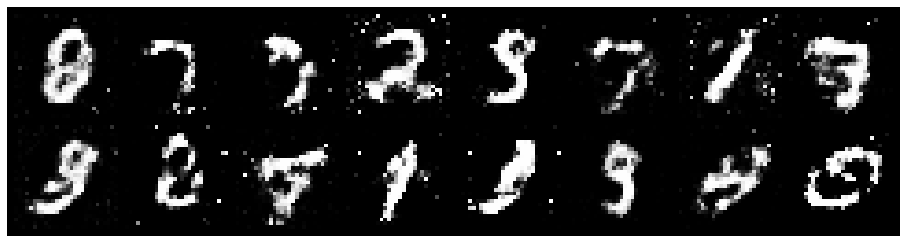

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.1693, Generator Loss: 2.4098
D(x): 0.6536, D(G(z)): 0.4279
gen_epochs:1 ,dis_epochs:1


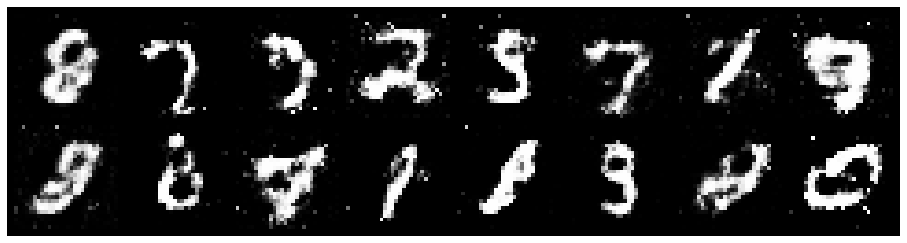

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.1120, Generator Loss: 2.2545
D(x): 0.6007, D(G(z)): 0.3848
gen_epochs:1 ,dis_epochs:1


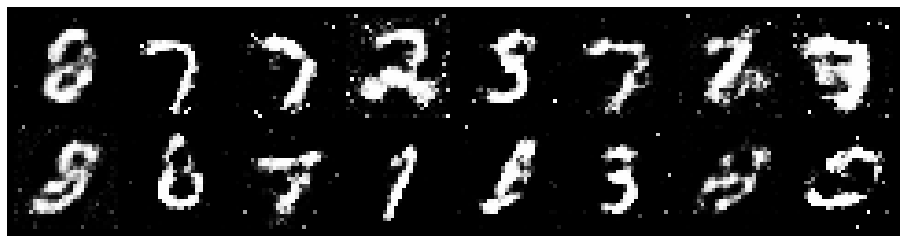

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 0.9926, Generator Loss: 2.7098
D(x): 0.6277, D(G(z)): 0.3185
gen_epochs:1 ,dis_epochs:1


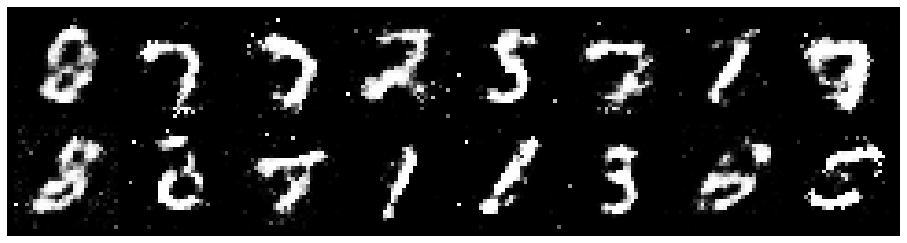

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.0527, Generator Loss: 2.7445
D(x): 0.5939, D(G(z)): 0.3008
gen_epochs:1 ,dis_epochs:1


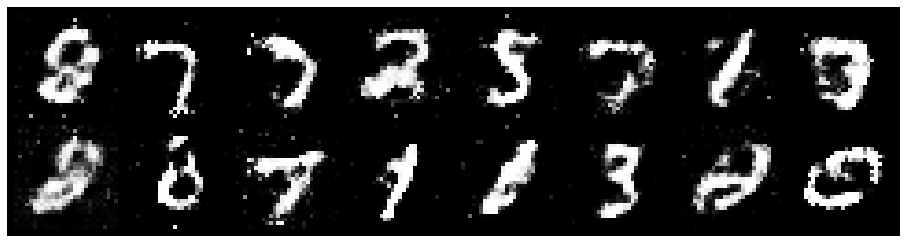

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.1474, Generator Loss: 2.3628
D(x): 0.5865, D(G(z)): 0.3664
gen_epochs:1 ,dis_epochs:1


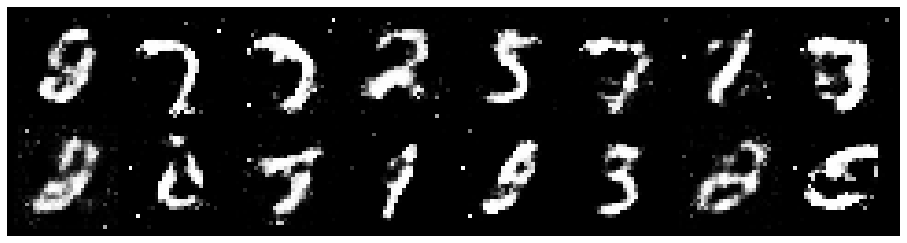

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1492, Generator Loss: 2.2386
D(x): 0.5783, D(G(z)): 0.3749
gen_epochs:1 ,dis_epochs:1


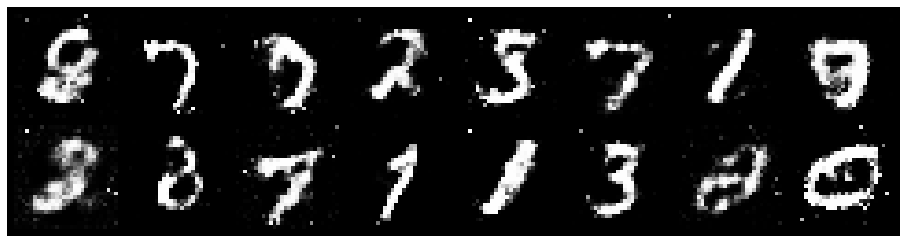

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.1022, Generator Loss: 2.5361
D(x): 0.6232, D(G(z)): 0.3856
gen_epochs:1 ,dis_epochs:1


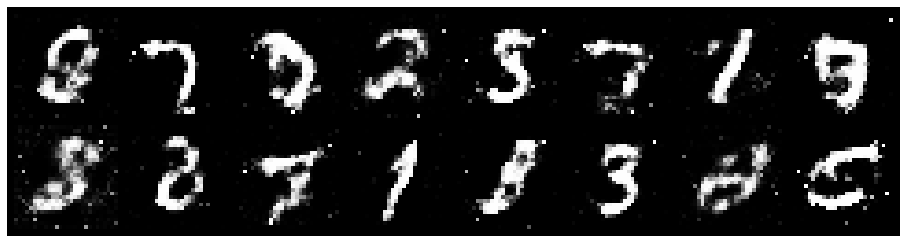

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.3426, Generator Loss: 2.0197
D(x): 0.5163, D(G(z)): 0.4018
gen_epochs:1 ,dis_epochs:1


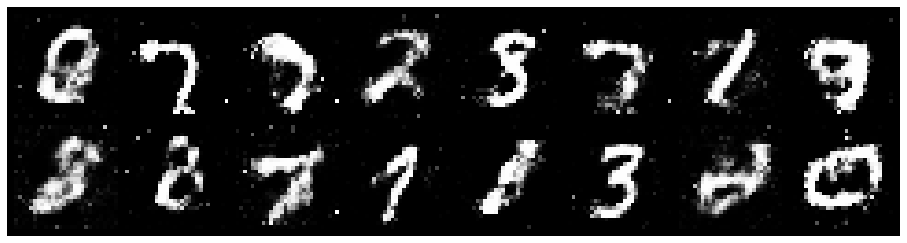

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.0364, Generator Loss: 2.2968
D(x): 0.7052, D(G(z)): 0.4163
gen_epochs:1 ,dis_epochs:1


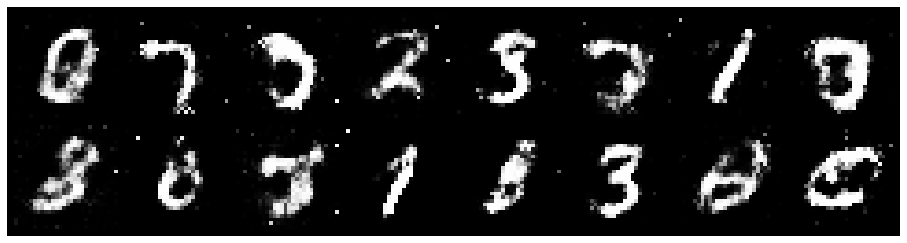

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.1025, Generator Loss: 2.0674
D(x): 0.6471, D(G(z)): 0.4526
gen_epochs:1 ,dis_epochs:1


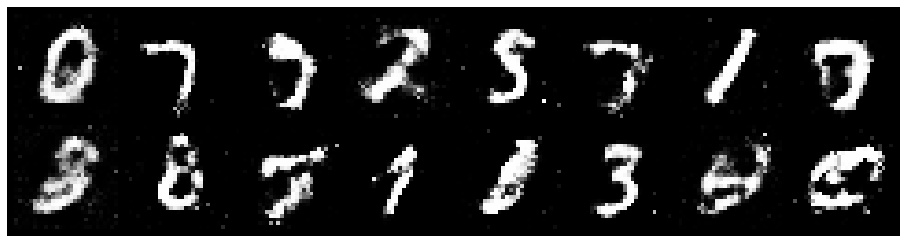

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.1798, Generator Loss: 2.4502
D(x): 0.6405, D(G(z)): 0.4311
gen_epochs:1 ,dis_epochs:1


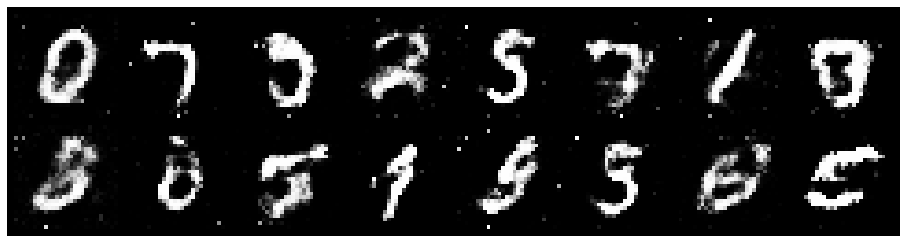

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.1533, Generator Loss: 2.2343
D(x): 0.6277, D(G(z)): 0.4138
gen_epochs:1 ,dis_epochs:1


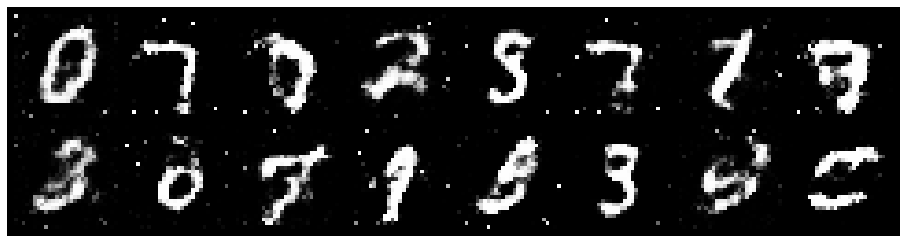

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.1649, Generator Loss: 2.8342
D(x): 0.6148, D(G(z)): 0.3560
gen_epochs:1 ,dis_epochs:1


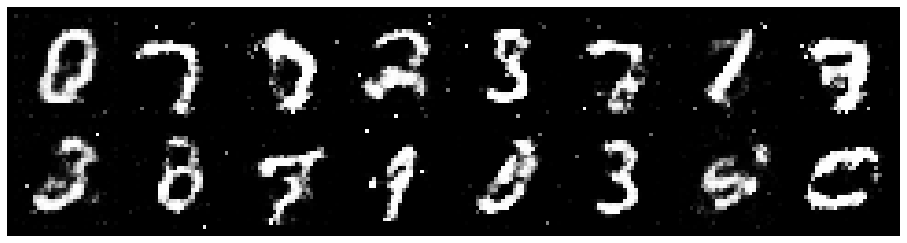

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.1742, Generator Loss: 2.5698
D(x): 0.6291, D(G(z)): 0.4029
gen_epochs:1 ,dis_epochs:1


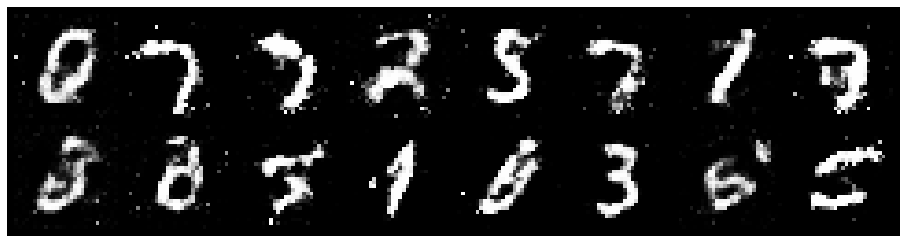

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1519, Generator Loss: 2.3564
D(x): 0.5941, D(G(z)): 0.3502
gen_epochs:1 ,dis_epochs:1


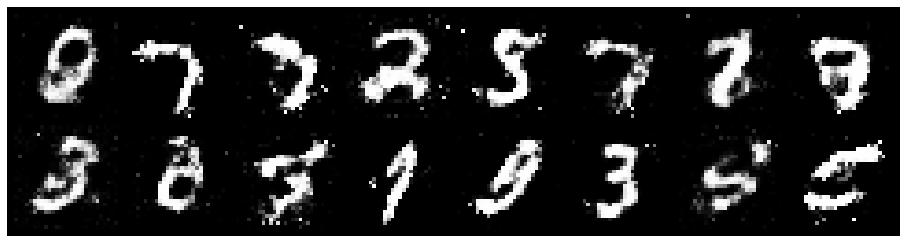

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.1195, Generator Loss: 2.6138
D(x): 0.6047, D(G(z)): 0.3399
gen_epochs:1 ,dis_epochs:1


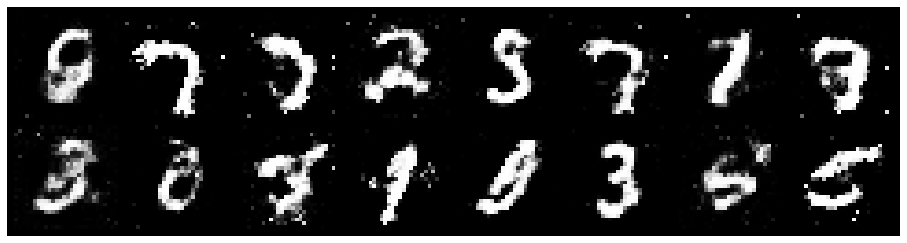

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.2442, Generator Loss: 2.4925
D(x): 0.6502, D(G(z)): 0.4416
gen_epochs:1 ,dis_epochs:1


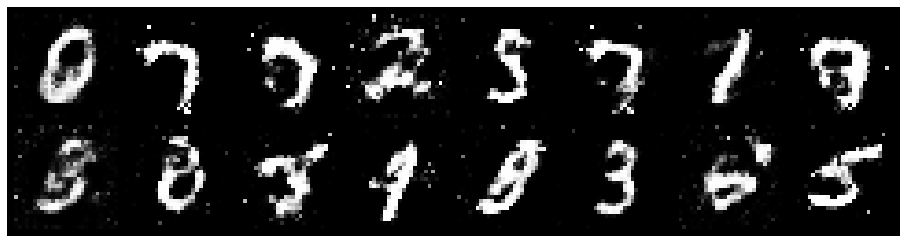

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.2438, Generator Loss: 2.2644
D(x): 0.6134, D(G(z)): 0.4330
gen_epochs:1 ,dis_epochs:1


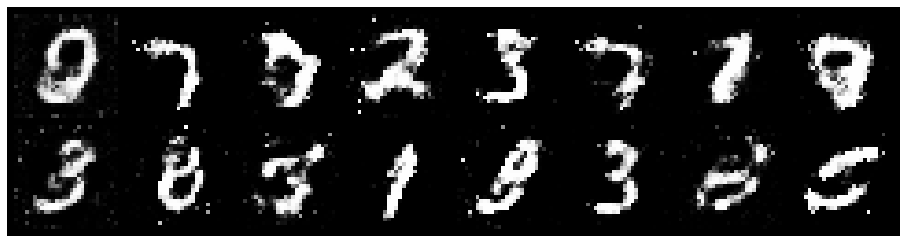

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.2071, Generator Loss: 1.9563
D(x): 0.5650, D(G(z)): 0.4095
gen_epochs:1 ,dis_epochs:1


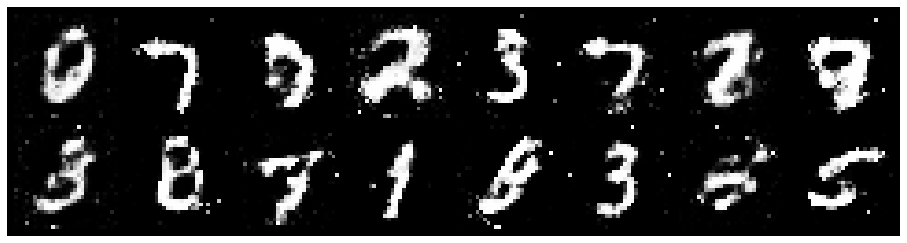

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.2522, Generator Loss: 2.1087
D(x): 0.5920, D(G(z)): 0.4387
gen_epochs:1 ,dis_epochs:1


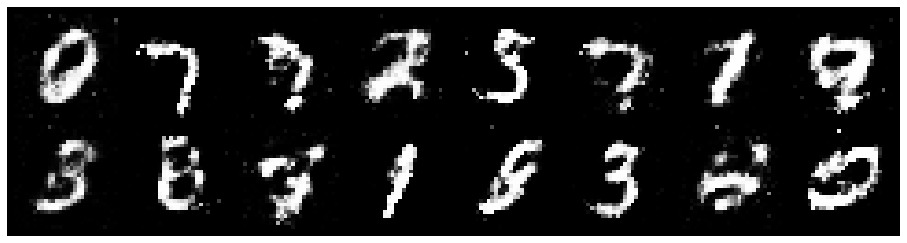

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.3379, Generator Loss: 2.0242
D(x): 0.5723, D(G(z)): 0.4614
gen_epochs:1 ,dis_epochs:1


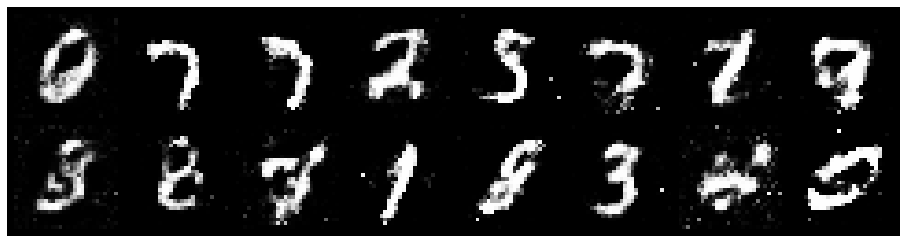

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.2289, Generator Loss: 2.0894
D(x): 0.5854, D(G(z)): 0.4289
gen_epochs:1 ,dis_epochs:1


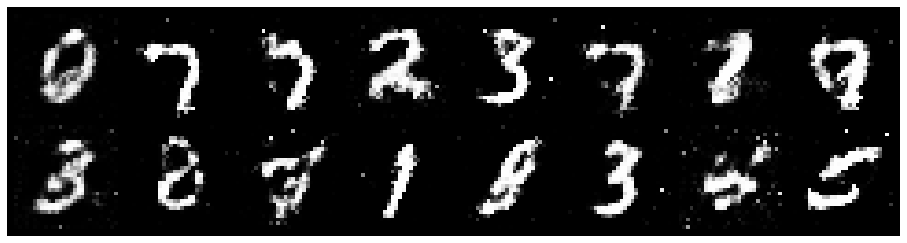

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1547, Generator Loss: 2.8672
D(x): 0.6815, D(G(z)): 0.4345
gen_epochs:1 ,dis_epochs:1


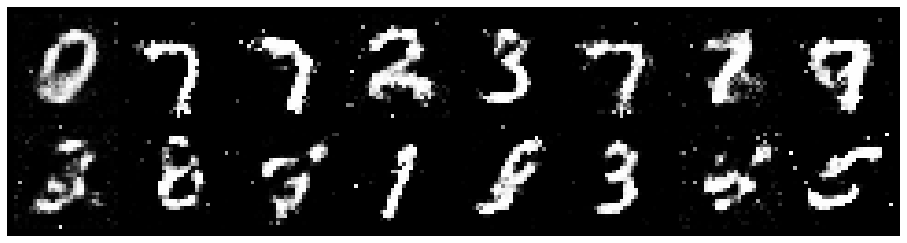

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.3170, Generator Loss: 2.1850
D(x): 0.5614, D(G(z)): 0.4205
gen_epochs:1 ,dis_epochs:1


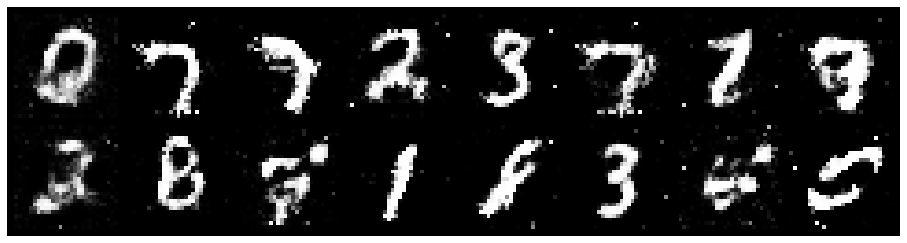

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.2110, Generator Loss: 2.3344
D(x): 0.6046, D(G(z)): 0.4126
gen_epochs:1 ,dis_epochs:1


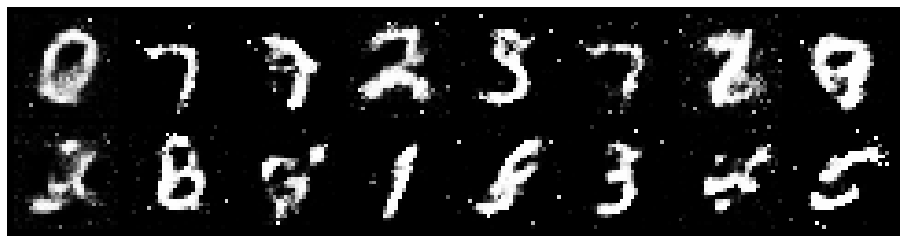

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 0.9710, Generator Loss: 2.6477
D(x): 0.7037, D(G(z)): 0.3885
gen_epochs:1 ,dis_epochs:1


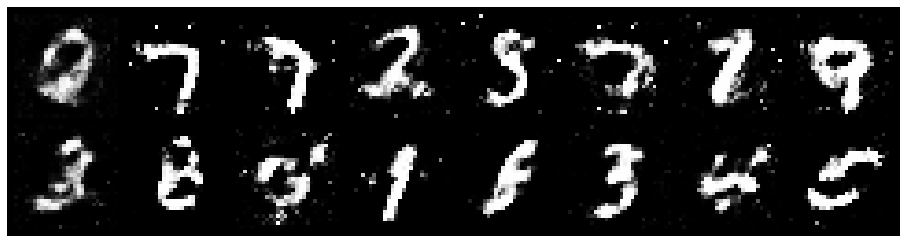

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2374, Generator Loss: 1.9409
D(x): 0.5620, D(G(z)): 0.4240
gen_epochs:1 ,dis_epochs:1


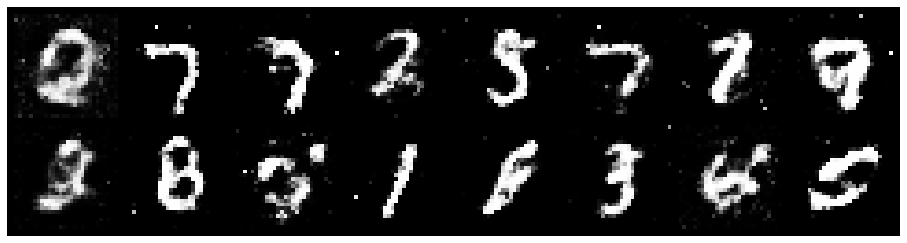

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.1343, Generator Loss: 2.1406
D(x): 0.5636, D(G(z)): 0.3649
gen_epochs:1 ,dis_epochs:1


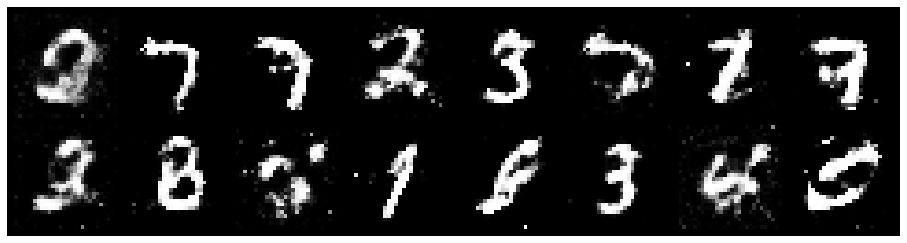

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.2403, Generator Loss: 2.0497
D(x): 0.6144, D(G(z)): 0.4672
gen_epochs:1 ,dis_epochs:1


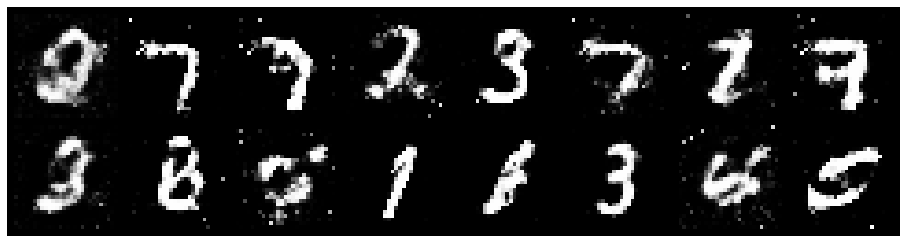

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.2397, Generator Loss: 2.0818
D(x): 0.5615, D(G(z)): 0.4183
gen_epochs:1 ,dis_epochs:1


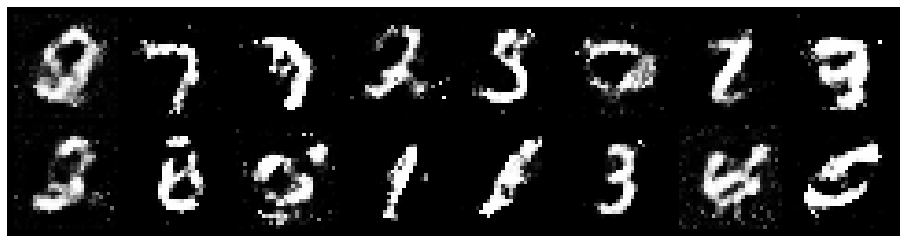

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.1039, Generator Loss: 2.2882
D(x): 0.6392, D(G(z)): 0.3990
gen_epochs:1 ,dis_epochs:1


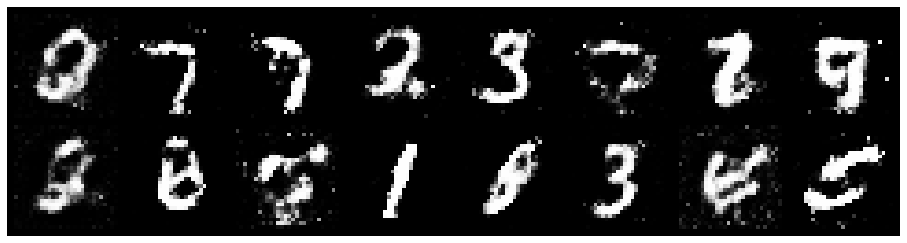

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.0512, Generator Loss: 2.7527
D(x): 0.6565, D(G(z)): 0.3822
gen_epochs:1 ,dis_epochs:1


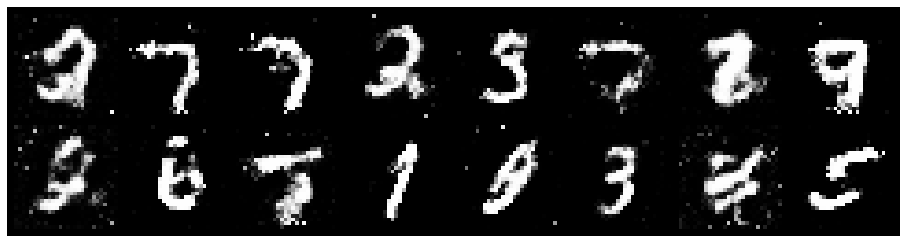

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.1403, Generator Loss: 2.5148
D(x): 0.6059, D(G(z)): 0.3860
gen_epochs:1 ,dis_epochs:1


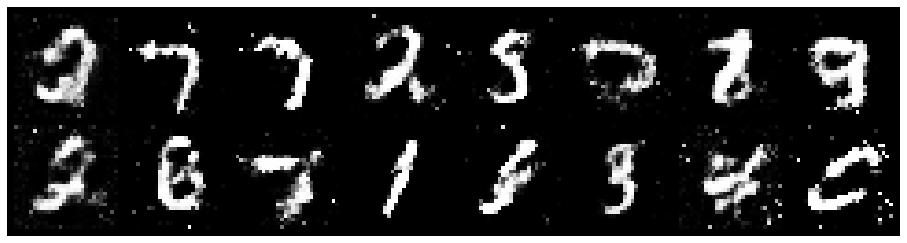

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.2642, Generator Loss: 1.9428
D(x): 0.5345, D(G(z)): 0.4213
gen_epochs:1 ,dis_epochs:1


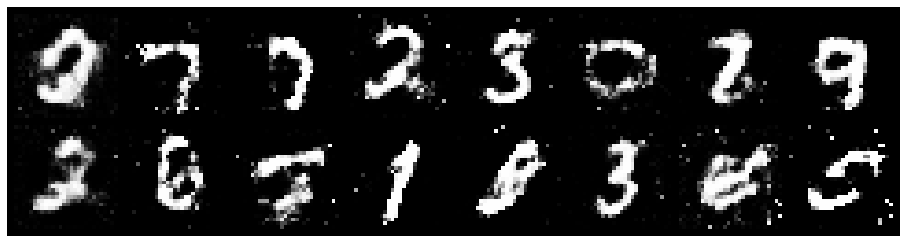

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.1956, Generator Loss: 1.9373
D(x): 0.5744, D(G(z)): 0.4153
gen_epochs:1 ,dis_epochs:1


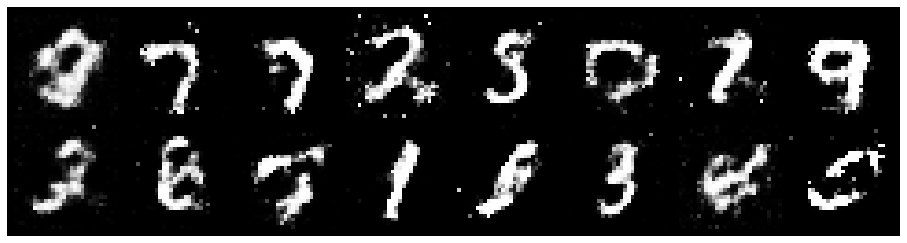

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.0783, Generator Loss: 2.1909
D(x): 0.6199, D(G(z)): 0.3853
gen_epochs:1 ,dis_epochs:1


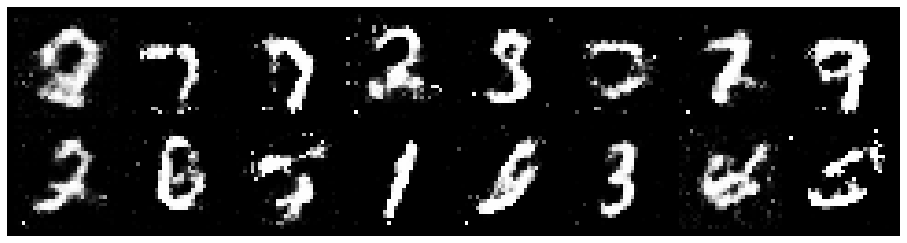

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.0957, Generator Loss: 2.2326
D(x): 0.6312, D(G(z)): 0.4045
gen_epochs:1 ,dis_epochs:1


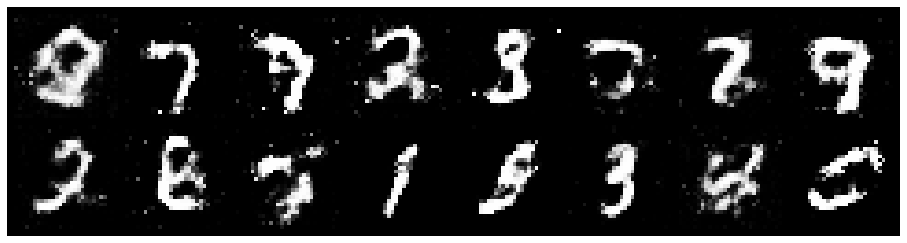

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.1658, Generator Loss: 2.0524
D(x): 0.5338, D(G(z)): 0.3538
gen_epochs:1 ,dis_epochs:1


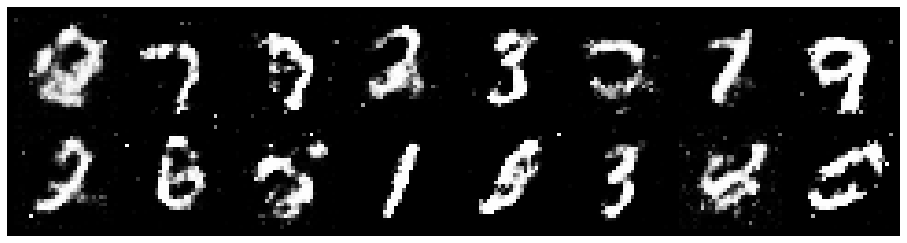

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.1770, Generator Loss: 2.2370
D(x): 0.5658, D(G(z)): 0.3726
gen_epochs:1 ,dis_epochs:1


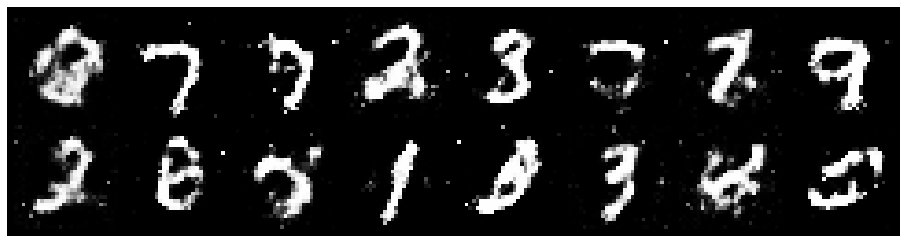

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.1106, Generator Loss: 2.4132
D(x): 0.5917, D(G(z)): 0.3776
gen_epochs:1 ,dis_epochs:1


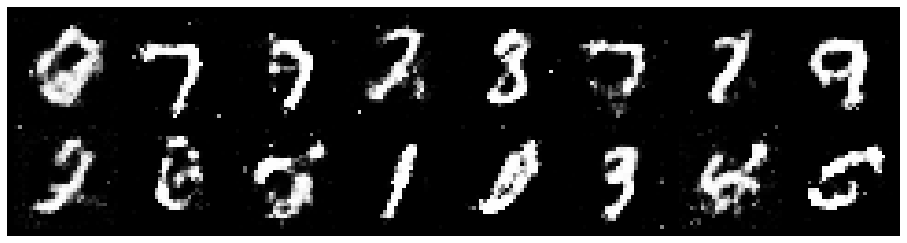

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.1513, Generator Loss: 2.4654
D(x): 0.5936, D(G(z)): 0.3826
gen_epochs:1 ,dis_epochs:1


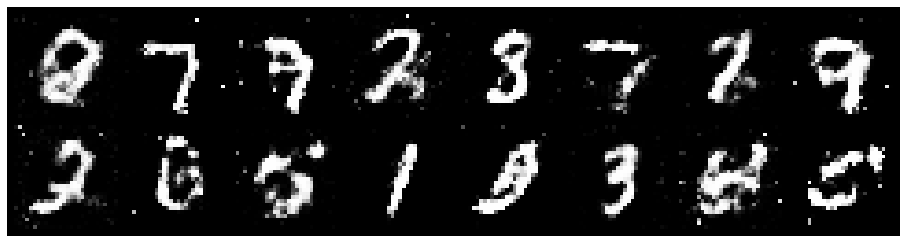

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.1914, Generator Loss: 2.3089
D(x): 0.6363, D(G(z)): 0.4420
gen_epochs:1 ,dis_epochs:1


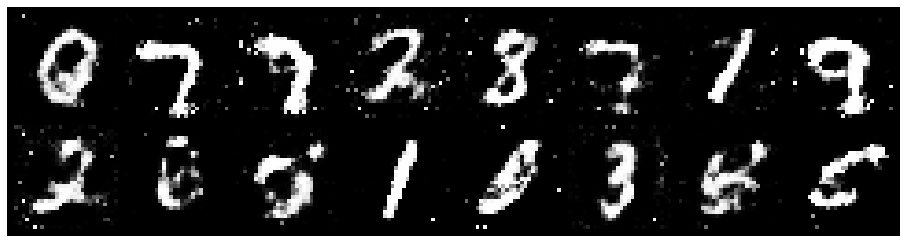

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.1749, Generator Loss: 2.6053
D(x): 0.6068, D(G(z)): 0.3411
gen_epochs:1 ,dis_epochs:1


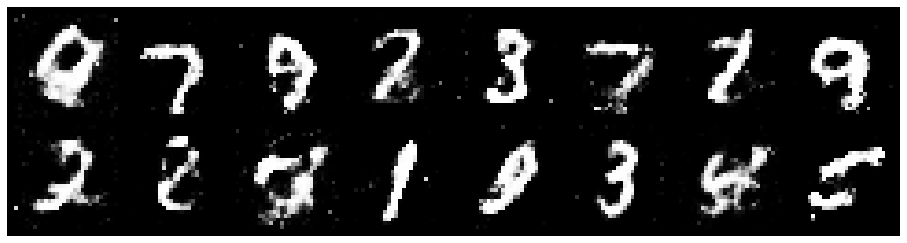

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1063, Generator Loss: 2.4944
D(x): 0.6460, D(G(z)): 0.3850
gen_epochs:1 ,dis_epochs:1


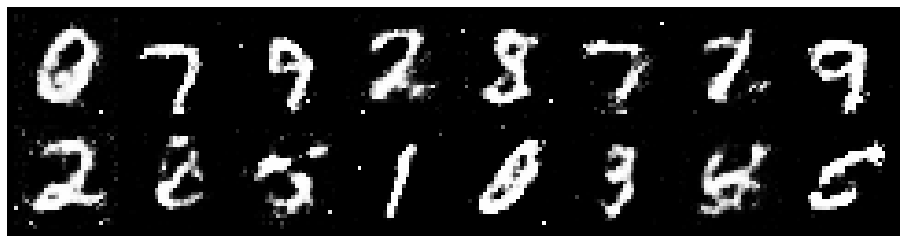

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.0786, Generator Loss: 2.4097
D(x): 0.5965, D(G(z)): 0.3435
gen_epochs:1 ,dis_epochs:1


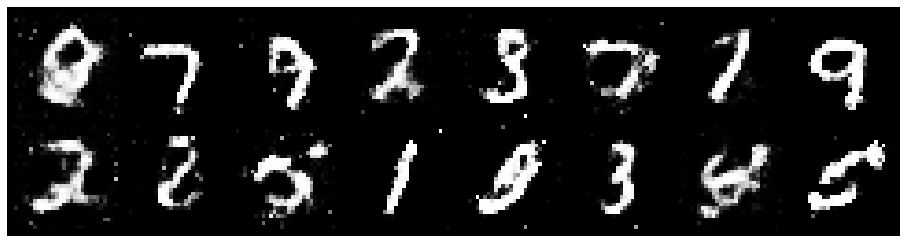

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.2559, Generator Loss: 2.1354
D(x): 0.5696, D(G(z)): 0.4098
gen_epochs:1 ,dis_epochs:1


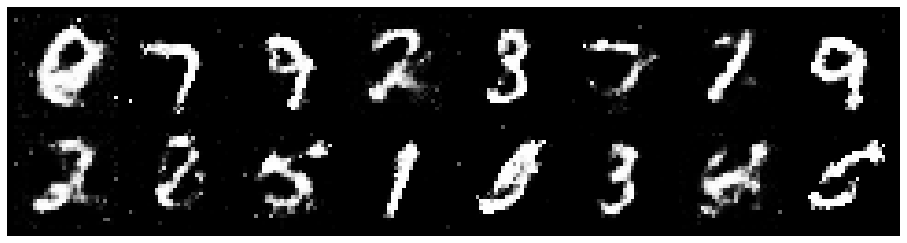

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.1265, Generator Loss: 2.1669
D(x): 0.6202, D(G(z)): 0.4212
gen_epochs:1 ,dis_epochs:1


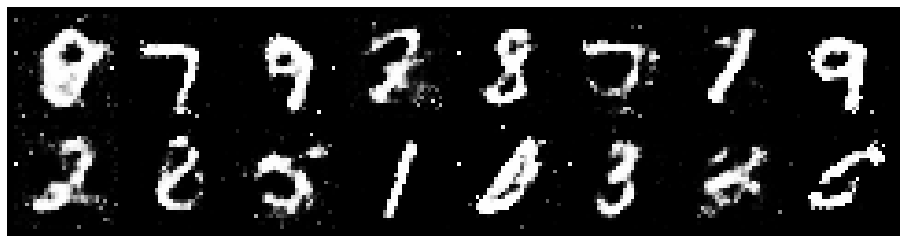

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.1717, Generator Loss: 1.9560
D(x): 0.5836, D(G(z)): 0.4156
gen_epochs:1 ,dis_epochs:1


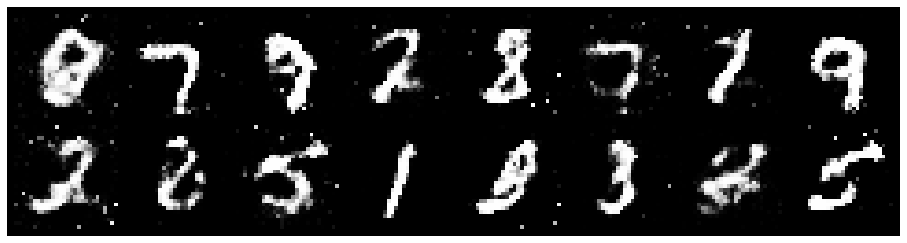

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.0449, Generator Loss: 2.6304
D(x): 0.6264, D(G(z)): 0.3700
gen_epochs:1 ,dis_epochs:1


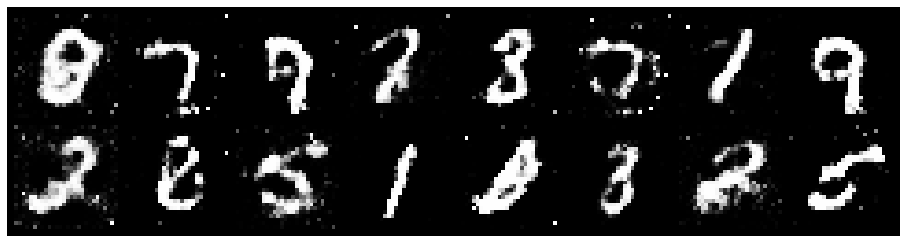

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.0993, Generator Loss: 2.2980
D(x): 0.6213, D(G(z)): 0.3973
gen_epochs:1 ,dis_epochs:1


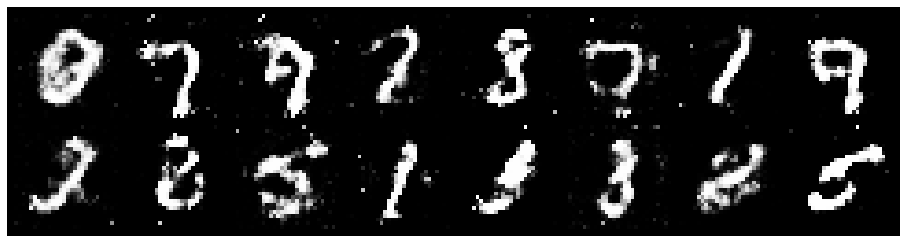

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.0645, Generator Loss: 2.2306
D(x): 0.6534, D(G(z)): 0.4119
gen_epochs:1 ,dis_epochs:1


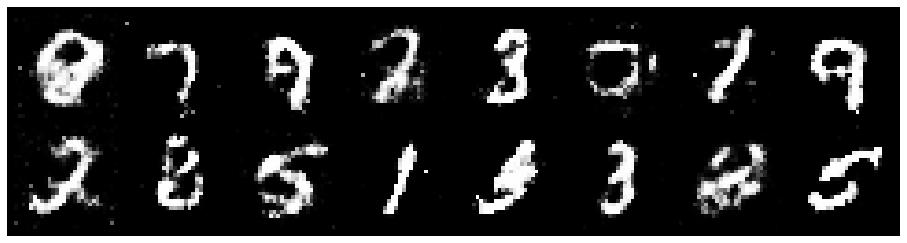

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.2116, Generator Loss: 2.2504
D(x): 0.6072, D(G(z)): 0.4439
gen_epochs:1 ,dis_epochs:1


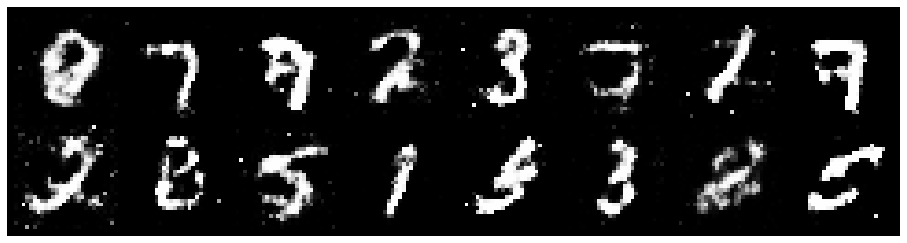

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.2560, Generator Loss: 1.8723
D(x): 0.5525, D(G(z)): 0.4170
gen_epochs:1 ,dis_epochs:1


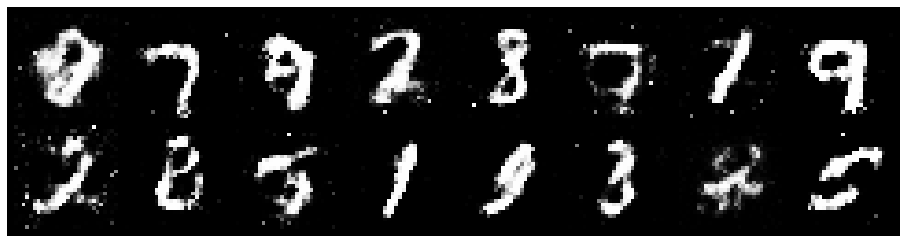

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.1385, Generator Loss: 2.2738
D(x): 0.5940, D(G(z)): 0.4008
gen_epochs:1 ,dis_epochs:1


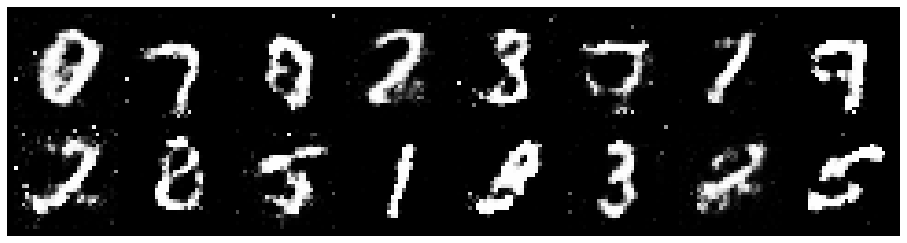

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.2512, Generator Loss: 1.9650
D(x): 0.5600, D(G(z)): 0.4484
gen_epochs:1 ,dis_epochs:1


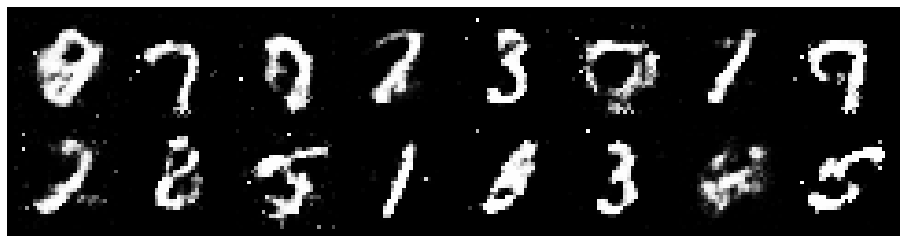

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.2582, Generator Loss: 2.0626
D(x): 0.5911, D(G(z)): 0.4296
gen_epochs:1 ,dis_epochs:1


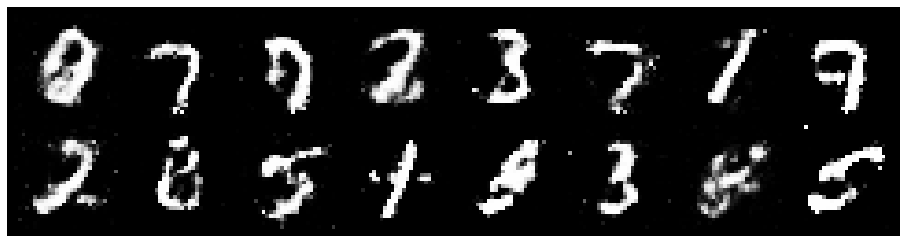

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.2068, Generator Loss: 2.0245
D(x): 0.5874, D(G(z)): 0.4148
gen_epochs:1 ,dis_epochs:1


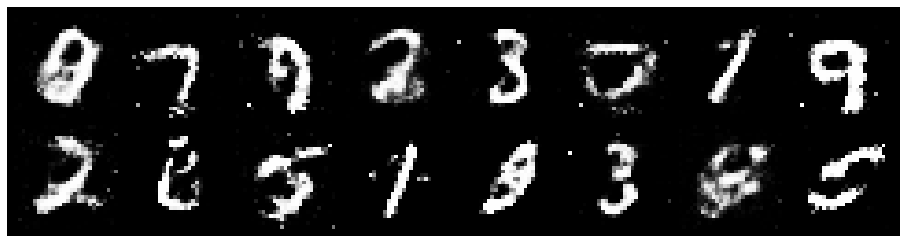

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.3575, Generator Loss: 1.8798
D(x): 0.5517, D(G(z)): 0.4692
gen_epochs:1 ,dis_epochs:1


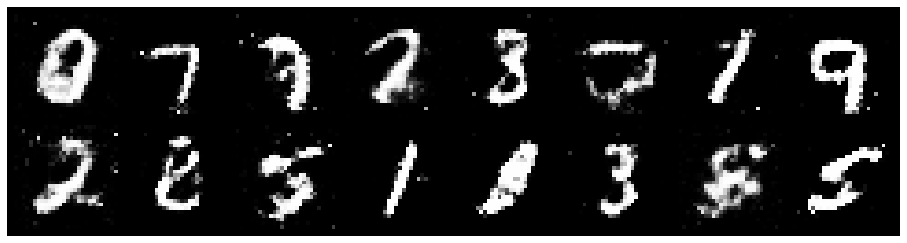

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.3325, Generator Loss: 1.7914
D(x): 0.5407, D(G(z)): 0.4566
gen_epochs:1 ,dis_epochs:1


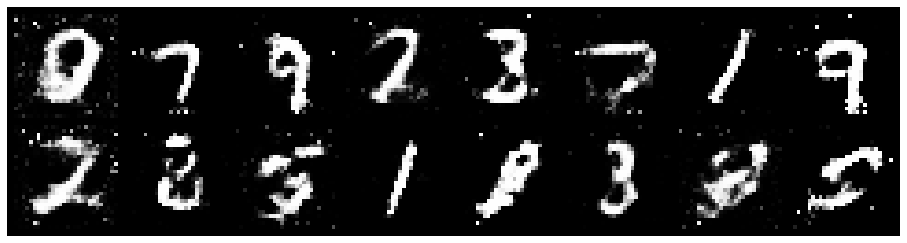

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.2108, Generator Loss: 2.1334
D(x): 0.5883, D(G(z)): 0.4195
gen_epochs:1 ,dis_epochs:1


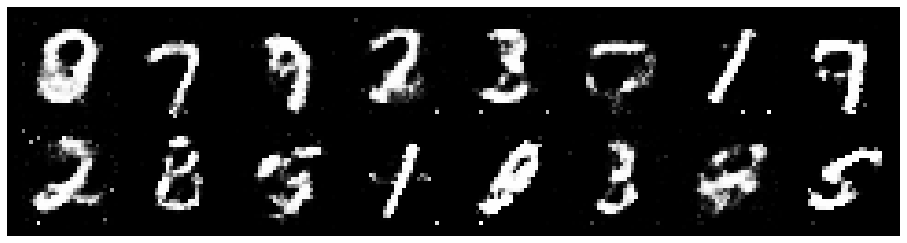

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2450, Generator Loss: 2.0824
D(x): 0.5530, D(G(z)): 0.4105
gen_epochs:1 ,dis_epochs:1


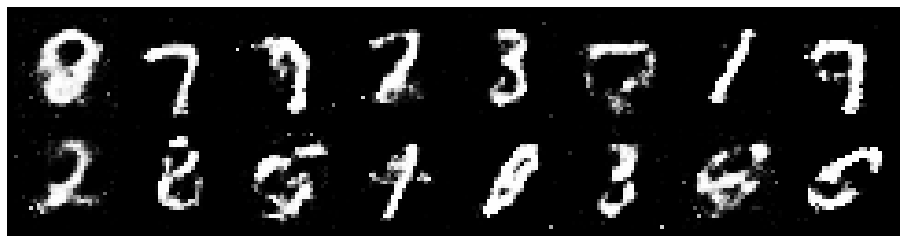

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.3997, Generator Loss: 1.6790
D(x): 0.5684, D(G(z)): 0.5177
gen_epochs:1 ,dis_epochs:1


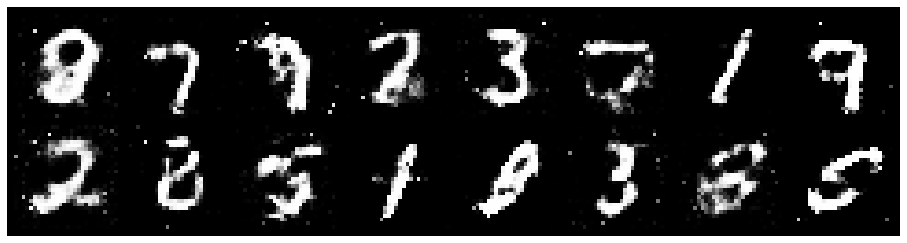

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.2729, Generator Loss: 2.4676
D(x): 0.5888, D(G(z)): 0.4173
gen_epochs:1 ,dis_epochs:1


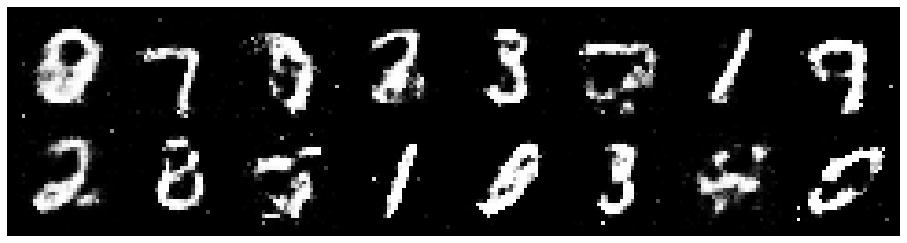

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.2307, Generator Loss: 1.9368
D(x): 0.5592, D(G(z)): 0.3995
gen_epochs:1 ,dis_epochs:1


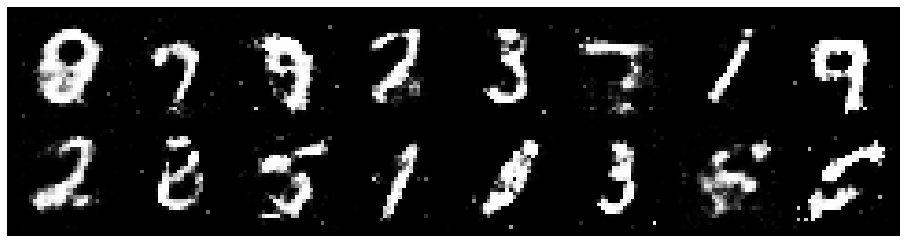

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.2708, Generator Loss: 1.9724
D(x): 0.6050, D(G(z)): 0.4755
gen_epochs:1 ,dis_epochs:1


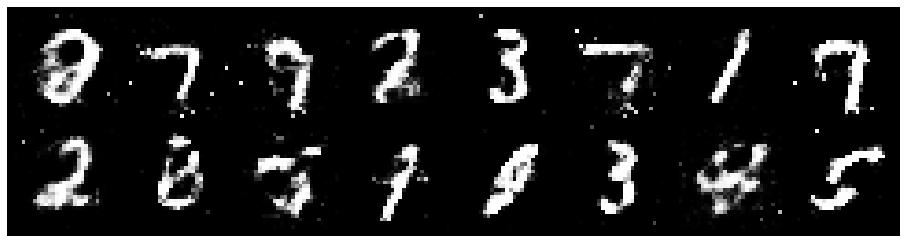

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.2100, Generator Loss: 2.0188
D(x): 0.5892, D(G(z)): 0.4272
gen_epochs:1 ,dis_epochs:1


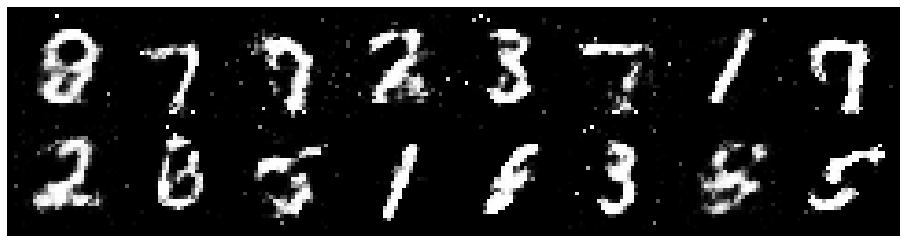

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.1916, Generator Loss: 2.0490
D(x): 0.5593, D(G(z)): 0.3953
gen_epochs:1 ,dis_epochs:1


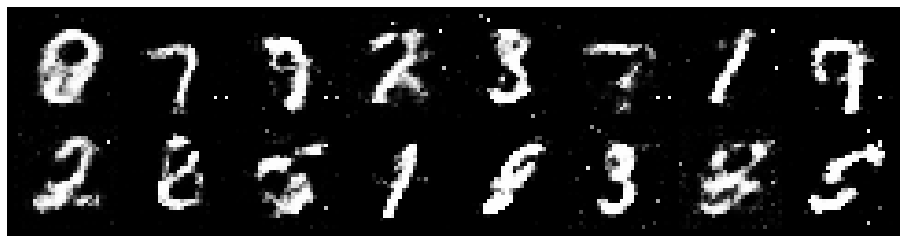

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.2142, Generator Loss: 2.2209
D(x): 0.6215, D(G(z)): 0.4482
gen_epochs:1 ,dis_epochs:1


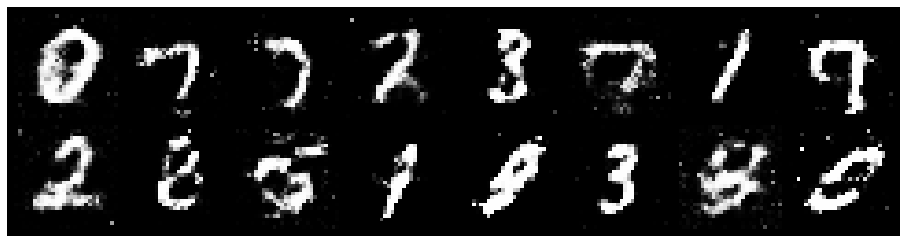

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.1532, Generator Loss: 2.1473
D(x): 0.6055, D(G(z)): 0.3872
gen_epochs:1 ,dis_epochs:1


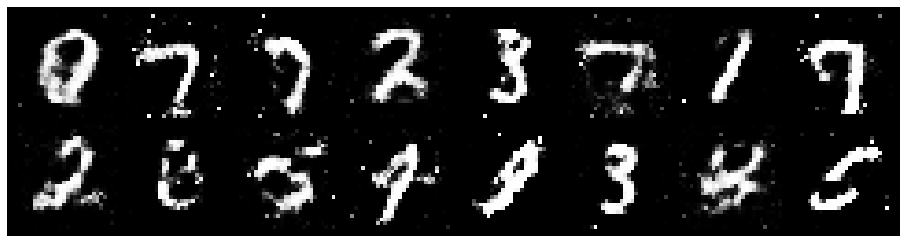

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.1729, Generator Loss: 2.1659
D(x): 0.6209, D(G(z)): 0.4400
gen_epochs:1 ,dis_epochs:1


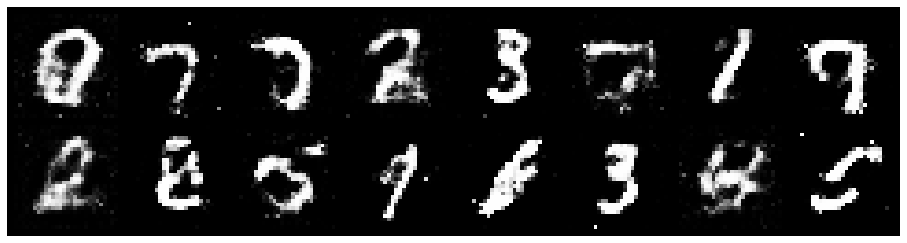

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.1517, Generator Loss: 2.0938
D(x): 0.5700, D(G(z)): 0.3786
gen_epochs:1 ,dis_epochs:1


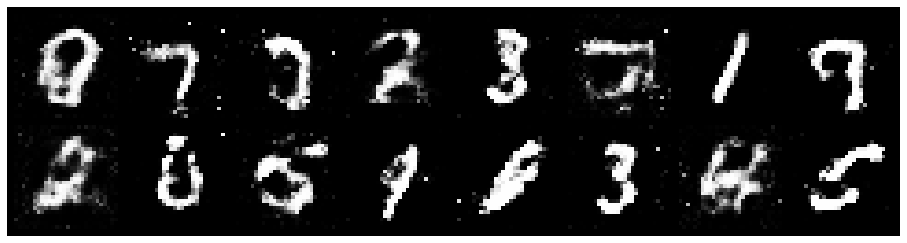

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.3474, Generator Loss: 1.7901
D(x): 0.5932, D(G(z)): 0.5131
gen_epochs:1 ,dis_epochs:1


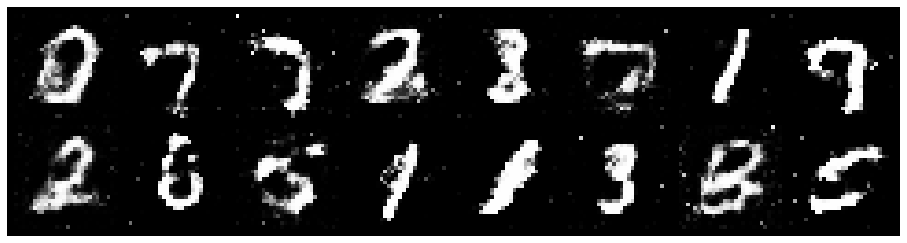

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.3777, Generator Loss: 1.8542
D(x): 0.5775, D(G(z)): 0.5032
gen_epochs:1 ,dis_epochs:1


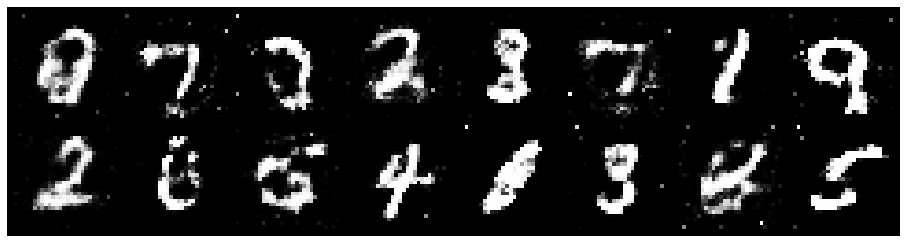

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.1765, Generator Loss: 2.1414
D(x): 0.5815, D(G(z)): 0.4142
gen_epochs:1 ,dis_epochs:1


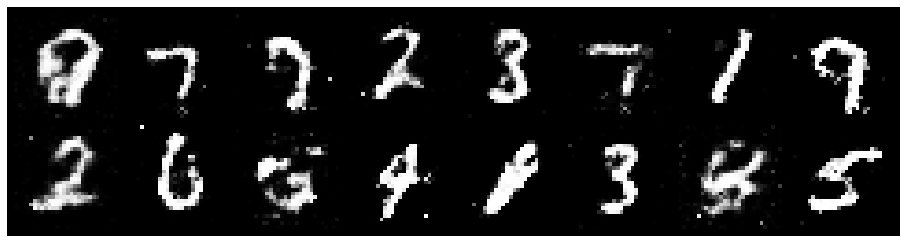

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.1885, Generator Loss: 1.8595
D(x): 0.5434, D(G(z)): 0.3920
gen_epochs:1 ,dis_epochs:1


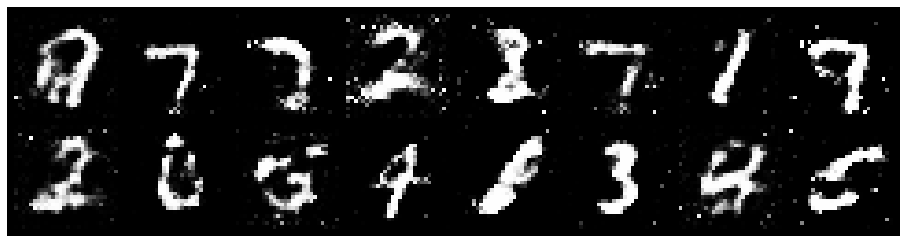

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.2746, Generator Loss: 2.0606
D(x): 0.5156, D(G(z)): 0.3717
gen_epochs:1 ,dis_epochs:1


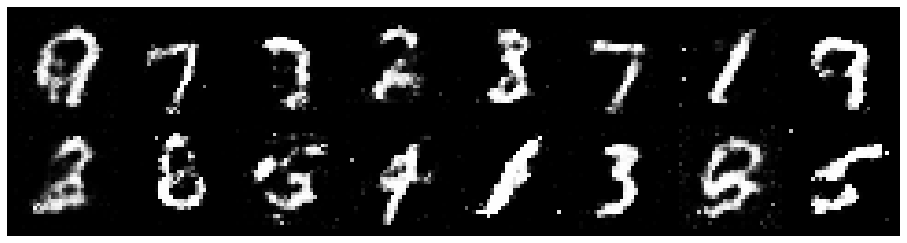

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.0925, Generator Loss: 2.0071
D(x): 0.6034, D(G(z)): 0.4037
gen_epochs:1 ,dis_epochs:1


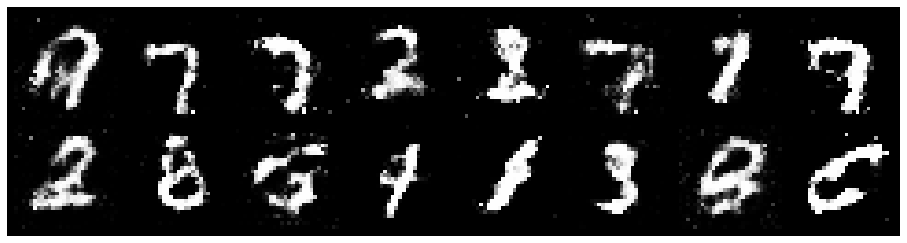

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.2308, Generator Loss: 2.0520
D(x): 0.5813, D(G(z)): 0.4382
gen_epochs:1 ,dis_epochs:1


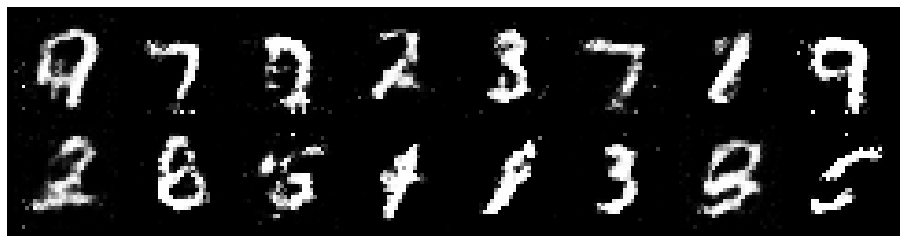

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.0358, Generator Loss: 2.4349
D(x): 0.6532, D(G(z)): 0.3722
gen_epochs:1 ,dis_epochs:1


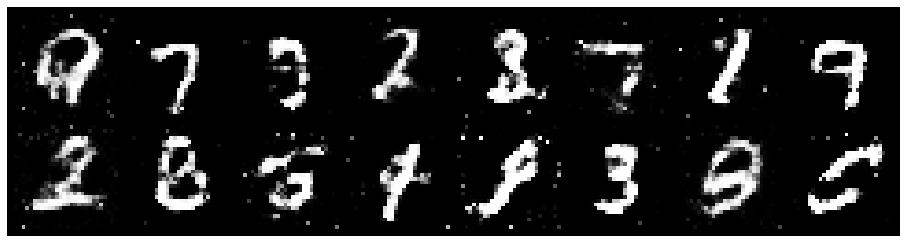

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.2697, Generator Loss: 1.9778
D(x): 0.5863, D(G(z)): 0.4480
gen_epochs:1 ,dis_epochs:1


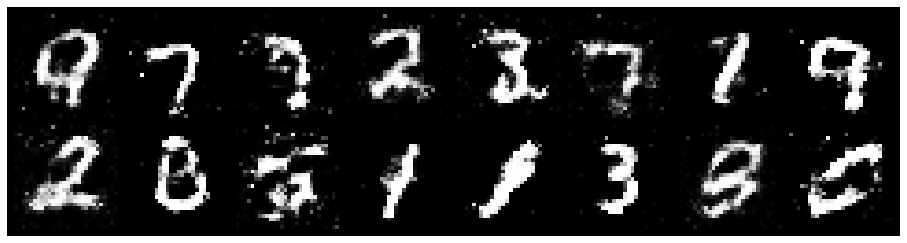

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.3885, Generator Loss: 1.9182
D(x): 0.5941, D(G(z)): 0.4983
gen_epochs:1 ,dis_epochs:1


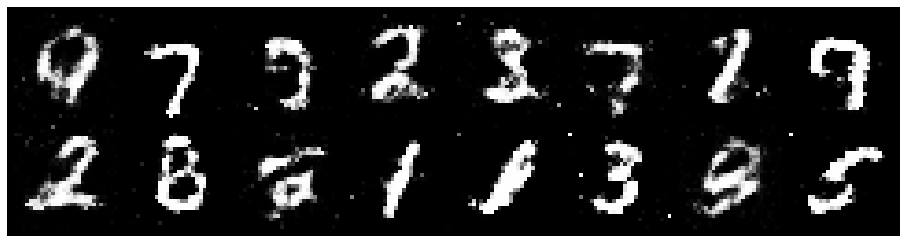

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.2712, Generator Loss: 1.8289
D(x): 0.5832, D(G(z)): 0.4606
gen_epochs:1 ,dis_epochs:1


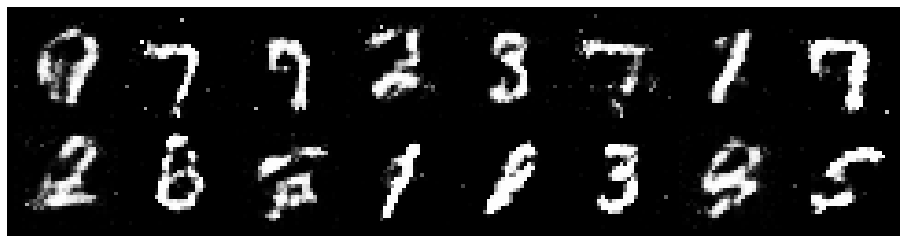

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.3576, Generator Loss: 2.1177
D(x): 0.5862, D(G(z)): 0.4585
gen_epochs:1 ,dis_epochs:1


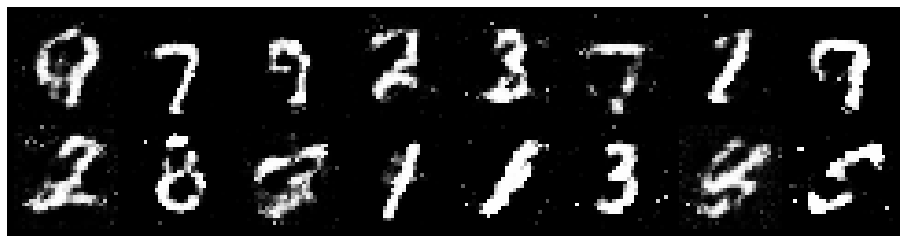

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.2063, Generator Loss: 1.9919
D(x): 0.5554, D(G(z)): 0.3997
gen_epochs:1 ,dis_epochs:1


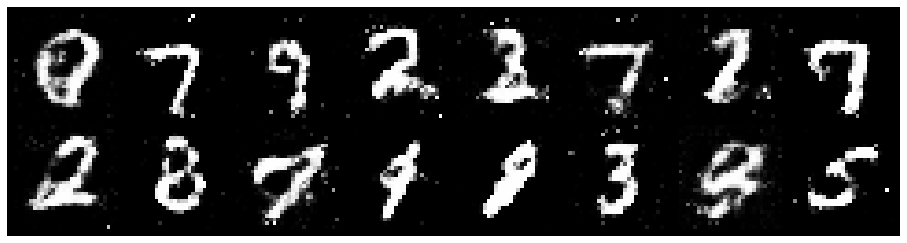

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.3999, Generator Loss: 2.1842
D(x): 0.5111, D(G(z)): 0.3795
gen_epochs:1 ,dis_epochs:1


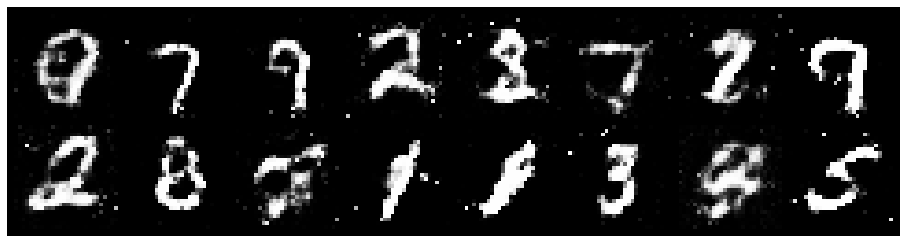

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.2656, Generator Loss: 2.1774
D(x): 0.6023, D(G(z)): 0.4391
gen_epochs:1 ,dis_epochs:1


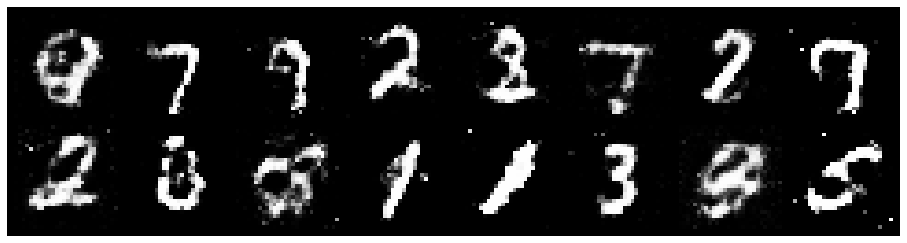

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.1316, Generator Loss: 2.1341
D(x): 0.5782, D(G(z)): 0.3609
gen_epochs:1 ,dis_epochs:1


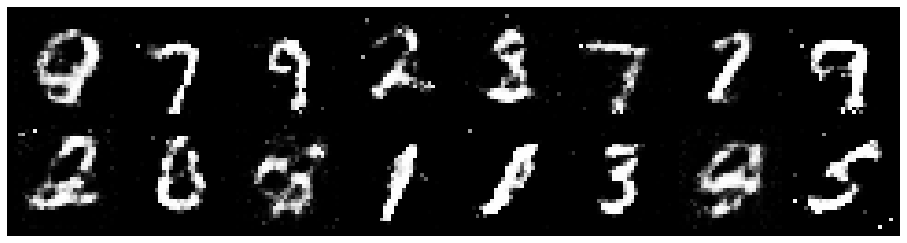

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.1247, Generator Loss: 2.1309
D(x): 0.6385, D(G(z)): 0.4228
gen_epochs:1 ,dis_epochs:1


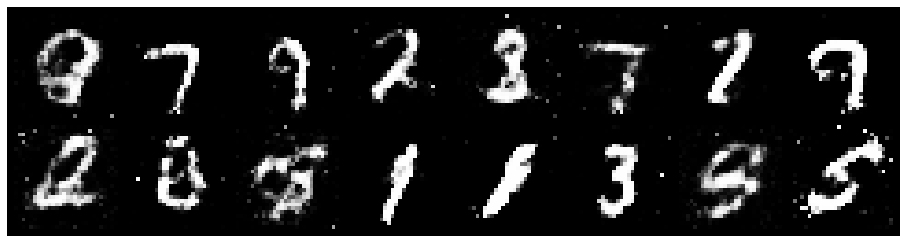

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.1847, Generator Loss: 2.3920
D(x): 0.5861, D(G(z)): 0.3773
gen_epochs:1 ,dis_epochs:1


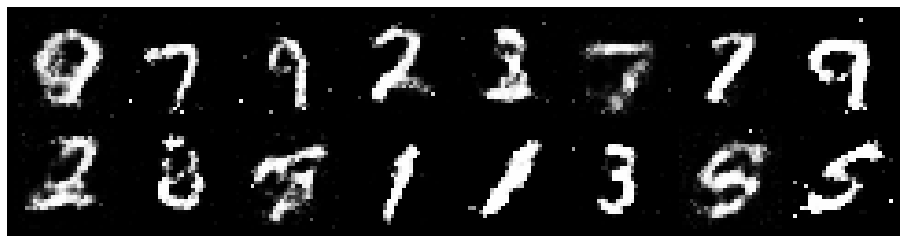

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.0722, Generator Loss: 2.2239
D(x): 0.6346, D(G(z)): 0.3953
gen_epochs:1 ,dis_epochs:1


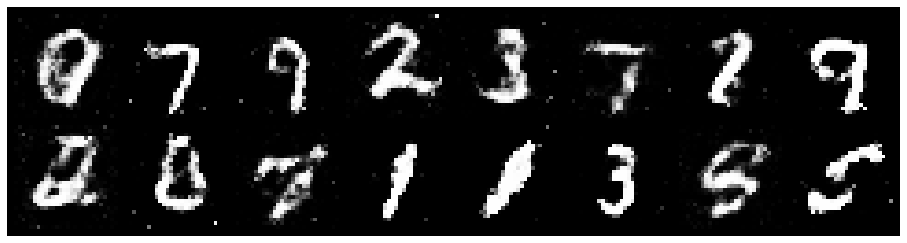

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.2127, Generator Loss: 2.0790
D(x): 0.6015, D(G(z)): 0.4289
gen_epochs:1 ,dis_epochs:1


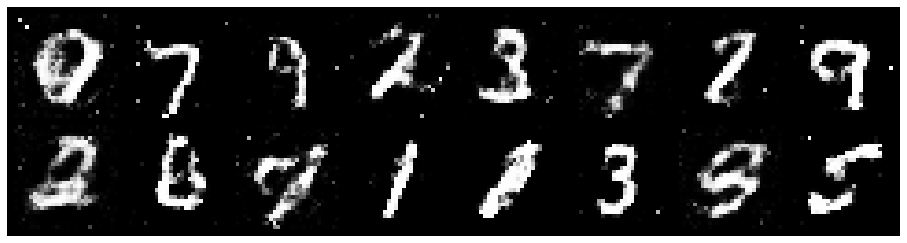

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.2918, Generator Loss: 2.3132
D(x): 0.5880, D(G(z)): 0.4124
gen_epochs:1 ,dis_epochs:1


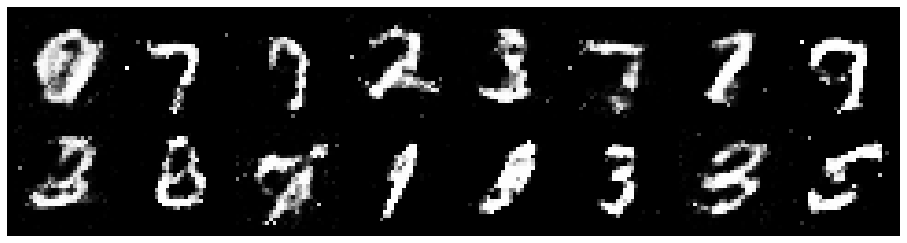

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.0978, Generator Loss: 2.1784
D(x): 0.5969, D(G(z)): 0.3706
gen_epochs:1 ,dis_epochs:1


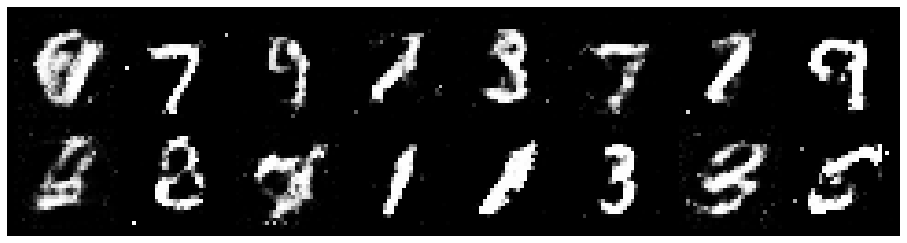

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.2053, Generator Loss: 1.9982
D(x): 0.5966, D(G(z)): 0.4400
gen_epochs:1 ,dis_epochs:1


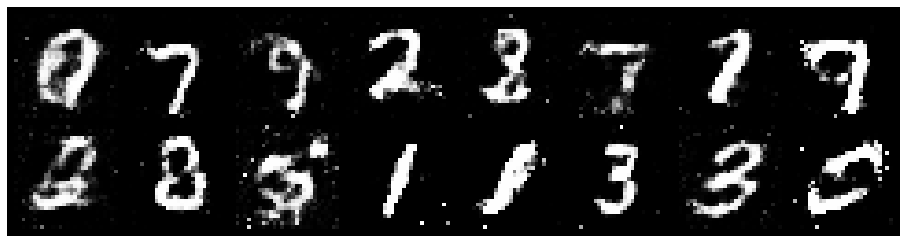

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.2692, Generator Loss: 1.8273
D(x): 0.5740, D(G(z)): 0.4605
gen_epochs:1 ,dis_epochs:1


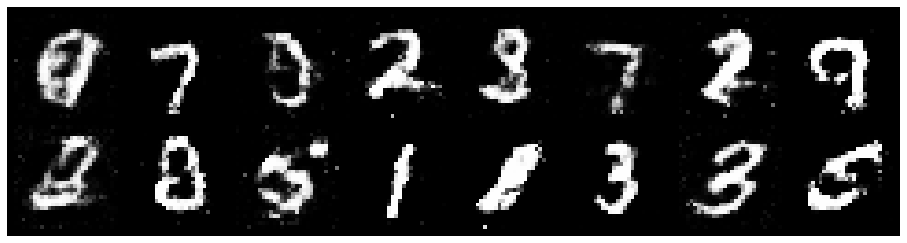

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.3021, Generator Loss: 1.8658
D(x): 0.5653, D(G(z)): 0.4582
gen_epochs:1 ,dis_epochs:1


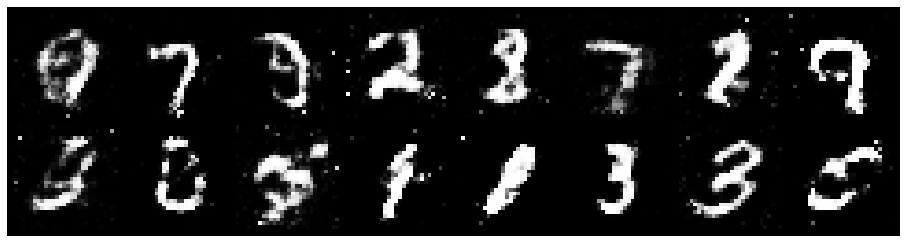

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.5158, Generator Loss: 2.1390
D(x): 0.5738, D(G(z)): 0.5259
gen_epochs:1 ,dis_epochs:1


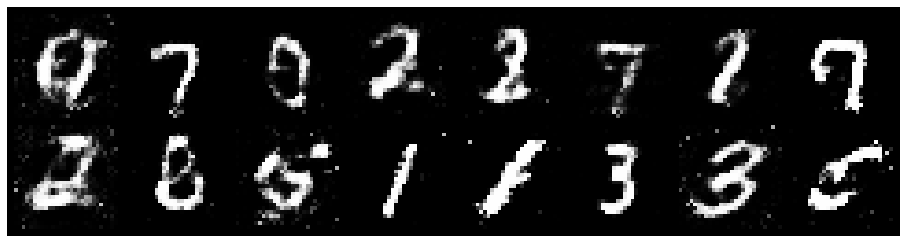

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.2175, Generator Loss: 2.1259
D(x): 0.6126, D(G(z)): 0.4337
gen_epochs:1 ,dis_epochs:1


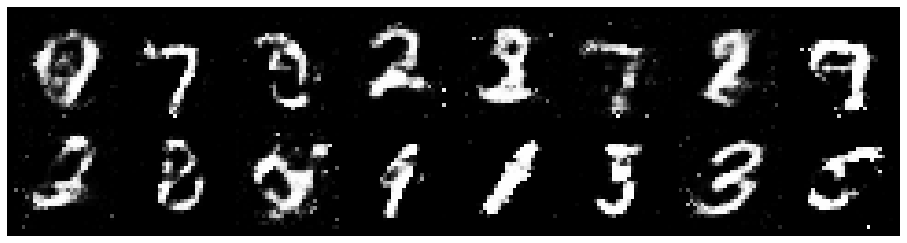

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.1682, Generator Loss: 2.1731
D(x): 0.5915, D(G(z)): 0.3895
gen_epochs:1 ,dis_epochs:1


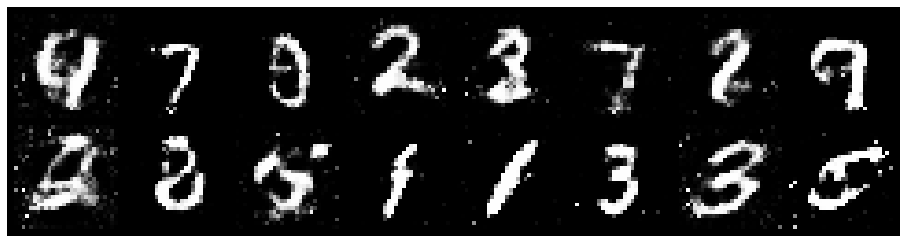

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.2488, Generator Loss: 1.9561
D(x): 0.5634, D(G(z)): 0.4261
gen_epochs:1 ,dis_epochs:1


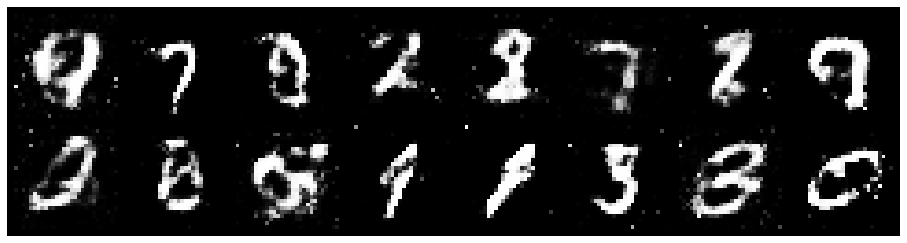

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.2353, Generator Loss: 1.8676
D(x): 0.6062, D(G(z)): 0.4509
gen_epochs:1 ,dis_epochs:1


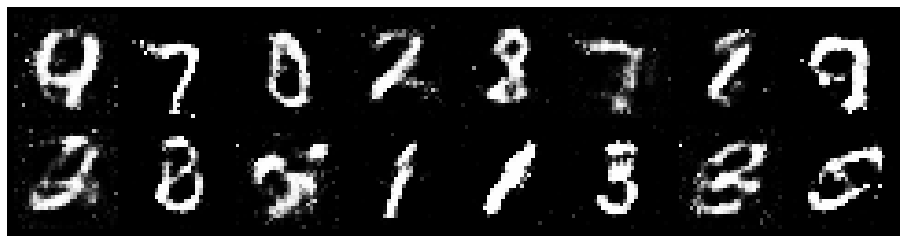

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.3049, Generator Loss: 1.9100
D(x): 0.5961, D(G(z)): 0.4868
gen_epochs:1 ,dis_epochs:1


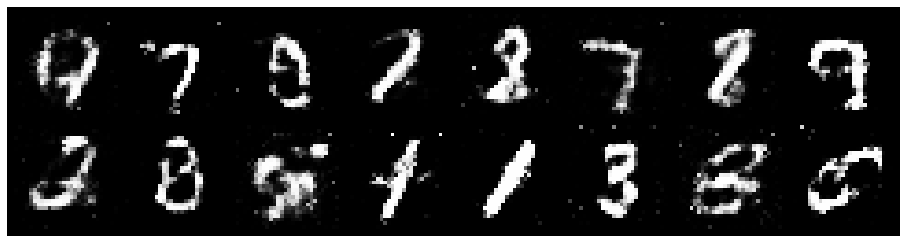

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.2866, Generator Loss: 1.7993
D(x): 0.5495, D(G(z)): 0.4549
gen_epochs:1 ,dis_epochs:1


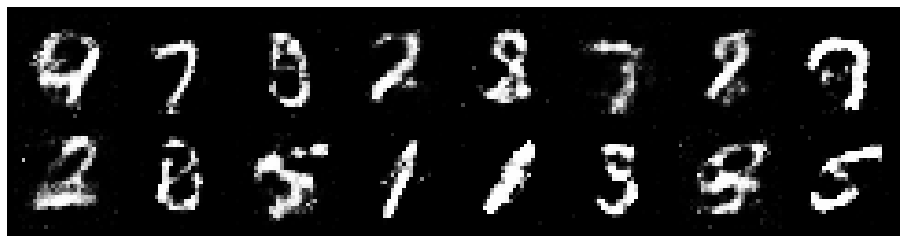

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.2085, Generator Loss: 1.9468
D(x): 0.5681, D(G(z)): 0.4388
gen_epochs:1 ,dis_epochs:1


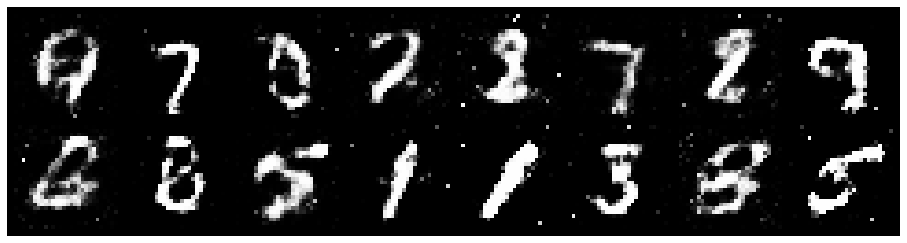

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.2298, Generator Loss: 1.8026
D(x): 0.5668, D(G(z)): 0.4356
gen_epochs:1 ,dis_epochs:1


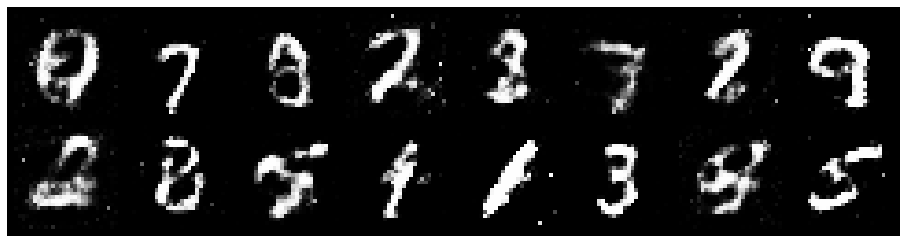

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.2980, Generator Loss: 1.9084
D(x): 0.5806, D(G(z)): 0.4623
gen_epochs:1 ,dis_epochs:1


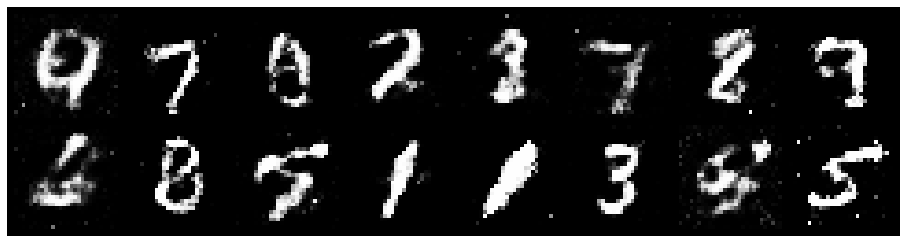

Epoch: [67/200], Batch Num: [500/600]
Discriminator Loss: 1.2198, Generator Loss: 2.0881
D(x): 0.5978, D(G(z)): 0.4534
gen_epochs:1 ,dis_epochs:1


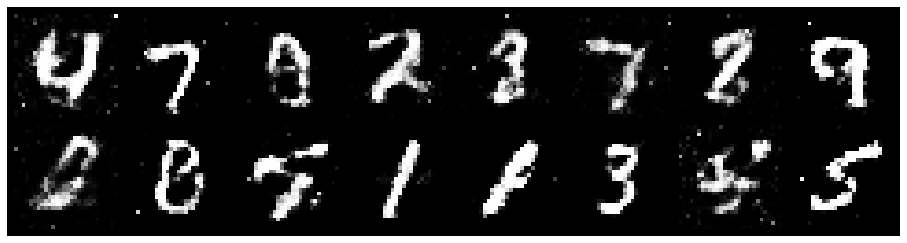

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.2636, Generator Loss: 1.8079
D(x): 0.6113, D(G(z)): 0.4883
gen_epochs:1 ,dis_epochs:1


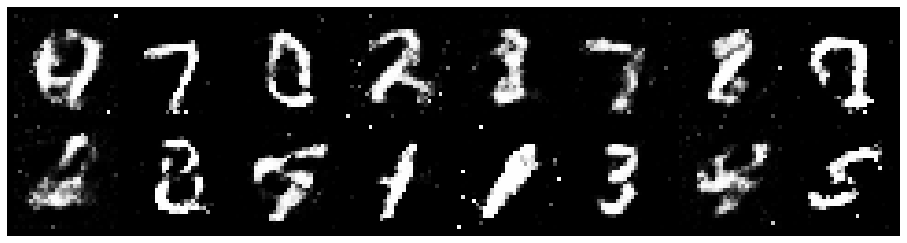

Epoch: [68/200], Batch Num: [100/600]
Discriminator Loss: 1.2289, Generator Loss: 2.0089
D(x): 0.5842, D(G(z)): 0.4193
gen_epochs:1 ,dis_epochs:1


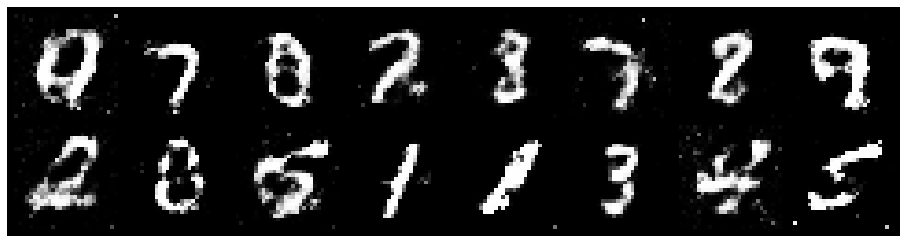

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.2335, Generator Loss: 2.0612
D(x): 0.6227, D(G(z)): 0.4609
gen_epochs:1 ,dis_epochs:1


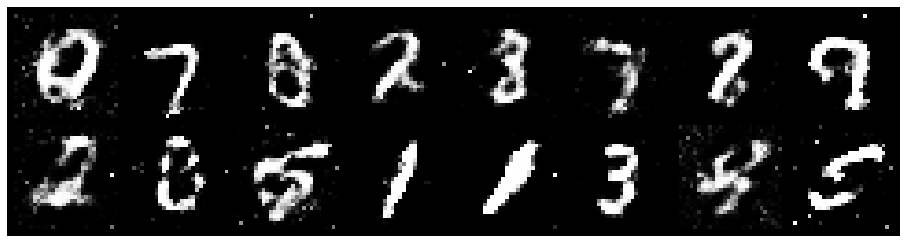

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.2403, Generator Loss: 2.2781
D(x): 0.5733, D(G(z)): 0.4160
gen_epochs:1 ,dis_epochs:1


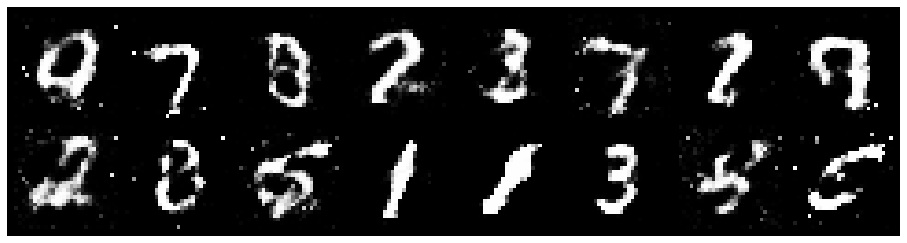

Epoch: [68/200], Batch Num: [400/600]
Discriminator Loss: 1.3031, Generator Loss: 2.0928
D(x): 0.5505, D(G(z)): 0.4203
gen_epochs:1 ,dis_epochs:1


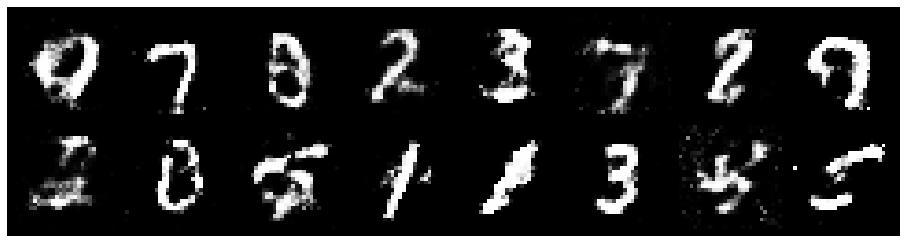

Epoch: [68/200], Batch Num: [500/600]
Discriminator Loss: 1.3134, Generator Loss: 2.0507
D(x): 0.6018, D(G(z)): 0.4391
gen_epochs:1 ,dis_epochs:1


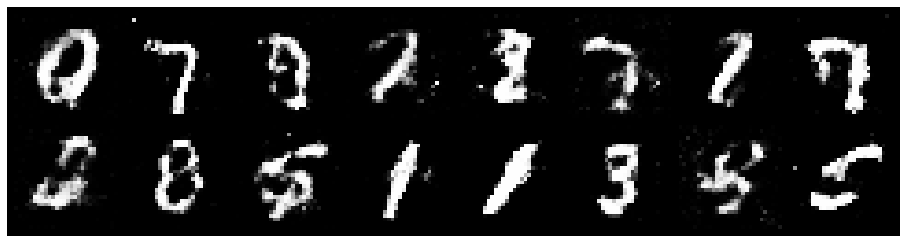

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.1731, Generator Loss: 2.1458
D(x): 0.6451, D(G(z)): 0.4363
gen_epochs:1 ,dis_epochs:1


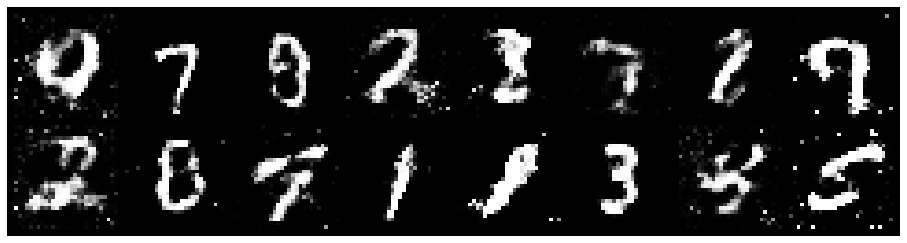

Epoch: [69/200], Batch Num: [100/600]
Discriminator Loss: 1.1030, Generator Loss: 2.1740
D(x): 0.6555, D(G(z)): 0.4263
gen_epochs:1 ,dis_epochs:1


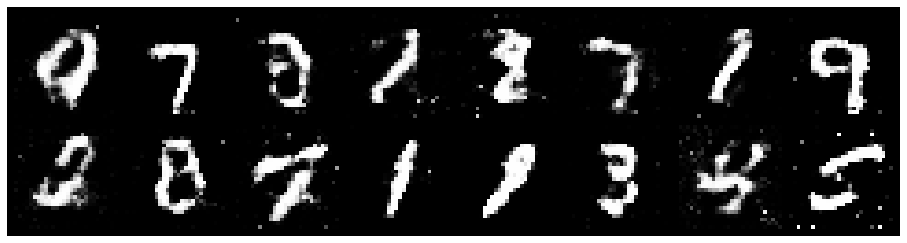

Epoch: [69/200], Batch Num: [200/600]
Discriminator Loss: 1.2072, Generator Loss: 2.2059
D(x): 0.6096, D(G(z)): 0.4192
gen_epochs:1 ,dis_epochs:1


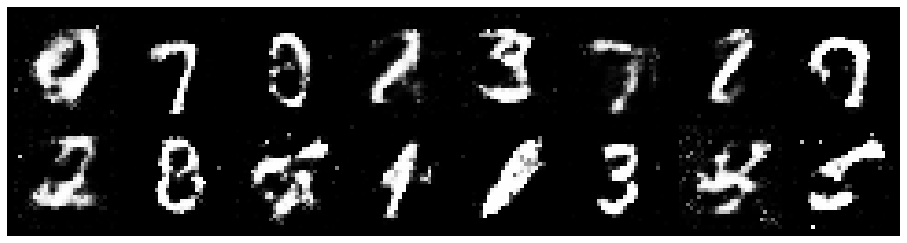

Epoch: [69/200], Batch Num: [300/600]
Discriminator Loss: 1.2444, Generator Loss: 2.0032
D(x): 0.5579, D(G(z)): 0.4134
gen_epochs:1 ,dis_epochs:1


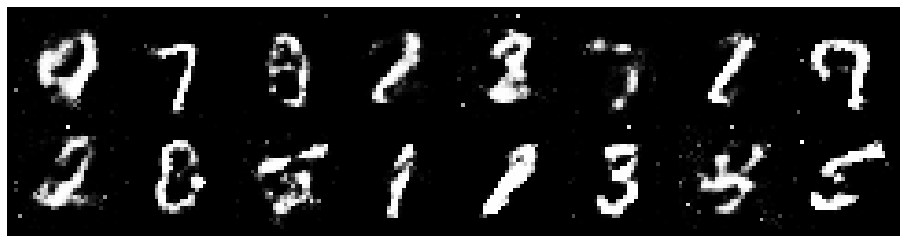

Epoch: [69/200], Batch Num: [400/600]
Discriminator Loss: 1.1310, Generator Loss: 2.5323
D(x): 0.5868, D(G(z)): 0.3328
gen_epochs:1 ,dis_epochs:1


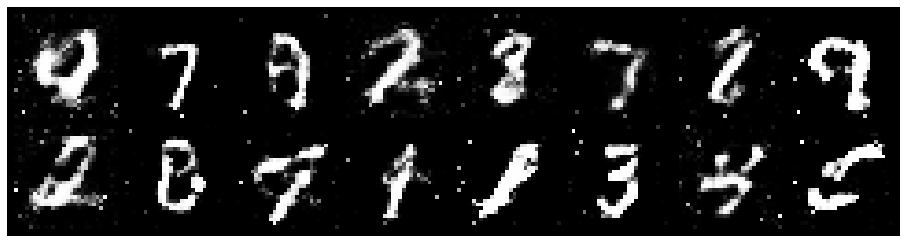

Epoch: [69/200], Batch Num: [500/600]
Discriminator Loss: 1.1748, Generator Loss: 2.0327
D(x): 0.5757, D(G(z)): 0.4042
gen_epochs:1 ,dis_epochs:1


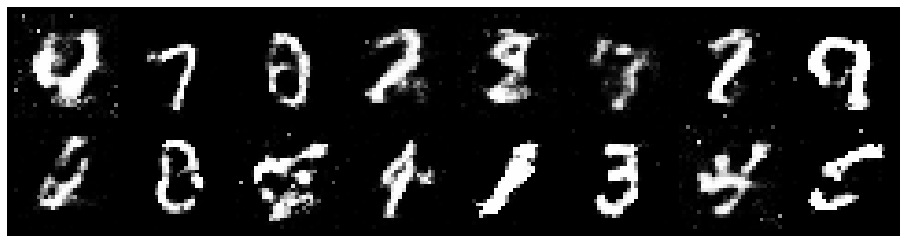

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.2174, Generator Loss: 1.9446
D(x): 0.5612, D(G(z)): 0.4151
gen_epochs:1 ,dis_epochs:1


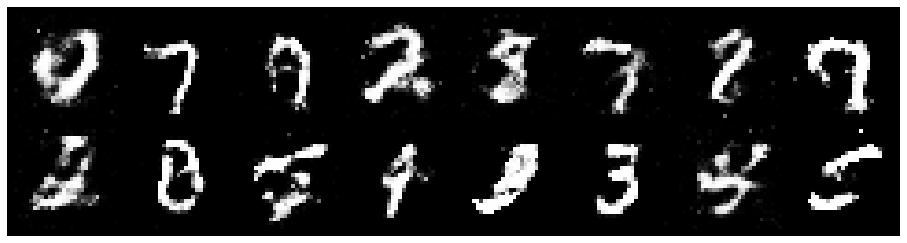

Epoch: [70/200], Batch Num: [100/600]
Discriminator Loss: 1.1586, Generator Loss: 1.8526
D(x): 0.5903, D(G(z)): 0.4170
gen_epochs:1 ,dis_epochs:1


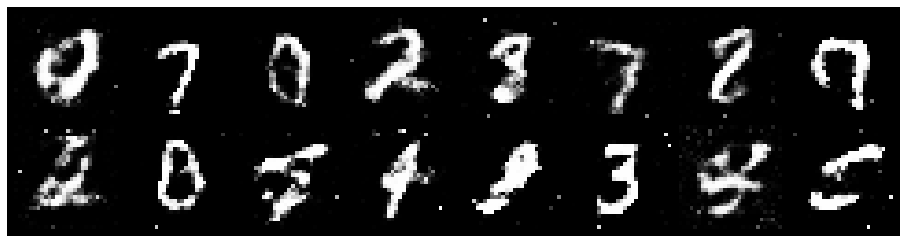

Epoch: [70/200], Batch Num: [200/600]
Discriminator Loss: 1.2804, Generator Loss: 1.8625
D(x): 0.5830, D(G(z)): 0.4748
gen_epochs:1 ,dis_epochs:1


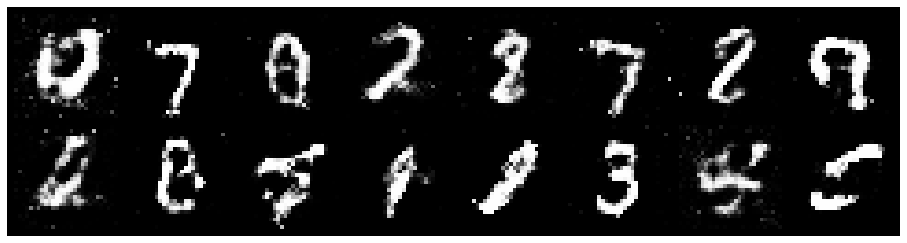

Epoch: [70/200], Batch Num: [300/600]
Discriminator Loss: 1.2482, Generator Loss: 1.8011
D(x): 0.5624, D(G(z)): 0.4419
gen_epochs:1 ,dis_epochs:1


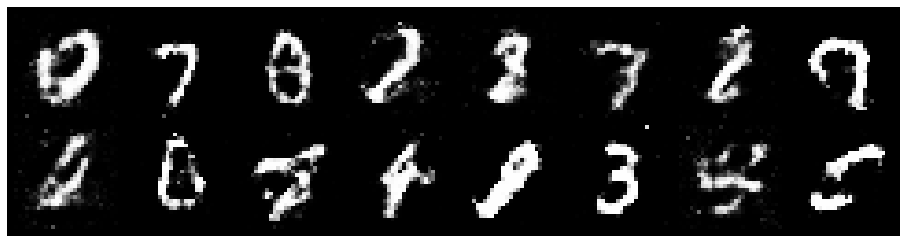

Epoch: [70/200], Batch Num: [400/600]
Discriminator Loss: 1.1738, Generator Loss: 1.9768
D(x): 0.6181, D(G(z)): 0.4335
gen_epochs:1 ,dis_epochs:1


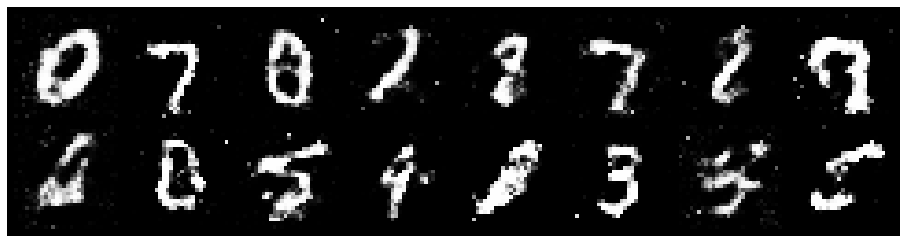

Epoch: [70/200], Batch Num: [500/600]
Discriminator Loss: 1.1750, Generator Loss: 1.9803
D(x): 0.5713, D(G(z)): 0.4074
gen_epochs:1 ,dis_epochs:1


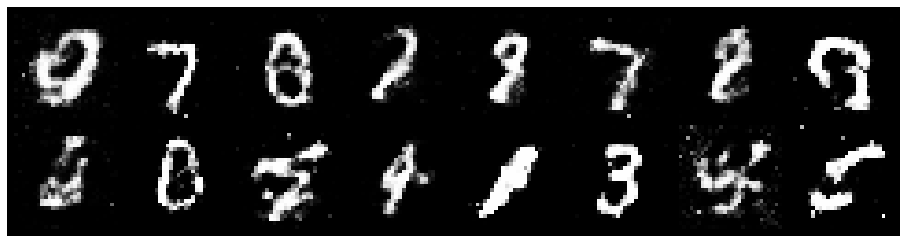

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.2096, Generator Loss: 1.8048
D(x): 0.5387, D(G(z)): 0.4188
gen_epochs:1 ,dis_epochs:1


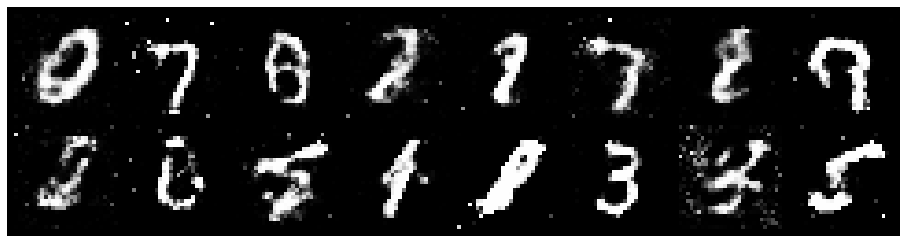

Epoch: [71/200], Batch Num: [100/600]
Discriminator Loss: 1.2907, Generator Loss: 1.7895
D(x): 0.5009, D(G(z)): 0.3983
gen_epochs:1 ,dis_epochs:1


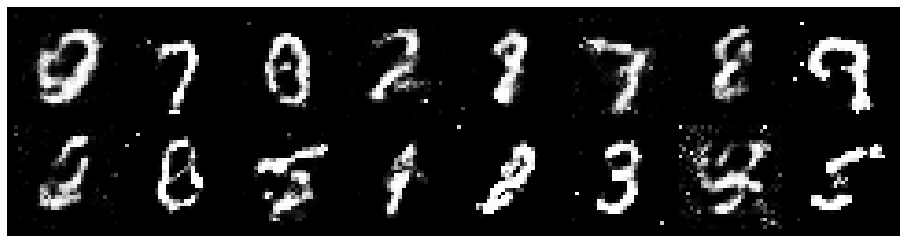

Epoch: [71/200], Batch Num: [200/600]
Discriminator Loss: 1.2874, Generator Loss: 1.6692
D(x): 0.5731, D(G(z)): 0.4883
gen_epochs:1 ,dis_epochs:1


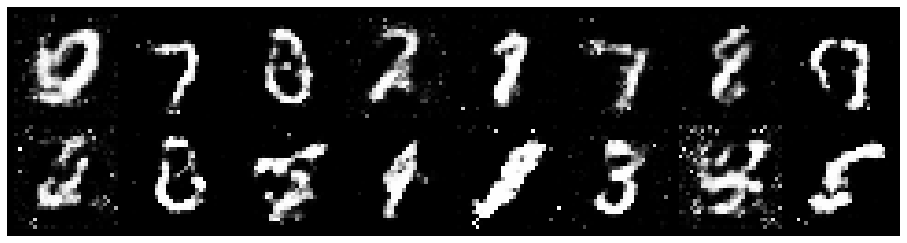

Epoch: [71/200], Batch Num: [300/600]
Discriminator Loss: 1.2518, Generator Loss: 1.8443
D(x): 0.5798, D(G(z)): 0.4552
gen_epochs:1 ,dis_epochs:1


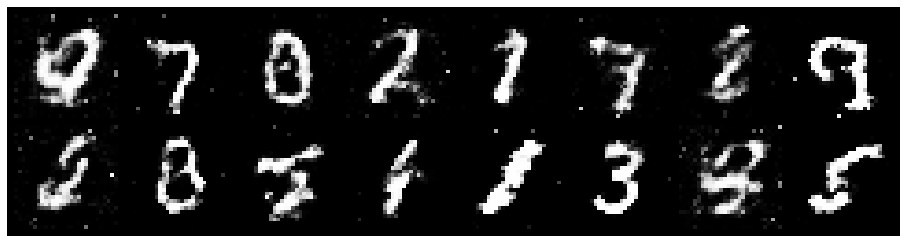

Epoch: [71/200], Batch Num: [400/600]
Discriminator Loss: 1.2162, Generator Loss: 1.8860
D(x): 0.5848, D(G(z)): 0.4397
gen_epochs:1 ,dis_epochs:1


KeyboardInterrupt: ignored

In [0]:


# Total number of epochs to train
num_epochs = 200
gen_epochs=1
dis_epochs=1
log_display=100
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
       
        # 1. Train Discriminator
        for i in range(dis_epochs):
          real_data = Variable(images_to_vectors(real_batch))
          # Generate fake data and detach 
          # (so gradients are not calculated for generator)
          fake_data = generator(noise(N)).detach()
          # Train D
          d_error, d_pred_real, d_pred_fake = \
                train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % log_display == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            # gen_epochs,dis_epochs=dis_epochs,gen_epochs
            
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )
            print('gen_epochs:{} ,dis_epochs:{}'.format(gen_epochs,dis_epochs))

In [0]:
gen_model_save_name = 'generator_model_a.pt'
dis_model_save_name = 'discriminator_model_a.pt'
gen_path=F"/gdrive/My Drive/Colab Notebooks/GANS/GAN_a/{gen_model_save_name}"
dis_path=F"/gdrive/My Drive/Colab Notebooks/GANS/GAN_a/{dis_model_save_name}"
torch.save(generator.state_dict(), gen_path)
torch.save(discriminator.state_dict(), dis_path)

In [0]:
!cp -r /content/runs /gdrive/My\ Drive/Colab\ Notebooks/GANS/GAN_a
!cp -r /content/data /gdrive/My\ Drive/Colab\ Notebooks/GANS/GAN_a


In [0]:
!pip install -qU tf-nightly


In [39]:
%reload_ext tensorboard
%tensorboard --logdir /content/runs

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2020-06-03 13:43:28.885702: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Traceback (most recent call last):
  File "/usr/local/bin/tensorboard", line 8, in <module>
    sys.exit(run_main())
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/main.py", line 75, in run_main
    app.run(tensorboard.main, flags_parser=tensorboard.configure)
  File "/usr/local/lib/python3.6/dist-packages/absl/app.py", line 299, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.6/dist-packages/absl/app.py", line 250, in _run_main
    sys.exit(main(argv))
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/program.py", line 290, in main
    return runner(self.flags) or 0
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/program.py", line 306, in _run_serve_subcommand
    server = self._make_server()
  File "/usr/local/lib/python3